# BUCV26




Name: Shahir Ali

Kaggle username: shahirsao

Private leaderboard rank: 6th

Total submissions: 29 during competition, 46 total

# Introduction

The objective of this project is to create a multi-task deep learning pipeline for regression of BMI and classification of sex from X-ray images of spines.

The value of prediction of simple features such as sex and BMI which can be found by simple asking/measurement at first seems unclear. However, a model that has been trained to infer simple properties of a patient from an X-ray image can be used as a basis for transfer learning. For example, the model being produced in this project could be fine tuned for the detection of osteoarthritis, which is more common in women and people with higher BMI.

Human inference of X-ray images requires highly trained professionals, and is costly in time. Computer vision methods would allow for a greater throughput of service to patients by making inference on raw images, without the need for human examination or manual feature extraction.

# Running Instructions

This code is written with the intention that the bucv26 file submitted alongside the notebook is in Google Drive.

# Installations

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install umap-learn

In [ ]:
!pip install torchxrayvision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.0/29.0 MB 74.4 MB/s eta 0:00:00


# Imports

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import cv2
import umap
from PIL import Image
from tqdm import tqdm
from collections import Counter
from scipy.stats import pearsonr, spearmanr, pointbiserialr
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split, StratifiedGroupKFold
from sklearn.metrics import (
    accuracy_score, roc_auc_score, f1_score, recall_score,
    confusion_matrix, mean_absolute_error, mean_squared_error,
    r2_score, roc_curve
)
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from torchvision.models import (
    efficientnet_b3, EfficientNet_B3_Weights,
    resnet18, ResNet18_Weights,
    densenet121, DenseNet121_Weights,
)
from google.colab.patches import cv2_imsho

# Data Loading and Pre-processing

In [ ]:
df = pd.read_csv("drive/MyDrive/bucv26/train_labels.csv")
df.head(20)

,anon_id,sex,bmi,filename
0,5956,0,21.7,5956_8270.jpg
1,5956,0,21.7,5956_1860.jpg
2,5956,0,21.7,5956_6390.jpg
3,5956,0,21.7,5956_6191.jpg
4,5956,0,21.7,5956_6734.jpg
5,5956,0,21.7,5956_7265.jpg
6,5956,0,21.7,5956_1466.jpg
7,5956,0,21.7,5956_5426.jpg
8,5956,0,21.7,5956_6578.jpg
9,5956,0,21.7,5956_9322.jpg


In [ ]:
# REMOVAL OF OUTLIER BMI RECORDS
df = df[df['bmi'] >= 15]

In [ ]:
folder_path = "drive/MyDrive/bucv26/test/"

files = [f for f in os.listdir(folder_path)
         if os.path.isfile(os.path.join(folder_path, f))]

test_df = pd.DataFrame(files, columns=["filename"])

test_df['anon_id'] = test_df['filename'].str[:4]

Since each person has 10 X-ray images, the train-val split must ensure that a each anon_id does not appear in both datasets

In [ ]:
# Get unique people
unique_ids = df["anon_id"].unique()

# Split people into train and val
train_ids, val_ids = train_test_split(
    unique_ids,
    test_size=0.15,      # 80% train, 20% val (adjust as needed)
    random_state=42
)

# Build dataframes
train_df = df[df["anon_id"].isin(train_ids)].reset_index(drop=True)
val_df   = df[df["anon_id"].isin(val_ids)].reset_index(drop=True)

In [ ]:


train_df["image"] = train_df["filename"].apply(lambda x: f"drive/MyDrive/bucv26/train/{x}")
df["image"] = df["filename"].apply(lambda x: f"drive/MyDrive/bucv26/train/{x}")
val_df["image"]   = val_df["filename"].apply(lambda x: f"drive/MyDrive/bucv26/train/{x}")

test_df_original = test_df.copy()
#--SWAP AS NEEDED--
#test_df["image"]   = test_df["filename"].apply(lambda x: f"drive/MyDrive/bucv26/cropped_test_data/{x}")
test_df["image"]   = test_df["filename"].apply(lambda x: f"drive/MyDrive/bucv26/test/{x}")

test_df_original["image"]   = test_df_original["filename"].apply(lambda x: f"drive/MyDrive/bucv26/test/{x}")


In [ ]:
test_df.head(20)

,filename,anon_id,image
0,2803_4538.jpg,2803,drive/MyDrive/bucv26/test/2803_4538.jpg
1,4202_7304.jpg,4202,drive/MyDrive/bucv26/test/4202_7304.jpg
2,3638_6996.jpg,3638,drive/MyDrive/bucv26/test/3638_6996.jpg
3,3338_4713.jpg,3338,drive/MyDrive/bucv26/test/3338_4713.jpg
4,4251_8336.jpg,4251,drive/MyDrive/bucv26/test/4251_8336.jpg
5,5094_2165.jpg,5094,drive/MyDrive/bucv26/test/5094_2165.jpg
6,2092_7682.jpg,2092,drive/MyDrive/bucv26/test/2092_7682.jpg
7,4302_3302.jpg,4302,drive/MyDrive/bucv26/test/4302_3302.jpg
8,5185_4889.jpg,5185,drive/MyDrive/bucv26/test/5185_4889.jpg
9,1144_7090.jpg,1144,drive/MyDrive/bucv26/test/1144_7090.jpg


In [ ]:
class MultiTaskLoss(nn.Module):
    """
    loss = alpha * BCE(sex) + (1 - alpha) * MSE(bmi)
    alpha=0.5 weights both tasks equally.
    """
    def __init__(self, alpha=0.5):
        super().__init__()
        self.alpha = alpha
        self.bce = nn.BCEWithLogitsLoss()
        self.mse = nn.MSELoss()

    def forward(self, sex_logit, sex_true, bmi_pred, bmi_true):
        l_sex = self.bce(sex_logit, sex_true)
        l_bmi = self.mse(bmi_pred, bmi_true)
        return self.alpha * l_sex + (1 - self.alpha) * l_bmi, l_sex, l_bmi


class MultiTaskLossBalanced(nn.Module):
    def __init__(self, alpha=0.5, pos_weight=None):
        super().__init__()
        self.alpha = alpha
        self.bce   = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
        self.mse   = nn.MSELoss()

    def forward(self, sex_logit, sex_true, bmi_pred, bmi_true):
        l_sex = self.bce(sex_logit, sex_true)
        l_bmi = self.mse(bmi_pred, bmi_true)
        return self.alpha * l_sex + (1 - self.alpha) * l_bmi, l_sex, l_bmi

In [ ]:
MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])


# Exploratory Data Analysis and Further Pre-Processing

## Basic Distribution and Data Integrity Checks

The class distribution of sex is approximately 60/40. This is definitely a workable distribution to use as is. Not too much imbalance to do anything like removing some of the majority class from the data, but enough to try using techniques such as weighting the classes.

In [ ]:
print(df["sex"].value_counts())
print(df["bmi"].mean())

sex
0    610
1    390
Name: count, dtype: int64
23.196


In [ ]:
image_avg_bmi = df.groupby('sex')['bmi'].mean()

print("--- Average BMI by Sex ---")
print(f"Female (0): {image_avg_bmi.get(0, 'No Data'):.2f}")
print(f"Male (1):   {image_avg_bmi.get(1, 'No Data'):.2f}")

--- Average BMI by Sex ---
Female (0): 24.11
Male (1):   21.77


Checking that each anon_id does indeed have an equal representation in the dataset to avoid bias. This checks out.

In [ ]:
# 1. Get the exact count of images for each patient
patient_counts = df['anon_id'].value_counts()

# 2. Get a high-level summary of the distribution
print("--- Image Distribution Summary ---")
print(f"Total Unique Patients: {len(patient_counts)}")
print(f"Max images for a single patient: {patient_counts.max()}")
print(f"Min images for a single patient: {patient_counts.min()}")
print(f"Average images per patient:      {patient_counts.mean():.1f}")

# 3. (Optional) See how many patients have exactly 'X' number of images
print("\n--- How many patients have exactly X images? ---")
print(patient_counts.value_counts().sort_index())

--- Image Distribution Summary ---
Total Unique Patients: 100
Max images for a single patient: 10
Min images for a single patient: 10
Average images per patient:      10.0

--- How many patients have exactly X images? ---
count
10    100
Name: count, dtype: int64


Checking that each anon_id has the same BMI and Sex in all of their 10 images, since they've been taken from the same person so they should all be the same.

In [ ]:
# Group and find patients with more than 1 unique value
sex_counts = df.groupby('anon_id')['sex'].nunique()
bmi_counts = df.groupby('anon_id')['bmi'].nunique()

# Check if the maximum number of unique variations for any patient is exactly 1
if sex_counts.max() == 1 and bmi_counts.max() == 1:
    print("✅ Perfect consistency! Every anon_id has the exact same sex and BMI in all records.")
else:
    print("❌ Discrepancy found! Some patients have conflicting labels across their records.")

✅ Perfect consistency! Every anon_id has the exact same sex and BMI in all records.


## Tabular Features Graph

The BMI Distribution Graph clearly shows some outliers that must be removed from the training data. I failed to remove these outliers for many of my models, and my Kaggle results after remedying this.

--- 1. TABULAR EDA (PATIENT LEVEL) ---
Analyzing 100 unique patients...


/tmp/ipykernel_2998/2882171655.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=patient_df, x='sex', ax=axes[0], palette='pastel')
/tmp/ipykernel_2998/2882171655.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(['Female (0)', 'Male (1)'])
/tmp/ipykernel_2998/2882171655.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=patient_df, x='sex', y='bmi', ax=axes[2], palette='pastel')
/tmp/ipykernel_2998/2882171655.py:28: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[2].set_xtickla

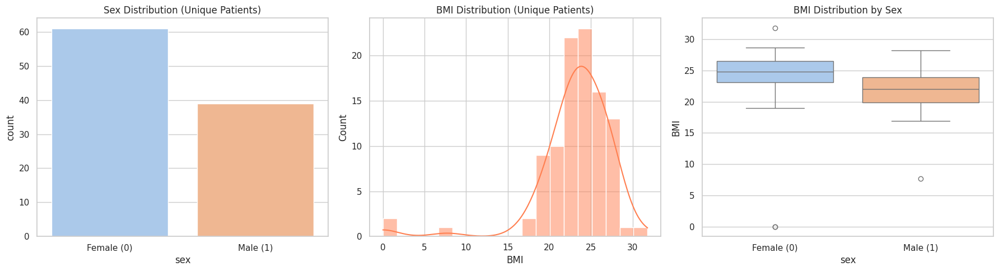

In [ ]:
# Set plotting style for clean visuals
sns.set_theme(style="whitegrid")
patient_level_df = df.drop_duplicates(subset=['anon_id'])

def run_tabular_eda(patient_df):

    print("--- 1. TABULAR EDA (PATIENT LEVEL) ---")
    print(f"Analyzing {len(patient_df)} unique patients...")

    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # 1. Sex Distribution
    sns.countplot(data=patient_df, x='sex', ax=axes[0], palette='pastel')
    axes[0].set_title('Sex Distribution (Unique Patients)')
    axes[0].set_xticklabels(['Female (0)', 'Male (1)'])

    # 2. BMI Distribution
    sns.histplot(data=patient_df, x='bmi', kde=True, ax=axes[1], color='coral')
    axes[1].set_title('BMI Distribution (Unique Patients)')
    axes[1].set_xlabel('BMI')

    # 3. BMI by Sex
    sns.boxplot(data=patient_df, x='sex', y='bmi', ax=axes[2], palette='pastel')
    axes[2].set_title('BMI Distribution by Sex')
    axes[2].set_xticklabels(['Female (0)', 'Male (1)'])
    axes[2].set_ylabel('BMI')

    plt.tight_layout()
    plt.show()

run_tabular_eda(patient_level_df)

## Mean Image

There's not much that can be seen here, but there is a clear black line in the middle where the spine tends to be, as well as the white parts bordering it showing the torso. Curiously the right edge of the mean image shows a much higher contrast from the torso than the left edge, where the separation from the torso is more washed out.




--- 2. IMAGE METADATA & INTENSITIES ---
Analyzing 1000 total images...


<Figure size 640x480 with 0 Axes>

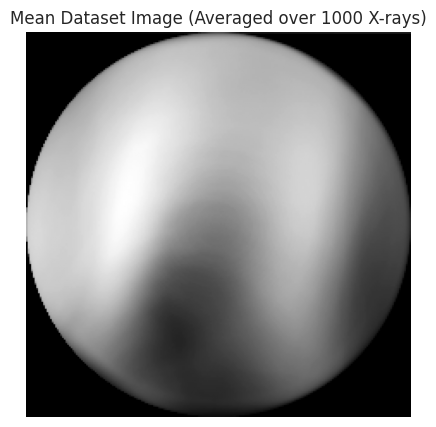

In [ ]:


def run_image_metadata_eda(df):

    print("\n--- 2. IMAGE METADATA & INTENSITIES ---")
    print(f"Analyzing {len(df)} total images...")

    widths, heights, aspect_ratios = [], [], []
    mean_pixel_vals = []

    # For Mean Image calculation
    sum_image = None
    count = 0
    target_size = (224, 224)

    for path in df['image'].dropna():
        if not os.path.exists(path):
            continue

        # Load grayscale
        img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
        if img is None:
            continue

        h, w = img.shape
        widths.append(w)
        heights.append(h)
        aspect_ratios.append(w / h)
        mean_pixel_vals.append(img.mean())

        # Accumulate for the "Average Patient" image
        resized = cv2.resize(img, target_size)
        if sum_image is None:
            sum_image = np.zeros_like(resized, dtype=np.float64)
        sum_image += resized
        count += 1


    plt.tight_layout()
    plt.show()

    # Plot the Mean Image
    if count > 0:
        mean_image = (sum_image / count).astype(np.uint8)
        plt.figure(figsize=(5, 5))
        plt.imshow(mean_image, cmap='gray')
        plt.title(f'Mean Dataset Image (Averaged over {count} X-rays)')
        plt.axis('off')
        plt.show()

run_image_metadata_eda(df)



--- 2. IMAGE METADATA & INTENSITIES ---
Analyzing 195 total images...


<Figure size 640x480 with 0 Axes>

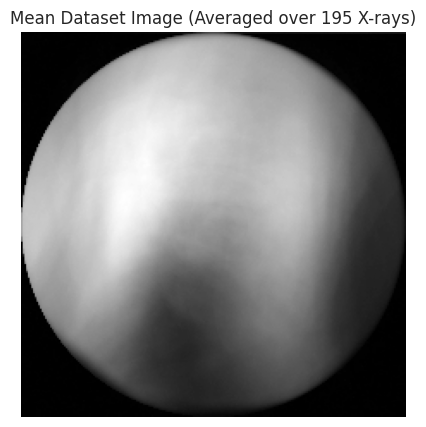

In [ ]:
run_image_metadata_eda(test_df)


## Displaying Image Samples

Nothing in any of the images that allows male and female x-ray images to be differentiable to the naked and untrained eye, nor high BMI from low BMI


--- 3. CROSS-MODAL VISUAL EDA ---


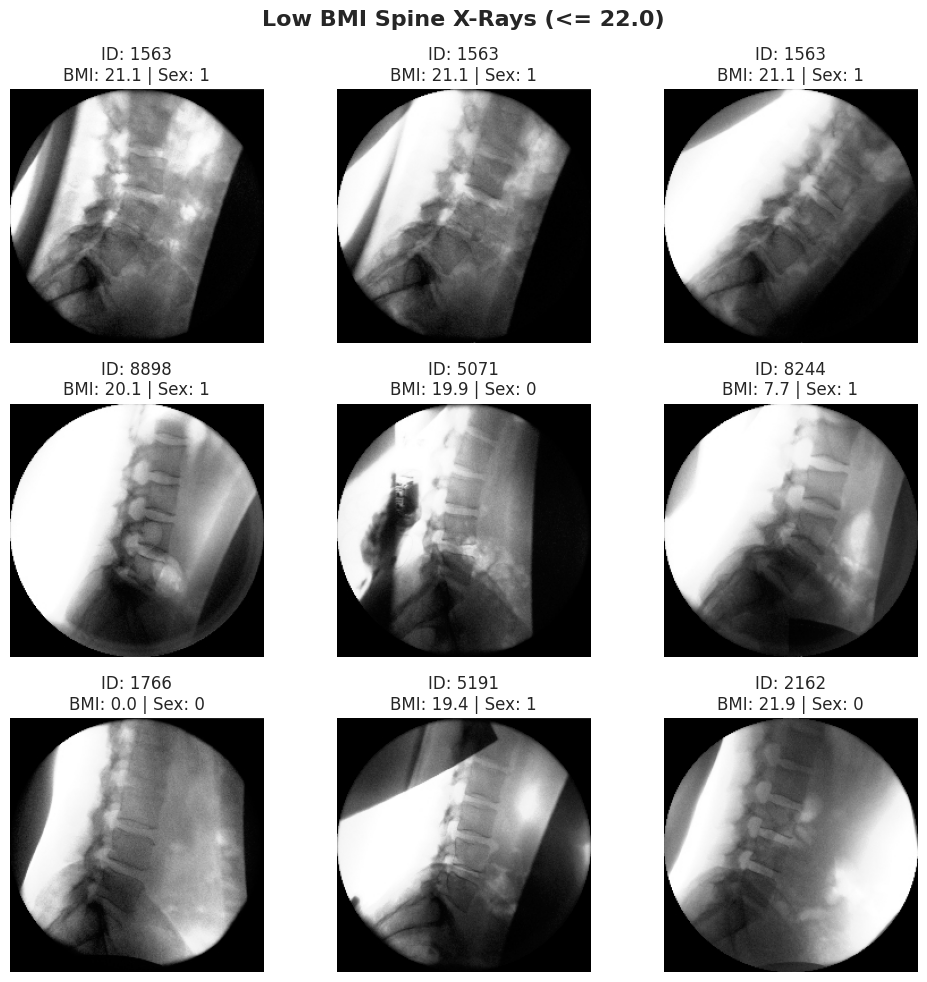

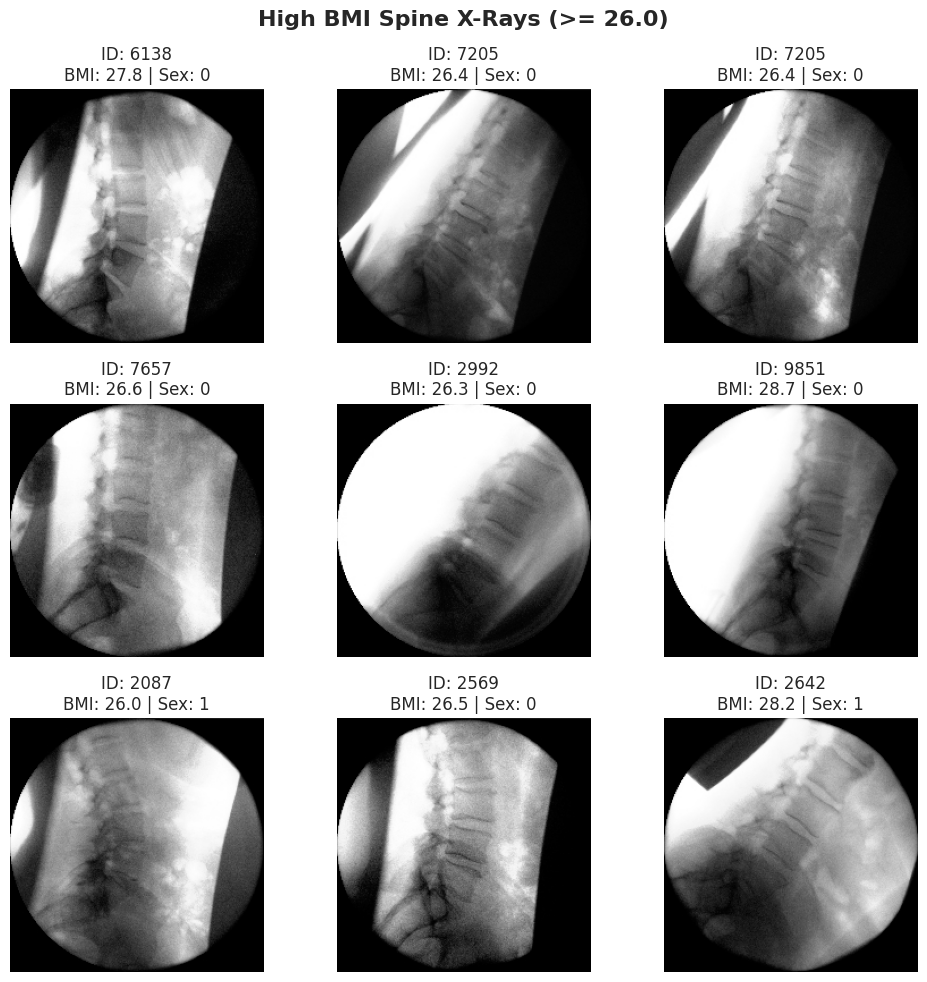

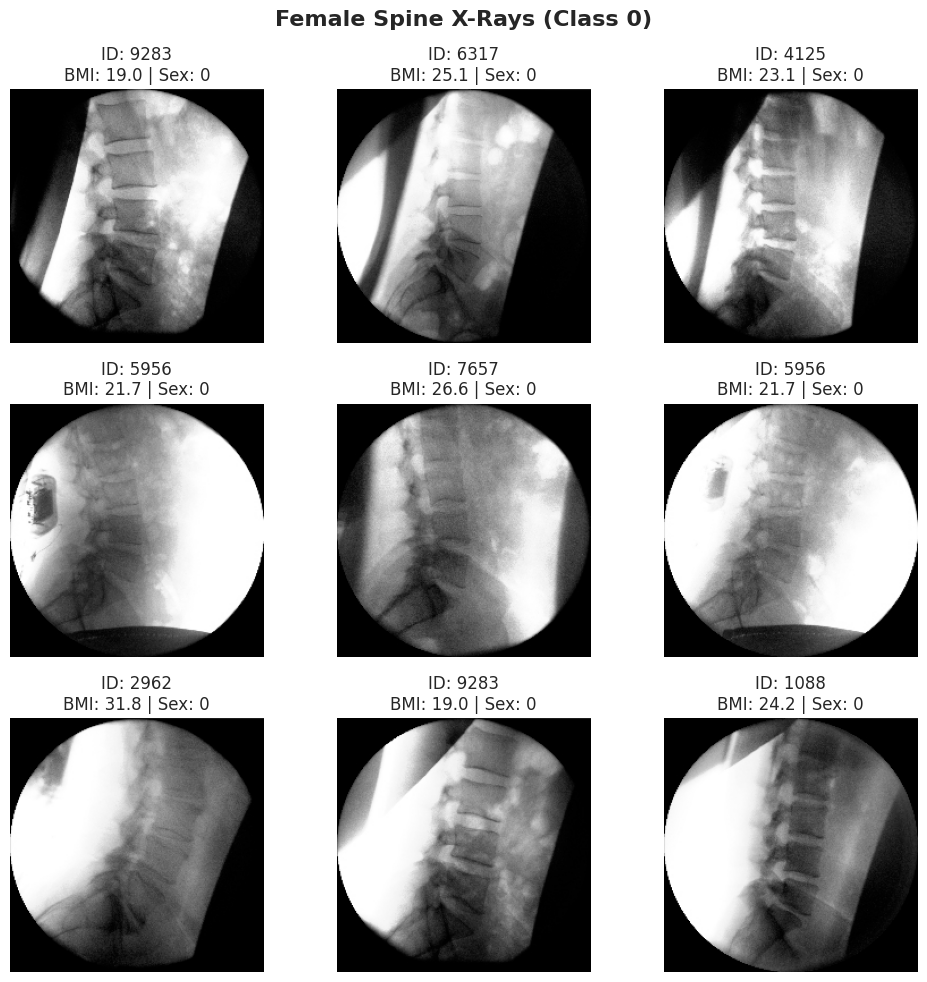

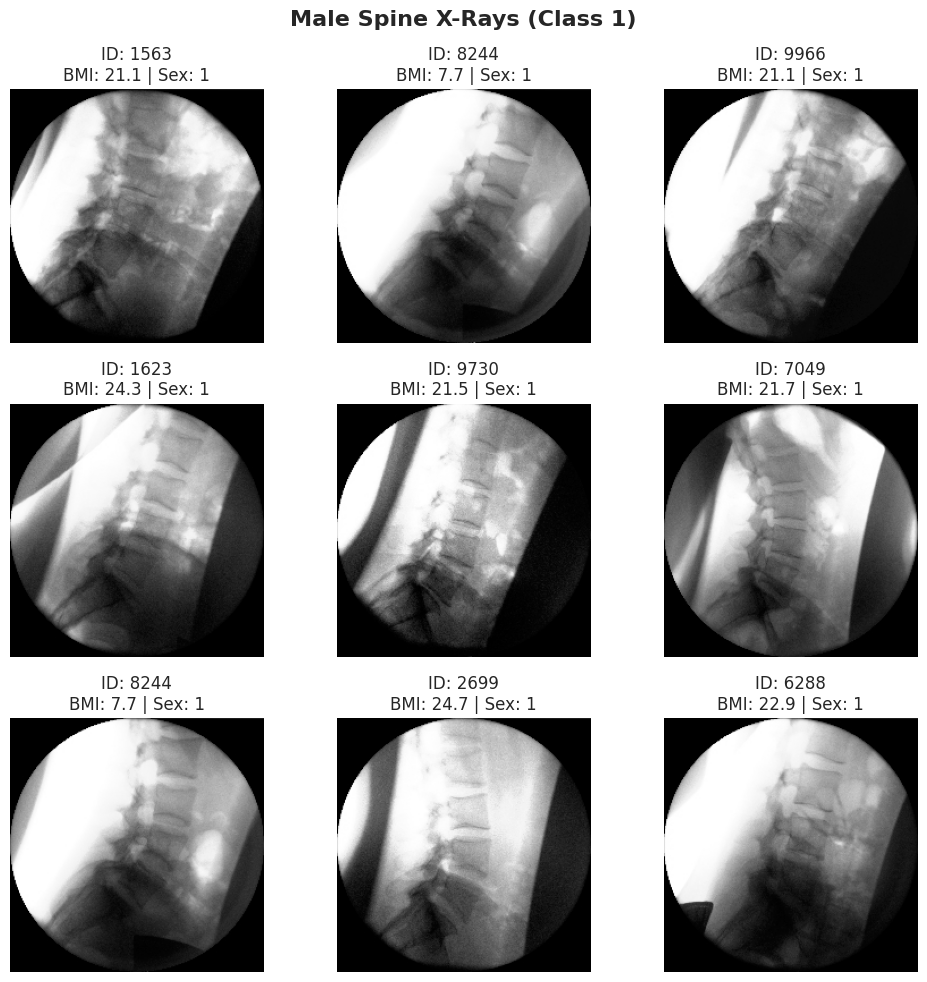

In [ ]:

def plot_image_grid(df, title, num_images=9):
    """Helper function to plot a 3x3 grid of images from the dataframe"""
    # Sample safely in case there are fewer than 9 images in the slice
    sample_df = df.sample(min(num_images, len(df)))

    fig, axes = plt.subplots(3, 3, figsize=(10, 10))
    fig.suptitle(title, fontsize=16, weight='bold')

    for ax, (_, row) in zip(axes.flatten(), sample_df.iterrows()):
        if os.path.exists(row['image']):
            img = cv2.imread(row['image'], cv2.IMREAD_GRAYSCALE)
            ax.imshow(img, cmap='gray')
            ax.set_title(f"ID: {row['anon_id']}\nBMI: {row['bmi']:.1f} | Sex: {row['sex']}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()


def run_cross_modal_eda(df):
    print("\n--- 3. CROSS-MODAL VISUAL EDA ---")

    # Calculate BMI quartiles mathematically
    low_bmi_thresh = df['bmi'].quantile(0.25)
    high_bmi_thresh = df['bmi'].quantile(0.75)

    # 1. Low BMI vs High BMI
    low_bmi_df = df[df['bmi'] <= low_bmi_thresh]
    high_bmi_df = df[df['bmi'] >= high_bmi_thresh]

    plot_image_grid(low_bmi_df, title=f"Low BMI Spine X-Rays (<= {low_bmi_thresh:.1f})")
    plot_image_grid(high_bmi_df, title=f"High BMI Spine X-Rays (>= {high_bmi_thresh:.1f})")

    # 2. Male vs Female Grids
    female_df = df[df['sex'] == 0]
    male_df = df[df['sex'] == 1]

    plot_image_grid(female_df, title="Female Spine X-Rays (Class 0)")
    plot_image_grid(male_df, title="Male Spine X-Rays (Class 1)")

run_cross_modal_eda(df)

## Checking Image Properties and Integrity

For this task all images must ideally be the same size with the same framing of the subject. In the training set, all images are 224x224 pixels, and are framed as a circular centered image within black borders.

In [ ]:
def analyze_dimensions(image_paths):
    print(f"Scanning {len(image_paths)} images (Read-Only)...")

    resolutions = []
    corrupted_count = 0

    for path in image_paths:
        if not os.path.exists(path):
            corrupted_count += 1
            continue

        try:
            # Image.open lazily reads just the header metadata, not the pixels
            with Image.open(path) as img:
                resolutions.append(img.size) # returns a tuple: (width, height)
        except Exception:
            corrupted_count += 1

    # 1. Error Reporting
    if corrupted_count > 0:
        print(f"⚠️ Could not read {corrupted_count} files (missing or corrupted).")

    if not resolutions:
        print("No valid images found to analyze.")
        return

    # 2. Resolution Summary
    res_counts = Counter(resolutions)

    print("\n--- Image Resolution Report ---")
    if len(res_counts) == 1:
        w, h = resolutions[0]
        print(f"✅ Perfect uniformity! All images are exactly {w}x{h}.")
    else:
        print(f"⚠️ Found {len(res_counts)} different image sizes.")

        print("\nTop 5 Most Common Sizes (Width x Height):")
        for (w, h), count in res_counts.most_common(5):
            print(f"  - {w}x{h} px : {count} images")

        # 3. Extremes
        widths = [r[0] for r in resolutions]
        heights = [r[1] for r in resolutions]

        print("\n--- Dimension Extremes ---")
        print(f"Widths:  Min = {min(widths)} px  |  Max = {max(widths)} px")
        print(f"Heights: Min = {min(heights)} px  |  Max = {max(heights)} px")


analyze_dimensions(df['image'].tolist())

Scanning 1000 images (Read-Only)...

--- Image Resolution Report ---
✅ Perfect uniformity! All images are exactly 224x224.


However, in the test set, some of the images have double the side length.

In [ ]:
analyze_dimensions(test_df['image'].tolist())

Scanning 195 images (Read-Only)...

--- Image Resolution Report ---
⚠️ Found 2 different image sizes.

Top 5 Most Common Sizes (Width x Height):
  - 224x224 px : 142 images
  - 448x448 px : 53 images

--- Dimension Extremes ---
Widths:  Min = 224 px  |  Max = 448 px
Heights: Min = 224 px  |  Max = 448 px


Displaying one of these images shows that the 224x224 pixels of the sample are surrounded by a white speckled black background. There is also a small dark blue line along the top right edge.

These images will be pre-processed in order to bring them in line with the rest of the data.

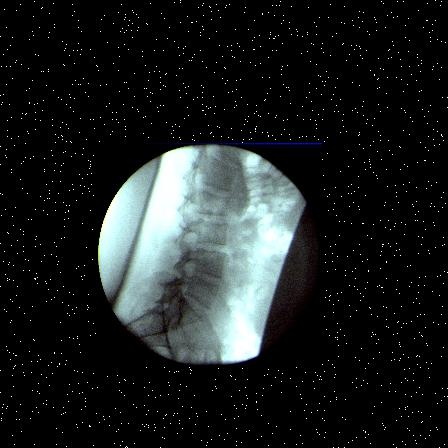

In [ ]:
img = cv2.imread("drive/MyDrive/bucv26/test/1290_2619.jpg")
cv2_imshow(img)


## Cleaning up test images (not needed to run again)

My idea for cleaning the test images was to use the small mark of blue at the top of the desired section for where to crop each image. This function finds the co-ordinates of the pixel that is furthest right which has a level of blue over a certain threshold (as well as a level of red and green below a certain threshold in order to exclude the white dots) and sets it as the top right coordinate of the crop. Since the desired section is always 224x224, the other 3 corners are easily found.

It has been considered that some images being larger may actually be a confounding variable, and there may be some link between all of them. However, since there are no labelled instances of this in the training data there is no good way of testing this or turning it to my advantage.

In [ ]:
def crop_to_blue_pixel(image_path, crop_size=224, blue_threshold=40):

    # Load image
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not load image {image_path}")
        return None, None

    # Convert BGR to RGB
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    height, width = img_rgb.shape[:2]

    # Find all pixels where blue channel > threshold
    mask = (
        (img_rgb[:, :, 2] > blue_threshold) &   # Blue must be high
        (img_rgb[:, :, 0] < 100) &  # Red must be low
        (img_rgb[:, :, 1] < 100)    # Green must be low
    )


    matching_coords = np.argwhere(mask)

    if len(matching_coords) == 0:
        print(f"Error: No pixel found with blue value over {blue_threshold}")
        return None, None

    # Find the furthest right (max x)
    furthest_right_idx = np.argmax(matching_coords[:, 1])
    pixel_y, pixel_x = matching_coords[furthest_right_idx]

    print(f"Found pixel at: ({pixel_x}, {pixel_y}) with blue value: {img_rgb[pixel_y, pixel_x, 2]}")

    # Calculate crop boundaries (pixel in top-right corner)
    crop_left = pixel_x - crop_size + 1
    crop_top = pixel_y
    crop_right = pixel_x + 1
    crop_bottom = pixel_y + crop_size

    # Check bounds
    if crop_left < 0:
        print(f"Error: Crop extends beyond left edge")
        return None, (pixel_x, pixel_y)
    if crop_bottom > height:
        print(f"Error: Crop extends beyond bottom edge")
        return None, (pixel_x, pixel_y)

    # Crop and return in BGR for OpenCV compatibility
    cropped = img[crop_top:crop_bottom, crop_left:crop_right]

    return cropped, (pixel_x, pixel_y)

In [ ]:
def batch_crop_images(dataframe, output_dir='cropped_images',
                     blue_threshold=40, crop_size=224):

    # Create output directory
    os.makedirs(output_dir, exist_ok=True)

    results = []

    for idx in tqdm(range(len(dataframe)), desc="Cropping images"):
        img_path = dataframe.iloc[idx]['image']

        # Get filename
        filename = os.path.basename(img_path)
        output_path = os.path.join(output_dir, filename)

        # Crop image
        # Fix: Pass crop_size and blue_threshold (from target_color[2]) in the correct order
        cropped, pixel_loc = crop_to_blue_pixel(img_path, crop_size=crop_size, blue_threshold=blue_threshold)

        if cropped is not None:
            # Save cropped image
            cv2.imwrite(output_path, cropped)

            results.append({
                'original_image': img_path,
                'cropped_image': output_path,
                'pixel_x': pixel_loc[0],
                'pixel_y': pixel_loc[1],
                'success': True
            })
        else:
            results.append({
                'original_image': img_path,
                'cropped_image': None,
                'pixel_x': pixel_loc[0] if pixel_loc else None,
                'pixel_y': pixel_loc[1] if pixel_loc else None,
                'success': False
            })

    results_df = pd.DataFrame(results)

    # Summary
    success_count = results_df['success'].sum()
    total_count = len(results_df)
    print(f"\nProcessing complete:")
    print(f"  Successful: {success_count}/{total_count} ({success_count/total_count*100:.1f}%)")
    print(f"  Failed: {total_count - success_count}/{total_count}")

    return results_df


#Example usage
results = batch_crop_images(test_df, output_dir='drive/MyDrive/bucv26/cropped_test_data')
results.to_csv('crop_results.csv', index=False)


## Blur Scores

Using a Laplacian edge detection kernel, a score was computed for each image of its level of blurriness.

The range and distribution of scores for the training set shows that most of the training images have a high score of blurriness.

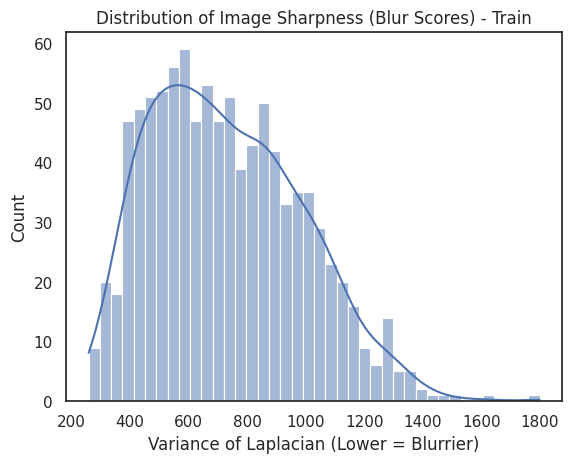

In [ ]:
def calculate_blur(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None: return None
    # Calculate the variance of the Laplacian
    return cv2.Laplacian(img, cv2.CV_64F).var()

# Apply to your dataframe
df['blur_score'] = df['image'].apply(calculate_blur)

# Plot the distribution
sns.histplot(df['blur_score'], bins=40, kde=True)
plt.title("Distribution of Image Sharpness (Blur Scores) - Train")
plt.xlabel("Variance of Laplacian (Lower = Blurrier)")
plt.show()

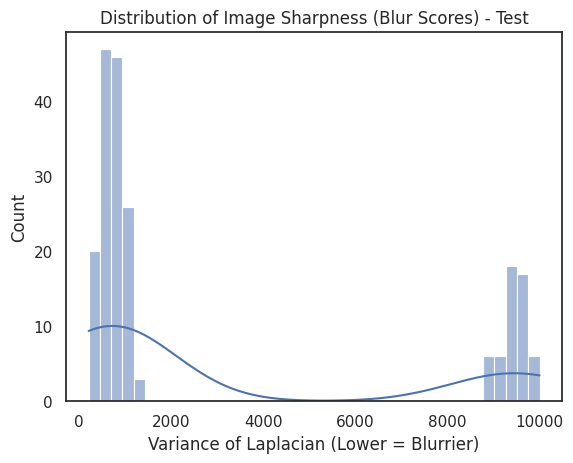

In [ ]:
test_blur_df = pd.DataFrame()

test_blur_df['blur_score'] = test_df['image'].apply(calculate_blur)

# Plot the distribution
sns.histplot(test_blur_df['blur_score'], bins=40, kde=True)
plt.title("Distribution of Image Sharpness (Blur Scores) - Test")
plt.xlabel("Variance of Laplacian (Lower = Blurrier)")
plt.show()

The average blur score of the test set after cleaning is slightly lower than the training set, but still comparable.

In [ ]:
print("--- Average Blur  ---")
print(f"Train: {df['blur_score'].mean():.2f}")
print(f"Test: {test_blur_df['blur_score'].mean():.2f}")

--- Average Blur  ---
Train: 730.44
Test: 3094.15


Though this was not considered during my experiments, it was later considered that blur score could have been used as a feature during training, and the cells below show that there is some relationship between blur and BMI/sex. However, this was probably picked up on by the CNN models anyway.

In [ ]:
image_avg_blur = df.groupby('sex')['blur_score'].mean()

print("--- Average blur by Sex ---")
print(f"Female (0): {image_avg_blur.get(0, 'No Data'):.2f}")
print(f"Male (1):   {image_avg_blur.get(1, 'No Data'):.2f}")

--- Average blur by Sex ---
Female (0): 757.44
Male (1):   688.53


In [ ]:
# Calculate point-biserial correlation
corr_coef, p_value = pointbiserialr(df['sex'], df['blur_score'])

print(f"Point-Biserial Correlation: {corr_coef:.4f}")
print(f"p-value: {p_value:e}")

Point-Biserial Correlation: -0.1314
p-value: 4.055997e-05


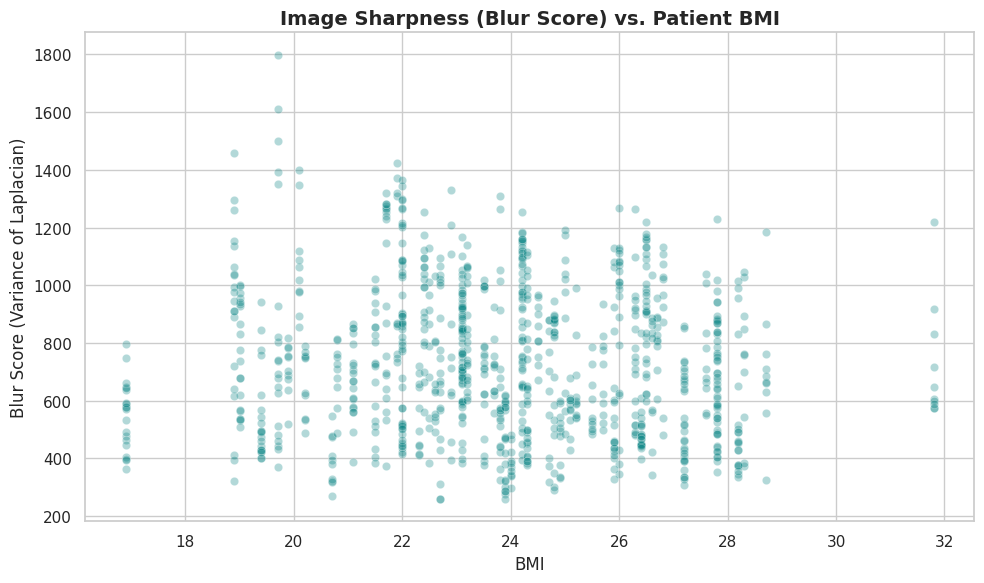

In [ ]:
# Set the style
sns.set_theme(style="whitegrid")

# Create the figure
plt.figure(figsize=(10, 6))

# Plot the scatter
# We use alpha=0.6 to make the dots slightly transparent
sns.scatterplot(data=df, x='bmi', y='blur_score', color='teal', alpha=0.3)

# Add titles and labels
plt.title('Image Sharpness (Blur Score) vs. Patient BMI', fontsize=14, weight='bold')
plt.xlabel('BMI', fontsize=12)
plt.ylabel('Blur Score (Variance of Laplacian)', fontsize=12)

# Optional: Add a horizontal line at your chosen "blur cutoff" threshold
# plt.axhline(y=100, color='red', linestyle='--', label='Suggested Cutoff')

plt.tight_layout()
plt.show()

In [ ]:
# 1. Pearson Correlation (measures linear relationship)
pearson_coef, p_val_pearson = pearsonr(df['bmi'], df['blur_score'])

# 2. Spearman Rank Correlation (measures non-linear, monotonic relationships)
spearman_coef, p_val_spearman = spearmanr(df['bmi'], df['blur_score'])

print("--- Correlation Report ---")
print(f"Pearson Coef:  {pearson_coef:.4f}  (p-value: {p_val_pearson:e})")
print(f"Spearman Coef: {spearman_coef:.4f}  (p-value: {p_val_spearman:e})")

# Interpret the p-value
if p_val_spearman < 0.05:
    print("\n✅ The relationship is statistically significant (p < 0.05).")
else:
    print("\n❌ No statistically significant relationship found.")

--- Correlation Report ---
Pearson Coef:  -0.0773  (p-value: 1.597390e-02)
Spearman Coef: -0.0810  (p-value: 1.158883e-02)

✅ The relationship is statistically significant (p < 0.05).


## Deep Feature Clustering



This technique uses a pre-trained image model to enumerate each image into a 512-dimensional vector, which is then flattened into two dimensions using an algorithm and plotted as a scatter plot to show class separation.

this first algorithm did not show much separation between classes so I tried a different one.

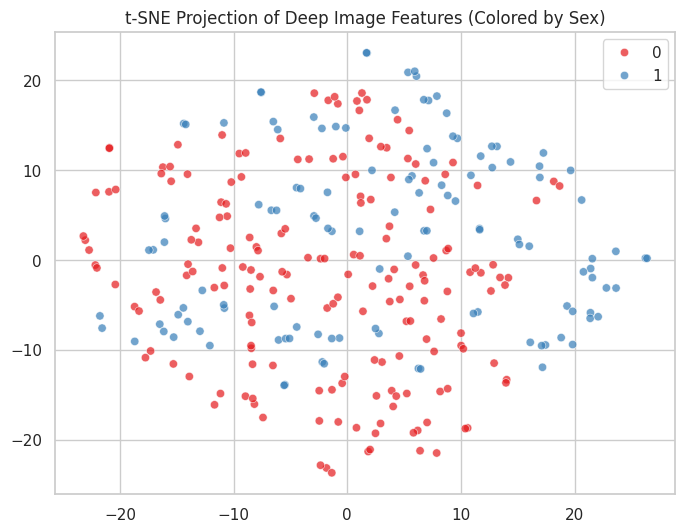

In [ ]:

# 1. Load a pre-trained feature extractor
resnet = models.resnet18(weights='IMAGENET1K_V1')
resnet.fc = torch.nn.Identity() # Remove the final classification layer
resnet.eval()

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3), # Force 3 channels for ResNet
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

features = []
labels_sex = []

# 2. Extract Features (Limit to a sample of 300 for speed during EDA)
sample_df = df.sample(min(300, len(df)))

with torch.no_grad():
    for _, row in sample_df.iterrows():
        img = cv2.imread(row['image'], cv2.IMREAD_GRAYSCALE)
        if img is None: continue

        tensor = transform(img).unsqueeze(0)
        emb = resnet(tensor).numpy().flatten()

        features.append(emb)
        labels_sex.append(row['sex'])

# Convert the list of feature arrays into a single NumPy array
features_array = np.array(features)

# 3. Reduce to 2D with t-SNE
tsne = TSNE(n_components=2, random_state=42)
reduced_features = tsne.fit_transform(features_array)

# 4. Plot the results
plt.figure(figsize=(8, 6))
sns.scatterplot(x=reduced_features[:,0], y=reduced_features[:,1],
                hue=labels_sex, palette='Set1', alpha=0.7)
plt.title("t-SNE Projection of Deep Image Features (Colored by Sex)")
plt.show()

UMAP shows much more separation between classes, which is a strong indication that the problem of sex classification from X-ray images of spines is actually tractable in the first place. There does also appear to be some pattern in the graph for BMI.

Extracting deep features...
Running UMAP dimensionality reduction...


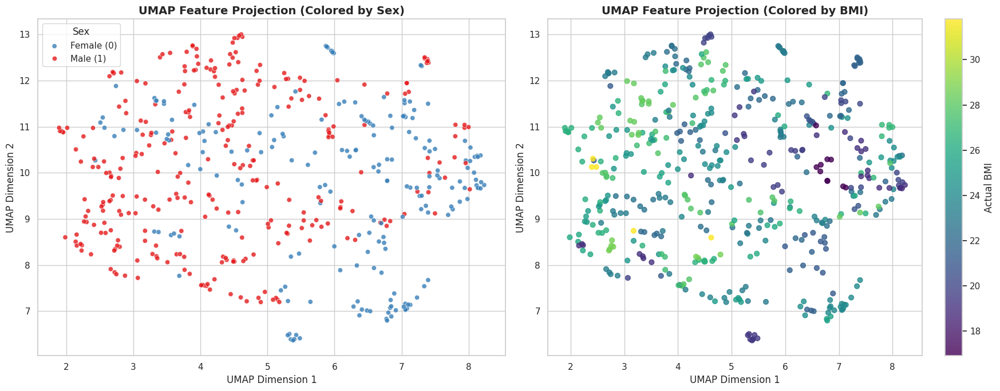

In [ ]:

# 1. Load a pre-trained feature extractor (ResNet or DenseNet)
model = models.resnet18(weights='IMAGENET1K_V1')
model.fc = torch.nn.Identity() # Strip final classifier
model.eval()

# Set up ImageNet matching transform
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=3), # Copy 1-channel X-ray to 3 channels
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

features = []
labels_sex = []
labels_bmi = []

# Sample rows for the visualization (UMAP is fast, you can do 500+ safely)
sample_df = df.sample(min(500, len(df)), random_state=42)

print("Extracting deep features...")
with torch.no_grad():
    for _, row in sample_df.iterrows():
        img = cv2.imread(row['image'], cv2.IMREAD_GRAYSCALE)
        if img is None:
            continue

        tensor = transform(img).unsqueeze(0)
        embedding = model(tensor).numpy().flatten()

        features.append(embedding)
        labels_sex.append(row['sex'])
        labels_bmi.append(row['bmi'])

features = np.array(features)

# 2. Initialize and Run UMAP
print("Running UMAP dimensionality reduction...")
reducer = umap.UMAP(
    n_neighbors=15,     # Balance between local (low) and global (high) structure
    min_dist=0.1,       # How tightly UMAP packs points together (0.0 = tight clusters)
    n_components=2,     # Reduce down to 2D
    metric='cosine',    # Crucial for deep embeddings; measures vector angles rather than Euclidean distance
    random_state=42
)
reduced_embeddings = reducer.fit_transform(features)

# 3. Plotting the Results
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Plot A: Discrete Labels (Sex)
sns.scatterplot(
    x=reduced_embeddings[:, 0],
    y=reduced_embeddings[:, 1],
    hue=labels_sex,
    palette='Set1',
    alpha=0.8,
    ax=axes[0]
)
axes[0].set_title("UMAP Feature Projection (Colored by Sex)", fontsize=14, weight='bold')
axes[0].set_xlabel("UMAP Dimension 1")
axes[0].set_ylabel("UMAP Dimension 2")
axes[0].legend(title="Sex", labels=['Female (0)', 'Male (1)'])

# Plot B: Continuous Labels (BMI)
scatter = axes[1].scatter(
    reduced_embeddings[:, 0],
    reduced_embeddings[:, 1],
    c=labels_bmi,
    cmap='viridis',
    alpha=0.8,
    s=40
)
fig.colorbar(scatter, ax=axes[1], label='Actual BMI')
axes[1].set_title("UMAP Feature Projection (Colored by BMI)", fontsize=14, weight='bold')
axes[1].set_xlabel("UMAP Dimension 1")
axes[1].set_ylabel("UMAP Dimension 2")

plt.tight_layout()
plt.show()

# Mean BMI/Random Sex



A submission with all columns containing the mean BMI and random sex was submitted as a baseline, in order to gauge how much better any estimator may be than simply guessing.

This scored 0.1810 on the public leaderboard

In [ ]:
submission_df = pd.DataFrame({
    "filename": test_df["filename"].values,
    "sex": np.random.randint(0, 2, size=len(test_df)),
    "bmi": [23.196] * len(test_df)
})

submission_df.to_csv("submission_1302_1.csv", index=False)


# Systematic Experimentation for Model Improvement

## Two models or one model?

All of the models in this project use the same backbone for learning before splitting into two separate heads for classification of sex and regression of BMI. This has been done for a number of reasons:

*   It has been observed that multi-task models can show comparable or improved performance versus multiple models trained separately.
*   It halves the number of models required to optimise and train.
*   It makes the resulting models more useful, as in being trained in a multi-tasking manner, they will learn a more general representation of spinal anatomy than they would being optimised on a single task alone, and this makes them more suited as a basis for transfer learning.

## Dataset Class

In [ ]:
class XRayDataset(Dataset):
    """
    Loads X-ray images.
    Train/val: expects columns [image, sex, bmi]
    Test:      expects column  [image, filename] only (is_test=True)
    """
    def __init__(self, df, transform=None, scaler=None, is_test=False):
        self.df = df.reset_index(drop=True)
        self.transform = transform
        self.scaler = scaler
        self.is_test = is_test

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = self.df.loc[idx, "image"]
        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)

        if self.is_test:
            return image, self.df.loc[idx, "filename"]

        sex = torch.tensor(self.df.loc[idx, "sex"], dtype=torch.float32)

        bmi_raw = np.array([[self.df.loc[idx, "bmi"]]], dtype=np.float32)
        bmi = torch.tensor(self.scaler.transform(bmi_raw)[0][0], dtype=torch.float32)

        return image, sex, bmi



## Loss Function Class

The loss function used to evaluate submissions on the kaggle competition is $\frac{AUC}{1 + NRMSE}$. However, this cannot be used as a loss function since AUROC is not differentiable. The way the ROC curve would be plotted is stepwise, like a staircase, not smooth. Therefore the gradient of the line is almost always zero, and changing weights during back-propagation would not result in gradual changes in the gradient of the loss function but in jumps.

Instead the loss function used for all of these networks uses BCE (Binary Cross Entropy), expressed by $Loss = -(y \cdot \log(\hat{y}) + (1 - y) \cdot \log(1 - \hat{y}))$, where $y$ is the true value (1 or 0) and $\hat{y}$ is the predicted value (real value between 1 and 0). the formula is designed to cancel one half based on if $y$ is 1 or 0, simplifying to $-\log(\hat{y})$ or $-\log(1-\hat{y})$ respectively. Using logs makes it so that as the predicted value approaches the true value, the expression approaches a loss of zero, with a heavy penalty applied to predictions with a greater degree of incorrectness.

MSE is used instead of NRMSE because the BMI is normalised anyway.

In [ ]:
class MultiTaskLoss(nn.Module):
    """
    loss = alpha * BCE(sex) + (1 - alpha) * MSE(bmi)
    alpha=0.5 weights both tasks equally.
    """
    def __init__(self, alpha=0.5):
        super().__init__()
        self.alpha = alpha
        self.bce = nn.BCEWithLogitsLoss()
        self.mse = nn.MSELoss()

    def forward(self, sex_logit, sex_true, bmi_pred, bmi_true):
        l_sex = self.bce(sex_logit, sex_true)
        l_bmi = self.mse(bmi_pred, bmi_true)
        return self.alpha * l_sex + (1 - self.alpha) * l_bmi, l_sex, l_bmi


class MultiTaskLossBalanced(nn.Module):
    def __init__(self, alpha=0.5, pos_weight=None):
        super().__init__()
        self.alpha = alpha
        self.bce   = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
        self.mse   = nn.MSELoss()

    def forward(self, sex_logit, sex_true, bmi_pred, bmi_true):
        l_sex = self.bce(sex_logit, sex_true)
        l_bmi = self.mse(bmi_pred, bmi_true)
        return self.alpha * l_sex + (1 - self.alpha) * l_bmi, l_sex, l_bmi

## Baseline Model - CNN

This baseline model is a convolutional neural network with no pre-trained weights as specified by the assignment brief.

The network uses a VGG-style structure, with doubling channels and halving spatial dimensions with MaxPooling at each layer, and using only 3x3 kernels.

This network uses a different Dataset class to the other networks, with only 1 initial input channel of Luminosity as a means to save memory without performance impairment, unlike the pre-trained models further on which use 3 (RGB) channels, since those have to as they are pre-trained on ImageNet which is 3 channels.

At the end of 5 layers the network uses Average Pooling over the 7x7x512 matrix to reduce the number of initial parameters of the final classification layer and thereby reduce overfitting.

Both of the classification heads use a dropout of 0.4 on the middle layer, which randomly de-activates 40% of the nodes. This creates a greater robustness in the final layer, as the network cannot rely on any single node encoding properties of any single feature of the image as it may not necessarily be active, and thereby reduces overfitting.

ReduceLROnPlateau is used as the scheduler , to halve the learning rate when a plateau in validation loss is detected.


<center>CNN (UNPROCESSED TEST DATA): <b>0.3941</b></center>

---
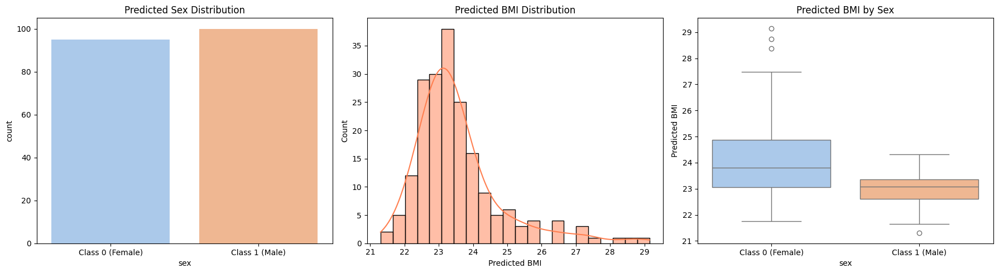

<center>CNN (CLEANED TEST DATA):<b>0.4342</b></center>

---
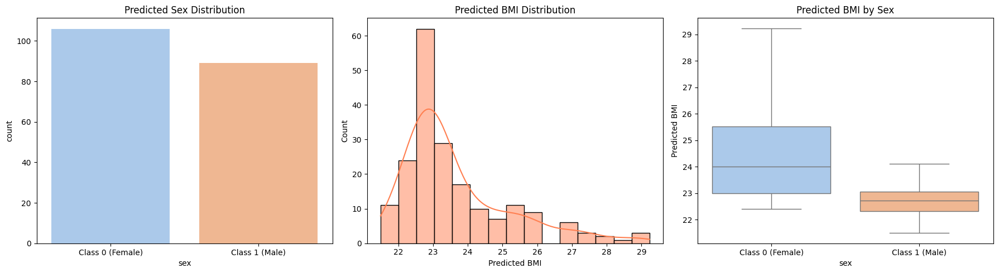

The BMI estimate generally centres around the mean in both experiments. The BMI regression seems little affected by test data pre-processing.

Interestingly, inference on the unprocessed dataset led to more predictions of Male, which is something that will be repeated with other estimators. In fact, the uncleaned test set had more predictions for the minority class than the majority class. At least it seems that the CNN was able to handle class imbalance well.

Though the improvement in Kaggle performance seemed significant by pre-processing the test data, upon the private leaderboard being revealed I discovered that there was only an improvement of 0.0004.

In [84]:

class XRayDatasetL(Dataset): # Single colour channel dataset class
    def __init__(self, df, transform=None, scaler=None, is_test=False):
        self.df = df.reset_index(drop=True)
        self.transform = transform
        self.scaler = scaler
        self.is_test = is_test

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        img_path = self.df.loc[idx, "image"]
        image = Image.open(img_path).convert("L")
        if self.transform:
            image = self.transform(image)

        if self.is_test:
            return image, self.df.loc[idx, "filename"]

        sex = torch.tensor(self.df.loc[idx, "sex"], dtype=torch.float32)

        bmi_raw = np.array([[self.df.loc[idx, "bmi"]]], dtype=np.float32)
        bmi = torch.tensor(self.scaler.transform(bmi_raw)[0][0], dtype=torch.float32)

        return image, sex, bmi


class ConvBlock(nn.Module):
    """Conv -> BN -> ReLU -> optional MaxPool"""
    def __init__(self, in_ch, out_ch, pool=True):
        super().__init__()
        layers = [
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        ]
        if pool:
            layers.append(nn.MaxPool2d(2, 2))
        self.block = nn.Sequential(*layers)

    def forward(self, x):
        return self.block(x)


class XRayMultiTaskCNN(nn.Module):
    """
    Input:  (B, 1, 224, 224)
    Shared backbone -> two task heads:
      - sex_head : binary classification (logit; sigmoid at inference)
      - bmi_head : scalar regression (standardised scale)

    Spatial flow: 224 -> 112 -> 56 -> 28 -> 14 -> 7 -> 1 (AdaptiveAvgPool)
    """
    def __init__(self, dropout=0.4):
        super().__init__()

        # Shared backbone
        self.backbone = nn.Sequential(
            ConvBlock(1,   32,  pool=True),   # (B,  32, 112, 112)
            ConvBlock(32,  64,  pool=True),   # (B,  64,  56,  56)
            ConvBlock(64,  128, pool=True),   # (B, 128,  28,  28)
            ConvBlock(128, 256, pool=True),   # (B, 256,  14,  14)
            ConvBlock(256, 512, pool=True),   # (B, 512,   7,   7)
        )

        self.pool    = nn.AdaptiveAvgPool2d((1, 1))  # (B, 512, 1, 1)
        self.dropout = nn.Dropout(dropout)

        # Sex classification head
        self.sex_head = nn.Sequential(
            nn.Linear(512, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(128, 1),
        )

        # BMI regression head
        self.bmi_head = nn.Sequential(
            nn.Linear(512, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(128, 1),
        )

        self._init_weights()

    def _init_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode="fan_out", nonlinearity="relu")
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.ones_(m.weight); nn.init.zeros_(m.bias)
            elif isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight); nn.init.zeros_(m.bias)

    def forward(self, x):
        feats = self.backbone(x)
        feats = self.pool(feats).view(feats.size(0), -1)  # (B, 512)
        feats = self.dropout(feats)
        return self.sex_head(feats).squeeze(1), self.bmi_head(feats).squeeze(1)


# ─────────────────────────────────────────────
# 3. TRANSFORMS
# ─────────────────────────────────────────────

MEAN = [0.5]
STD  = [0.5]

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(MEAN, STD),
])


# ─────────────────────────────────────────────
# 4. MULTI-TASK LOSS
# ─────────────────────────────────────────────

class MultiTaskLoss(nn.Module):
    """
    loss = alpha * BCE(sex) + (1 - alpha) * MSE(bmi)
    alpha=0.5 weights both tasks equally.
    """
    def __init__(self, alpha=0.5):
        super().__init__()
        self.alpha = alpha
        self.bce = nn.BCEWithLogitsLoss()
        self.mse = nn.MSELoss()

    def forward(self, sex_logit, sex_true, bmi_pred, bmi_true):
        l_sex = self.bce(sex_logit, sex_true)
        l_bmi = self.mse(bmi_pred, bmi_true)
        return self.alpha * l_sex + (1 - self.alpha) * l_bmi, l_sex, l_bmi


# ─────────────────────────────────────────────
# 5. TRAIN / EVAL LOOPS
# ─────────────────────────────────────────────

def train_one_epoch(model, loader, optimiser, criterion, device):
    model.train()
    total, s_sum, b_sum = 0.0, 0.0, 0.0

    for images, sex, bmi in loader:
        images, sex, bmi = images.to(device), sex.to(device), bmi.to(device)
        optimiser.zero_grad()
        sex_logit, bmi_pred = model(images)
        loss, l_sex, l_bmi = criterion(sex_logit, sex, bmi_pred, bmi)
        loss.backward()
        optimiser.step()
        total += loss.item(); s_sum += l_sex.item(); b_sum += l_bmi.item()

    n = len(loader)
    return total / n, s_sum / n, b_sum / n


@torch.no_grad()
def evaluate(model, loader, criterion, device, scaler):
    model.eval()
    total_loss = 0.0
    all_sex_probs, all_sex_true = [], []
    all_bmi_pred,  all_bmi_true = [], []

    for images, sex, bmi in loader:
        images, sex, bmi = images.to(device), sex.to(device), bmi.to(device)
        sex_logit, bmi_pred = model(images)
        loss, _, _ = criterion(sex_logit, sex, bmi_pred, bmi)
        total_loss += loss.item()

        all_sex_probs.extend(torch.sigmoid(sex_logit).cpu().numpy())
        all_sex_true.extend(sex.cpu().numpy())
        all_bmi_pred.extend(bmi_pred.cpu().numpy())
        all_bmi_true.extend(bmi.cpu().numpy())

    # Sex metrics
    sex_preds = (np.array(all_sex_probs) >= 0.5).astype(int)
    acc = accuracy_score(all_sex_true, sex_preds)
    auc = roc_auc_score(all_sex_true, all_sex_probs)

    # BMI metrics (inverse-transform to original scale)
    bmi_pred_orig = scaler.inverse_transform(np.array(all_bmi_pred).reshape(-1, 1)).flatten()
    bmi_true_orig = scaler.inverse_transform(np.array(all_bmi_true).reshape(-1, 1)).flatten()
    mae = np.mean(np.abs(bmi_pred_orig - bmi_true_orig))
    r, _ = pearsonr(bmi_true_orig, bmi_pred_orig)

    return total_loss / len(loader), acc, auc, mae, r


# ─────────────────────────────────────────────
# 6. TEST INFERENCE
# ─────────────────────────────────────────────

@torch.no_grad()
def predict_test(model, loader, device, scaler):
    model.eval()
    results = []

    for images, filenames in loader:
        images = images.to(device)
        sex_logit, bmi_pred = model(images)

        sex_probs  = torch.sigmoid(sex_logit).cpu().numpy()
        sex_labels = (sex_probs >= 0.5).astype(int)
        bmi_orig   = scaler.inverse_transform(bmi_pred.cpu().numpy().reshape(-1, 1)).flatten()

        for fname, prob, label, bmi in zip(filenames, sex_probs, sex_labels, bmi_orig):
            results.append({
                "filename": fname,
                "sex": int(label),
                "sex_prob": round(float(prob), 4),
                "bmi": round(float(bmi), 2),
            })

    return pd.DataFrame(results)


# ── Config ──────────────────────────────────────────────────────────
BATCH_SIZE   = 16
EPOCHS       = 30
LR           = 1e-3
WEIGHT_DECAY = 1e-4
ALPHA        = 0.5
DROPOUT      = 0.4
PATIENCE     = 5
DEVICE       = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SAVE_PATH    = "best_xray_cnn.pt"

print(f"Device: {DEVICE}")

# ── Scaler (fit on train BMI only) ──────────────────────────────────
scaler = StandardScaler()
scaler.fit(train_df[["bmi"]].values)

# ── Datasets & Loaders ──────────────────────────────────────────────
train_ds = XRayDatasetL(train_df, transform=train_transform, scaler=scaler)
val_ds   = XRayDatasetL(val_df,   transform=val_transform,   scaler=scaler)
test_ds  = XRayDatasetL(test_df,  transform=val_transform,   is_test=True)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# ── Model / Loss / Optimiser ─────────────────────────────────────────
model     = XRayMultiTaskCNN(dropout=DROPOUT).to(DEVICE)
criterion = MultiTaskLoss(alpha=ALPHA)
optimiser = torch.optim.AdamW(model.parameters(), lr=LR, weight_decay=WEIGHT_DECAY)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimiser, mode='min', factor=0.5, patience=2)

total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Trainable parameters: {total_params:,}")

# ── Training Loop ────────────────────────────────────────────────────
best_val_loss = float("inf")
patience_ctr  = 0

for epoch in range(1, EPOCHS + 1):
    tr_loss, tr_sex, tr_bmi = train_one_epoch(model, train_loader, optimiser, criterion, DEVICE)
    val_loss, acc, auc, mae, r = evaluate(model, val_loader, criterion, DEVICE, scaler)
    scheduler.step(val_loss)

    print(
        f"Epoch {epoch:03d}/{EPOCHS} | "
        f"Train: {tr_loss:.4f} (sex={tr_sex:.4f} bmi={tr_bmi:.4f}) | "
        f"Val: {val_loss:.4f} | "
        f"Sex Acc={acc:.3f} AUC={auc:.3f} | "
        f"BMI MAE={mae:.2f} r={r:.3f}"
    )

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_ctr  = 0
        torch.save(model.state_dict(), SAVE_PATH)
        print(f"  -> Saved checkpoint (val_loss={val_loss:.4f})")
    else:
        patience_ctr += 1
        if patience_ctr >= PATIENCE:
            print(f"Early stopping triggered at epoch {epoch}.")
            break

# ── Test Inference ───────────────────────────────────────────────────
print("\nRunning test inference with best checkpoint...")
model.load_state_dict(torch.load(SAVE_PATH, map_location=DEVICE))
results_df = predict_test(model, test_loader, DEVICE, scaler)
results_df.to_csv("test_predictions.csv", index=False)
print("Saved -> test_predictions.csv")
print(results_df.head())


Device: cuda
Trainable parameters: 1,700,578
Epoch 001/30 | Train: 1.1257 (sex=0.7725 bmi=1.4790) | Val: 0.7750 | Sex Acc=0.253 AUC=0.810 | BMI MAE=2.29 r=-0.009
  -> Saved checkpoint (val_loss=0.7750)
Epoch 002/30 | Train: 0.8022 (sex=0.6657 bmi=0.9388) | Val: 0.4063 | Sex Acc=0.833 AUC=0.928 | BMI MAE=1.64 r=0.431
  -> Saved checkpoint (val_loss=0.4063)
Epoch 003/30 | Train: 0.7426 (sex=0.6407 bmi=0.8446) | Val: 0.4629 | Sex Acc=0.680 AUC=0.699 | BMI MAE=1.44 r=0.629
Epoch 004/30 | Train: 0.6946 (sex=0.5781 bmi=0.8112) | Val: 2.2322 | Sex Acc=0.200 AUC=0.936 | BMI MAE=4.32 r=0.599
Epoch 005/30 | Train: 0.6371 (sex=0.5342 bmi=0.7400) | Val: 0.3425 | Sex Acc=0.920 AUC=0.985 | BMI MAE=1.59 r=0.591
  -> Saved checkpoint (val_loss=0.3425)
Epoch 006/30 | Train: 0.6238 (sex=0.5047 bmi=0.7428) | Val: 0.2965 | Sex Acc=0.927 AUC=0.977 | BMI MAE=1.44 r=0.530
  -> Saved checkpoint (val_loss=0.2965)
Epoch 007/30 | Train: 0.5986 (sex=0.4995 bmi=0.6977) | Val: 0.5187 | Sex Acc=0.747 AUC=0.994 | BMI

## Pre-trained models

The rest of the models in this project are all pre-trained. This means that they have already been trained on computer vision tasks using some corpus of images, that being ImageNet for most of them. ImageNet is a massive corpus of labelled training data for computer vision, containing over 14 million images with 20,000 categories.

Instead of loading these models with randomly initialised weights, the weights are already configured to be able to detect objects in images. But how does this help with the current task?

The early layers have already learned the beginning steps of how to infer from an image. They are looking for straight lines, edges, contrasts, and color gradients. And then the middle layers may be looking for more complex features, such as curves, corners, patterns, shapes and textures. These properties are still useful to this task and can be transferred to it. The deeper parts of the network however must still be fine-tuned to the specific task.

The following models all follow the structure of first training only the classification and regression heads for a specific number of epochs, keeping the pre-trained weights of the models completely frozen. This is to protect the pre-trained knowledge from being destroyed by the randomly initialised classification heads, which would otherwise send erratic error signals its way, until those heads have stabilised.

This is followed by an unfreezing only of the latter portion of the backbone and training it in addition to the classifier heads at a low learning rate. This fine-tunes the models optics for the specific task.

## ResNet18

ResNet is one of the foremost architectures in CNNs, and its trick is the use of residual connections.

ResNet18 is the smallest of these architectures. It is made up of a stem (convolution followed by max pooling), followed by 4 stages, which each contain 2 blocks, which each perform the following process:





<center>
<b>ResNet Block Diagram</b>

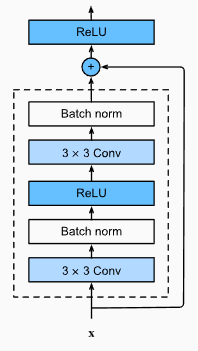

</center>

$x$ is the input from the previous block. The diagram shows the input following two paths; forwards through a series of convolutions, normalisations and activation, as well as a skip connection where the original input of the block is added (preceded by a minimally destructive strided convolution to reshape the matrix if required) to the feature map before a final ReLu.

This is done in every block in ResNet and is what gives it improved performance through resilience against vanishing gradients. The residual connection strengthens the passage of the signal through the network in the forwards direction, by "reiterating" information from past layers, so that things learned in early layers are less likely to be forgotten by later ones.

However, these residual connections are just as useful in the backward direction; During backpropagation, the signal for updating the weights can weaken as it passes through many layers of operations. By using the residual connection the error can pass through much fewer layers to reach the shallower parts of the network, allowing for more effective training.

<center>RESNET18 (UNPROCESSED TEST SET):<b>0.5072</b></center>

---

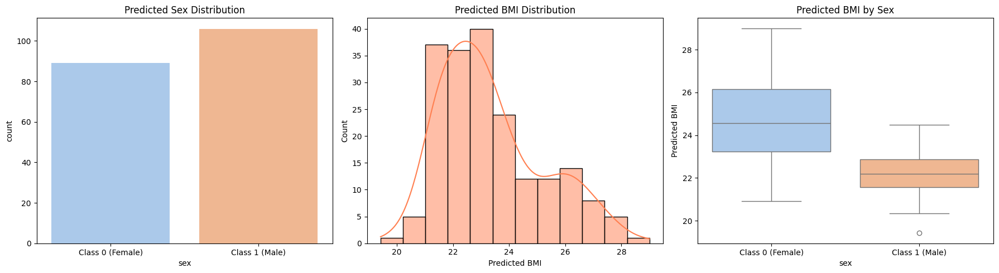

<center>RESNET18 (CLEANED TEST SET W/OUTLIERS):<b>0.5302</b></center>

---

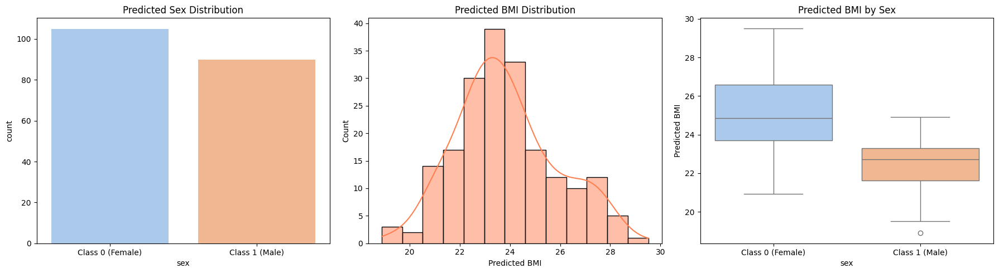

<center>RESNET18 (BACKBONE NOT FINE-TUNED):<b>0.4880</b></center>

---

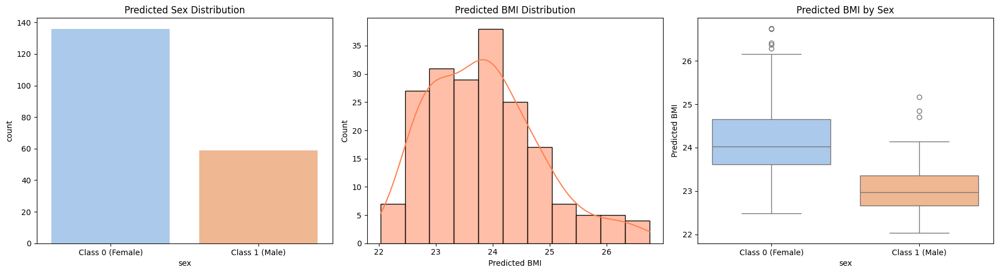

<center>RESNET18 (WEIGHTED CLASSES):<b>0.5230</b></center>

---

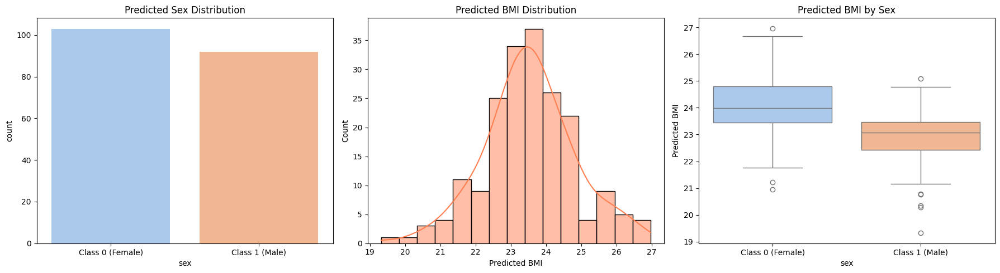

<center>RESNET18 (FINAL MODEL):<b>0.5565 - BEST PUBLIC SCORE</b></center>

---

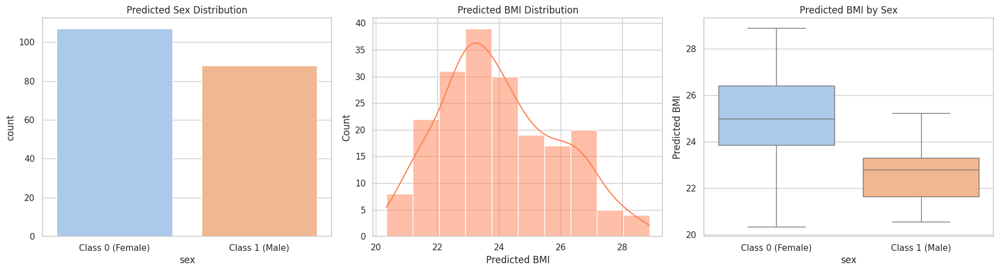

Again in this instance the unprocessed data set leads to inferring further towards Male for sex classification.

Training the model with very low BMI outlier data seems to push the BMI higher. Initial logic would dictate that the model seeing more low BMI examples would push the BMI lower instead. However, it might be that the low BMI examples' effect on the scaling is having an effect here; since the range of BMIs is higher, the normal sized BMIs are further up the scale when outliers are included, which leads to a higher prediction of BMI following the reverse transform.

It is very interesting how high the ResNet with an untrained backbone using only ImageNet weights, performing significantly better than the CNN trained from scratch. This is plain evidence of how transferrable a generally trained image model can be to a domain specific application.

In order to counterract the effect of imbalanced classes, an experiment was done using a weighted loss function that penalised wrong female predictions more than wrong male ones. However, this led to decreased performance compared to the base model - it seems that ResNet was able to handle imbalanced classes on its own implicitly.

Overrall this architecture had extremely good performance, the best of all tried, outperforming even models that you would think would have it beat, as will be shown in latter sections

In [29]:

class XRayMultiTaskResNet18(nn.Module):

  #    - Input:           (B, 3, 224, 224)
  #    - Backbone output: (B, 512, 7, 7)  after the final conv stage


    def __init__(self, dropout=0.4, freeze_backbone=True):
        super().__init__()

        base = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)

        # Strip the final FC layer, keep everything up to the avg pool
        self.backbone = nn.Sequential(*list(base.children())[:-1])  # (B, 512, 1, 1)

        if freeze_backbone:
            self.freeze_backbone()

        # Shared neck
        self.neck = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
        )

        # Sex classification head
        self.sex_head = nn.Sequential(
            nn.Linear(256, 64),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(64, 1),
        )

        # BMI regression head
        self.bmi_head = nn.Sequential(
            nn.Linear(256, 64),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(64, 1),
        )

        self._init_heads()

    def _init_heads(self):
        for m in [self.neck, self.sex_head, self.bmi_head]:
            for layer in m.modules():
                if isinstance(layer, nn.Linear):
                    nn.init.xavier_uniform_(layer.weight)
                    nn.init.zeros_(layer.bias)

    def freeze_backbone(self):
        for p in self.backbone.parameters():
            p.requires_grad = False

    def unfreeze_backbone(self, unfreeze_from_layer=6):
        """
        ResNet18 backbone (as Sequential) has 10 children (indices 0-9):
          0: Conv2d stem
          1: BatchNorm
          2: ReLU
          3: MaxPool
          4: layer1  (2 residual blocks)
          5: layer2  (2 residual blocks)
          6: layer3  (2 residual blocks)
          7: layer4  (2 residual blocks)
          8: AvgPool
        unfreeze_from_layer=6 unfreezes layer3, layer4, and avgpool.
        Set to 0 to unfreeze everything.
        """
        for p in self.backbone.parameters():
            p.requires_grad = False
        for i, child in enumerate(self.backbone):
            if i >= unfreeze_from_layer:
                for p in child.parameters():
                    p.requires_grad = True

    def forward(self, x):
        x         = self.backbone(x).flatten(1)        # (B, 512)
        x         = self.neck(x)                       # (B, 256)
        sex_logit = self.sex_head(x).squeeze(1)        # (B,)
        bmi_pred  = self.bmi_head(x).squeeze(1)        # (B,)
        return sex_logit, bmi_pred


# ─────────────────────────────────────────────
# OPTIMISER BUILDERS
# ─────────────────────────────────────────────

def build_optimiser_phase1(model, lr=1e-3, weight_decay=1e-4):
    params = [p for p in model.parameters() if p.requires_grad]
    return torch.optim.AdamW(params, lr=lr, weight_decay=weight_decay)


def build_optimiser_phase2(model, lr_backbone=1e-5, lr_heads=1e-4, weight_decay=1e-4):
    backbone_params = [p for p in model.backbone.parameters() if p.requires_grad]
    head_params     = (
        list(model.neck.parameters()) +
        list(model.sex_head.parameters()) +
        list(model.bmi_head.parameters())
    )
    return torch.optim.AdamW([
        {"params": backbone_params, "lr": lr_backbone},
        {"params": head_params,     "lr": lr_heads},
    ], weight_decay=weight_decay)

def train_one_epoch(model, loader, optimiser, criterion, device):
  model.train()
  total, s_sum, b_sum = 0.0, 0.0, 0.0

  for images, sex, bmi in loader:
      images, sex, bmi = images.to(device), sex.to(device), bmi.to(device)
      optimiser.zero_grad()
      sex_logit, bmi_pred = model(images)
      loss, l_sex, l_bmi  = criterion(sex_logit, sex, bmi_pred, bmi)
      loss.backward()
      optimiser.step()
      total += loss.item()
      s_sum += l_sex.item()
      b_sum += l_bmi.item()

  n = len(loader)
  return total / n, s_sum / n, b_sum / n


@torch.no_grad()
def evaluate(model, loader, criterion, device, scaler):
    model.eval()
    total_loss = 0.0
    all_sex_probs, all_sex_true = [], []
    all_bmi_pred,  all_bmi_true = [], []

    for images, sex, bmi in loader:
        images, sex, bmi = images.to(device), sex.to(device), bmi.to(device)
        sex_logit, bmi_pred = model(images)
        loss, _, _          = criterion(sex_logit, sex, bmi_pred, bmi)
        total_loss         += loss.item()

        all_sex_probs.extend(torch.sigmoid(sex_logit).cpu().numpy())
        all_sex_true.extend(sex.cpu().numpy())
        all_bmi_pred.extend(bmi_pred.cpu().numpy())
        all_bmi_true.extend(bmi.cpu().numpy())

    sex_preds     = (np.array(all_sex_probs) >= 0.5).astype(int)
    acc           = accuracy_score(all_sex_true, sex_preds)
    auc           = roc_auc_score(all_sex_true, all_sex_probs)

    bmi_pred_orig = scaler.inverse_transform(np.array(all_bmi_pred).reshape(-1, 1)).flatten()
    bmi_true_orig = scaler.inverse_transform(np.array(all_bmi_true).reshape(-1, 1)).flatten()
    mae           = np.mean(np.abs(bmi_pred_orig - bmi_true_orig))
    rmse          = np.sqrt(np.mean((bmi_pred_orig - bmi_true_orig) ** 2))
    r, _          = pearsonr(bmi_true_orig, bmi_pred_orig)

    return total_loss / len(loader), acc, auc, mae, rmse, r

@torch.no_grad()
def predict_test(model, loader, device, scaler):
    model.eval()
    results = []

    for images, filenames in loader:
        images              = images.to(device)
        sex_logit, bmi_pred = model(images)

        sex_probs  = torch.sigmoid(sex_logit).cpu().numpy()
        sex_labels = (sex_probs >= 0.5).astype(int)
        bmi_orig   = scaler.inverse_transform(
            bmi_pred.cpu().numpy().reshape(-1, 1)
        ).flatten()

        for fname, prob, label, bmi in zip(filenames, sex_probs, sex_labels, bmi_orig):
            results.append({
                "filename": fname,
                "sex": int(label),
                "sex_prob": round(float(prob), 4),
                "bmi": round(float(bmi),  2),
            })

    return pd.DataFrame(results)

In [30]:
BATCH_SIZE    = 16
PHASE1_EPOCHS = 15    # frozen backbone
PHASE2_EPOCHS = 30    # unfrozen top half
ALPHA         = 0.5
DROPOUT       = 0.4
PATIENCE      = 5
UNFREEZE_FROM = 4     # unfreeze backbone blocks 4-8 in phase 2
DEVICE        = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SAVE_PATH     = "best_efficientnet.pt"

print(f"Device: {DEVICE}")

# ── Scaler ──────────────────────────────────────────────────────────
scaler = StandardScaler()
scaler.fit(train_df[["bmi"]].values)

# ── Datasets & loaders ──────────────────────────────────────────────
train_ds = XRayDataset(train_df, transform=train_transform, scaler=scaler)
val_ds   = XRayDataset(val_df,   transform=val_transform,   scaler=scaler)
test_ds  = XRayDataset(test_df,  transform=val_transform,   is_test=True)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# ── Model & loss ─────────────────────────────────────────────────────
model_rn     = XRayMultiTaskResNet18(dropout=DROPOUT, freeze_backbone=True).to(DEVICE)

n_positive = train_df["sex"].sum() # <-- only for weighted loss function
n_negative = len(train_df) - n_positive
pos_weight = torch.tensor([n_negative / n_positive]).to(DEVICE)

criterion = MultiTaskLoss(alpha=ALPHA)
# ── Phase 1: train heads only ─────────────────────────────────────────
print("\n" + "="*60)
print("PHASE 1 — Backbone frozen, training heads only")
print("="*60)

optimiser = build_optimiser_phase1(model_rn, lr=1e-3)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimiser, T_max=PHASE1_EPOCHS)
best_val_loss = float("inf")
patience_ctr  = 0

for epoch in range(1, PHASE1_EPOCHS + 1):
    tr_loss, tr_sex, tr_bmi           = train_one_epoch(model_rn, train_loader, optimiser, criterion, DEVICE)
    val_loss, acc, auc, mae, rmse, r  = evaluate(model_rn, val_loader, criterion, DEVICE, scaler)
    scheduler.step()

    print(
        f"[P1] Epoch {epoch:03d}/{PHASE1_EPOCHS} | "
        f"Train: {tr_loss:.4f} (sex={tr_sex:.4f} bmi={tr_bmi:.4f}) | "
        f"Val: {val_loss:.4f} | "
        f"Sex Acc={acc:.3f} AUC={auc:.3f} | "
        f"BMI MAE={mae:.2f} RMSE={rmse:.2f} r={r:.3f}"
    )

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_ctr  = 0
        torch.save(model_rn.state_dict(), SAVE_PATH)
        print(f"  -> Checkpoint saved (val_loss={val_loss:.4f})")
    else:
        patience_ctr += 1
        if patience_ctr >= PATIENCE:
            print(f"  Early stopping at epoch {epoch}.")
            break

# ── Phase 2: unfreeze top backbone blocks ─────────────────────────────
print("\n" + "="*60)
print(f"PHASE 2 — Unfreezing backbone from block {UNFREEZE_FROM}, fine-tuning")
print("="*60)

model_rn.load_state_dict(torch.load(SAVE_PATH, map_location=DEVICE))  # start from best P1
model_rn.unfreeze_backbone(unfreeze_from_layer=UNFREEZE_FROM)

trainable = sum(p.numel() for p in model_rn.parameters() if p.requires_grad)
print(f"Trainable params in phase 2: {trainable:,}")

optimiser = build_optimiser_phase2(model_rn, lr_backbone=3e-5, lr_heads=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimiser, mode='min', factor=0.5, patience=2)
best_val_loss = float("inf")
patience_ctr  = 0

for epoch in range(1, PHASE2_EPOCHS + 1):
    tr_loss, tr_sex, tr_bmi           = train_one_epoch(model_rn, train_loader, optimiser, criterion, DEVICE)
    val_loss, acc, auc, mae, rmse, r  = evaluate(model_rn, val_loader, criterion, DEVICE, scaler)
    scheduler.step(val_loss)

    print(
        f"[P2] Epoch {epoch:03d}/{PHASE2_EPOCHS} | "
        f"Train: {tr_loss:.4f} (sex={tr_sex:.4f} bmi={tr_bmi:.4f}) | "
        f"Val: {val_loss:.4f} | "
        f"Sex Acc={acc:.3f} AUC={auc:.3f} | "
        f"BMI MAE={mae:.2f} RMSE={rmse:.2f} r={r:.3f}"
    )

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_ctr  = 0
        torch.save(model_rn.state_dict(), SAVE_PATH)
        print(f"  -> Checkpoint saved (val_loss={val_loss:.4f})")
    else:
        patience_ctr += 1
        if patience_ctr >= PATIENCE:
            print(f"  Early stopping at epoch {epoch}.")
            break

# ── Test inference ────────────────────────────────────────────────────
print("\n" + "="*60)
print("TEST INFERENCE")
print("="*60)

model_rn.load_state_dict(torch.load(SAVE_PATH, map_location=DEVICE))
results_df = predict_test(model_rn, test_loader, DEVICE, scaler)
results_df.to_csv("test_predictions_rn.csv", index=False)

print(f"Predictions saved -> test_predictions.csv  ({len(results_df)} rows)")
print(f"\nSex distribution:  {results_df['sex'].value_counts().to_dict()}")
print(f"BMI range:         {results_df['bmi'].min():.1f} - {results_df['bmi'].max():.1f}")
print(f"\n{results_df.head()}")

Device: cuda
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 164MB/s]



PHASE 1 — Backbone frozen, training heads only
[P1] Epoch 001/15 | Train: 1.3766 (sex=0.8674 bmi=1.8858) | Val: 0.6595 | Sex Acc=0.547 AUC=0.799 | BMI MAE=2.02 RMSE=2.39 r=0.207
  -> Checkpoint saved (val_loss=0.6595)
[P1] Epoch 002/15 | Train: 0.8778 (sex=0.7045 bmi=1.0511) | Val: 0.5962 | Sex Acc=0.807 AUC=0.858 | BMI MAE=2.01 RMSE=2.35 r=0.262
  -> Checkpoint saved (val_loss=0.5962)
[P1] Epoch 003/15 | Train: 0.8189 (sex=0.6324 bmi=1.0055) | Val: 0.5108 | Sex Acc=0.713 AUC=0.875 | BMI MAE=1.75 RMSE=2.00 r=0.321
  -> Checkpoint saved (val_loss=0.5108)
[P1] Epoch 004/15 | Train: 0.7668 (sex=0.6084 bmi=0.9252) | Val: 0.4793 | Sex Acc=0.833 AUC=0.899 | BMI MAE=1.87 RMSE=2.17 r=0.318
  -> Checkpoint saved (val_loss=0.4793)
[P1] Epoch 005/15 | Train: 0.7354 (sex=0.5698 bmi=0.9010) | Val: 0.4529 | Sex Acc=0.867 AUC=0.924 | BMI MAE=1.86 RMSE=2.12 r=0.382
  -> Checkpoint saved (val_loss=0.4529)
[P1] Epoch 006/15 | Train: 0.7194 (sex=0.5937 bmi=0.8451) | Val: 0.7799 | Sex Acc=0.447 AUC=0.873

### Frozen Backbone

In [ ]:
BATCH_SIZE    = 16
EPOCHS        = 40    # Backbone remains frozen the entire time
ALPHA         = 0.5
DROPOUT       = 0.4
PATIENCE      = 5
DEVICE        = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SAVE_PATH     = "best_efficientnet.pt"

print(f"Device: {DEVICE}")

# ── Scaler ──────────────────────────────────────────────────────────
scaler = StandardScaler()
scaler.fit(train_df[["bmi"]].values)

# ── Datasets & loaders ──────────────────────────────────────────────
train_ds = XRayDataset(train_df, transform=train_transform, scaler=scaler)
val_ds   = XRayDataset(val_df,   transform=val_transform,   scaler=scaler)
test_ds  = XRayDataset(test_df,  transform=val_transform,   is_test=True)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# ── Model & loss ─────────────────────────────────────────────────────
# The backbone is frozen here and will never be unfrozen
model     = XRayMultiTaskResNet18(dropout=DROPOUT, freeze_backbone=True).to(DEVICE)

n_positive = train_df["sex"].sum() # <-- only for weighted loss function
n_negative = len(train_df) - n_positive
pos_weight = torch.tensor([n_negative / n_positive]).to(DEVICE)

criterion = MultiTaskLoss(alpha=ALPHA)

# ── Training: Heads Only ──────────────────────────────────────────────
print("\n" + "="*60)
print("TRAINING — Backbone frozen, training heads only")
print("="*60)

# Assuming build_optimiser_phase1 is defined elsewhere in your code to only target head parameters
optimiser = build_optimiser_phase1(model, lr=5e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimiser, mode='min', factor=0.5, patience=2)
best_val_loss = float("inf")
patience_ctr  = 0

for epoch in range(1, EPOCHS + 1):
    tr_loss, tr_sex, tr_bmi           = train_one_epoch(model, train_loader, optimiser, criterion, DEVICE)
    val_loss, acc, auc, mae, rmse, r  = evaluate(model, val_loader, criterion, DEVICE, scaler)
    scheduler.step(val_loss)

    print(
        f"Epoch {epoch:03d}/{EPOCHS} | "
        f"Train: {tr_loss:.4f} (sex={tr_sex:.4f} bmi={tr_bmi:.4f}) | "
        f"Val: {val_loss:.4f} | "
        f"Sex Acc={acc:.3f} AUC={auc:.3f} | "
        f"BMI MAE={mae:.2f} RMSE={rmse:.2f} r={r:.3f}"
    )

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_ctr  = 0
        torch.save(model.state_dict(), SAVE_PATH)
        print(f"  -> Checkpoint saved (val_loss={val_loss:.4f})")
    else:
        patience_ctr += 1
        if patience_ctr >= PATIENCE:
            print(f"  Early stopping at epoch {epoch}.")
            break

# ── Test inference ────────────────────────────────────────────────────
print("\n" + "="*60)
print("TEST INFERENCE")
print("="*60)

model.load_state_dict(torch.load(SAVE_PATH, map_location=DEVICE))
results_df = predict_test(model, test_loader, DEVICE, scaler)
results_df.to_csv("test_predictions_rn.csv", index=False)

print(f"Predictions saved -> test_predictions_rn.csv  ({len(results_df)} rows)")
print(f"\nSex distribution:  {results_df['sex'].value_counts().to_dict()}")
print(f"BMI range:         {results_df['bmi'].min():.1f} - {results_df['bmi'].max():.1f}")
print(f"\n{results_df.head()}")

Device: cuda
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 210MB/s]



TRAINING — Backbone frozen, training heads only
Epoch 001/40 | Train: 2.3969 (sex=1.1135 bmi=3.6803) | Val: 0.6049 | Sex Acc=0.800 AUC=0.591 | BMI MAE=1.94 RMSE=2.24 r=0.070
  -> Checkpoint saved (val_loss=0.6049)
Epoch 002/40 | Train: 0.8759 (sex=0.7241 bmi=1.0277) | Val: 0.6264 | Sex Acc=0.800 AUC=0.891 | BMI MAE=2.00 RMSE=2.32 r=-0.003
Epoch 003/40 | Train: 0.8338 (sex=0.6841 bmi=0.9834) | Val: 0.6688 | Sex Acc=0.227 AUC=0.768 | BMI MAE=2.01 RMSE=2.33 r=-0.136
Epoch 004/40 | Train: 0.8259 (sex=0.6690 bmi=0.9827) | Val: 0.6057 | Sex Acc=0.720 AUC=0.843 | BMI MAE=2.02 RMSE=2.34 r=0.219
Epoch 005/40 | Train: 0.8002 (sex=0.6193 bmi=0.9811) | Val: 0.5622 | Sex Acc=0.767 AUC=0.884 | BMI MAE=1.98 RMSE=2.29 r=0.251
  -> Checkpoint saved (val_loss=0.5622)
Epoch 006/40 | Train: 0.7815 (sex=0.5920 bmi=0.9711) | Val: 0.5854 | Sex Acc=0.633 AUC=0.911 | BMI MAE=1.94 RMSE=2.22 r=0.302
Epoch 007/40 | Train: 0.7691 (sex=0.5762 bmi=0.9621) | Val: 0.4935 | Sex Acc=0.793 AUC=0.931 | BMI MAE=1.93 RMSE=

##EfficientNet

EfficientNet is a newer, state-of-the-art neural network architecture, and as the name suggests, is designed to deliver high performance with low computational cost.

When scaling up convolutional neural networks, the three things that can be increased are the number of channels, the depth of layers and the resolution of the input. EffecientNet optimises this scaling by using a compound scaling formula which scales depth, channels and resolution simultaneously, which leads to greater performance than scaling one of these factors on its own.

EffecientNet B3 is designed for 300x300px images and has 9 stages made up mostly of its MBConv (Mobile Inverted Bottleneck Convolution) blocks.

<center>

<b>MBConv Block Diagram</b>

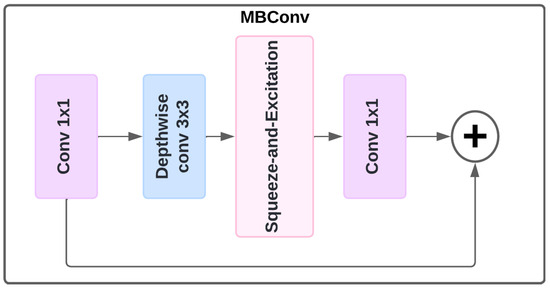

</center>

The first step is a 1x1 convolution which expands the channels by an enormous factor, followed by a SiLu activation function. This is then fed into a 3x3 depthwise convolution, which unlike a regular convolution keeps all channels separate, with no summation of channels at the end, by using many 1 channel deep kernels instead of one deep kernel.

The next step is one of EfficientNet's main features, called squeeze and excitation. the "squeeze" refers to global average pooling which averages each channel into a single value. the "excitation" is a linear layer whcih takes the averaged channels and outputs a weight by which each channel is multiplied, with the idea being that important channels are excited (multiplied by a higher number) or silenced (multiplied by a low number).

At this point, the channels must be compressed back to what they were before the initial expansion, again using a 1x1 convolution. Now, after the shape of the tensor is the same as it was at the beginning of the block a residual connection is added at the end, the same as in ResNet.

Instead of gradually expanding in channels and increasing channel depth, EfficientNet rapidly expands channel depth to work, then shrinks it back, saving memory.
<center>EFFICIENTNET:<b>0.4220</b></center>

---

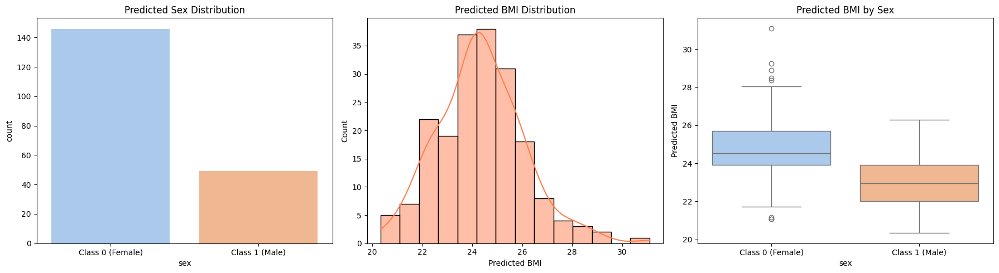

<center>EFFICIENTNET (WEIGHTED CLASSES):<b>0.4467</b></center>

---

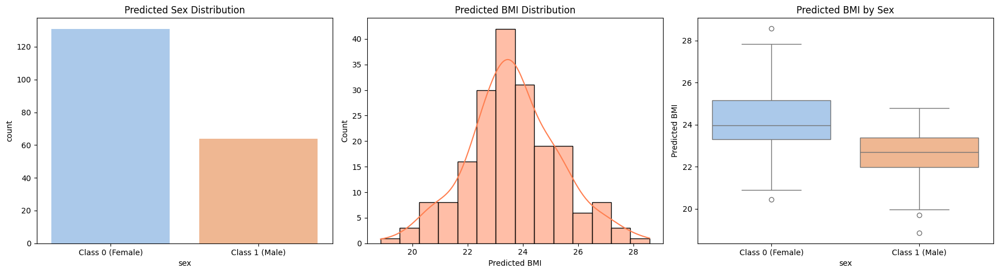

Even though EfficientNet is meant to be a far more advanced architecture than ResNet, it was quite far off the mark in its performance, not even beating the scratch CNN. This may have been for a number of reasons:

The EfficientNet B3 is explicitly trained to work with images of size 300x300, but the ones being used here are 224x224. Also, EfficientNet's block structure may not be the best for this task. It uses average pooling of entire channels at every block, which is fine for the task it was designed for, being object detection on ImageNet, where each item that you are looking for is large and distinct, but less suitable for X-ray inference where the things being looked for are subtle and diffuse.

The ResNet seemed to handle class imbalance just fine, but the class inference here was very imbalanced. Unlike the ResNet which was hindered by class weighting, Using it here led to a marked improvement in performance. The cause of this drop may have been the Squeeze-and-Excitation. Perhaps during training the model found that silencing the channels which led to classification of male minimised the loss?

In [ ]:

# ─────────────────────────────────────────────
# MODEL
# ─────────────────────────────────────────────
class XRayMultiTaskEfficientNet(nn.Module):
    def __init__(self, dropout=0.4, freeze_backbone=True):
        super().__init__()

        base = efficientnet_b3(weights=EfficientNet_B3_Weights.IMAGENET1K_V1)
        self.backbone = base.features   # outputs (B, 1536, 7, 7)
        self.pool     = nn.AdaptiveAvgPool2d(1)

        backbone_out = 1536

        if freeze_backbone:
            self.freeze_backbone()

        self.neck = nn.Sequential(
            nn.Linear(backbone_out, 512),
            nn.SiLU(inplace=True),
            nn.Dropout(dropout),
        )

        self.sex_head = nn.Sequential(
            nn.Linear(512, 128),
            nn.SiLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(128, 1),
        )

        self.bmi_head = nn.Sequential(
            nn.Linear(512, 128),
            nn.SiLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(128, 1),
        )

        self._init_heads()

    def _init_heads(self):
        for m in [self.neck, self.sex_head, self.bmi_head]:
            for layer in m.modules():
                if isinstance(layer, nn.Linear):
                    nn.init.xavier_uniform_(layer.weight)
                    nn.init.zeros_(layer.bias)

    def freeze_backbone(self):
        for p in self.backbone.parameters():
            p.requires_grad = False

    def unfreeze_backbone(self, unfreeze_from_block=6):

        for p in self.backbone.parameters():
            p.requires_grad = False

        for i, block in enumerate(self.backbone):
            if i >= unfreeze_from_block:
                for p in block.parameters():
                    p.requires_grad = True

    def forward(self, x):
        x = self.backbone(x)                            # (B, 1536, 7, 7)
        x = self.pool(x).flatten(1)                     # (B, 1536)
        x = self.neck(x)                                # (B, 512)

        # Squeeze removes the empty dimension so (B, 1) becomes (B,)
        sex_logit = self.sex_head(x).squeeze(1)
        bmi_pred  = self.bmi_head(x).squeeze(1)

        return sex_logit, bmi_pred


def build_optimiser_phase1(model, lr=1e-3, weight_decay=1e-4):
    params = [p for p in model.parameters() if p.requires_grad]
    return torch.optim.AdamW(params, lr=lr, weight_decay=weight_decay)

def build_optimiser_phase2(model, lr_backbone=1e-5, lr_heads=1e-4, weight_decay=1e-4):
    backbone_params = [p for p in model.backbone.parameters() if p.requires_grad]
    head_params     = (
        list(model.neck.parameters()) +
        list(model.sex_head.parameters()) +
        list(model.bmi_head.parameters())
    )
    return torch.optim.AdamW([
        {"params": backbone_params, "lr": lr_backbone},
        {"params": head_params,     "lr": lr_heads},
    ], weight_decay=weight_decay)

def train_one_epoch(model, loader, optimiser, criterion, device):
    model.train()
    total, s_sum, b_sum = 0.0, 0.0, 0.0

    for images, sex, bmi in loader:
        images, sex, bmi = images.to(device), sex.to(device), bmi.to(device)
        optimiser.zero_grad()

        sex_logit, bmi_pred = model(images)
        loss, l_sex, l_bmi  = criterion(sex_logit, sex, bmi_pred, bmi)

        loss.backward()

        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimiser.step()

        total += loss.item()
        s_sum += l_sex.item()
        b_sum += l_bmi.item()

    n = len(loader)
    return total / n, s_sum / n, b_sum / n


@torch.no_grad()
def evaluate(model, loader, criterion, device, scaler):
    model.eval()
    total_loss = 0.0
    all_sex_probs, all_sex_true = [], []
    all_bmi_pred,  all_bmi_true = [], []

    for images, sex, bmi in loader:
        images, sex, bmi = images.to(device), sex.to(device), bmi.to(device)
        sex_logit, bmi_pred = model(images)
        loss, _, _          = criterion(sex_logit, sex, bmi_pred, bmi)
        total_loss         += loss.item()

        all_sex_probs.extend(torch.sigmoid(sex_logit).cpu().numpy())
        all_sex_true.extend(sex.cpu().numpy())
        all_bmi_pred.extend(bmi_pred.cpu().numpy())
        all_bmi_true.extend(bmi.cpu().numpy())

    sex_preds     = (np.array(all_sex_probs) >= 0.5).astype(int)
    acc           = accuracy_score(all_sex_true, sex_preds)
    auc           = roc_auc_score(all_sex_true, all_sex_probs)

    bmi_pred_orig = scaler.inverse_transform(np.array(all_bmi_pred).reshape(-1, 1)).flatten()
    bmi_true_orig = scaler.inverse_transform(np.array(all_bmi_true).reshape(-1, 1)).flatten()
    mae           = np.mean(np.abs(bmi_pred_orig - bmi_true_orig))
    rmse          = np.sqrt(np.mean((bmi_pred_orig - bmi_true_orig) ** 2))
    r, _          = pearsonr(bmi_true_orig, bmi_pred_orig)

    return total_loss / len(loader), acc, auc, mae, rmse, r

@torch.no_grad()
def predict_test(model, loader, device, scaler):
    model.eval()
    results = []

    for images, filenames in loader:
        images              = images.to(device)
        sex_logit, bmi_pred = model(images)

        sex_probs  = torch.sigmoid(sex_logit).cpu().numpy()
        sex_labels = (sex_probs >= 0.5).astype(int)
        bmi_orig   = scaler.inverse_transform(
            bmi_pred.cpu().numpy().reshape(-1, 1)
        ).flatten()

        for fname, prob, label, bmi in zip(filenames, sex_probs, sex_labels, bmi_orig):
            results.append({
                "filename": fname,
                "sex": int(label),
                "sex_prob": round(float(prob), 4),
                "bmi": round(float(bmi),  2),
            })

    return pd.DataFrame(results)

# ─────────────────────────────────────────────
# EXECUTION SCRIPT
# ─────────────────────────────────────────────
BATCH_SIZE    = 16
PHASE1_EPOCHS = 10
PHASE2_EPOCHS = 40
ALPHA         = 0.5
DROPOUT       = 0.4
PATIENCE      = 4
UNFREEZE_FROM = 6
DEVICE        = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SAVE_PATH     = "best_efficientnet.pt"

scaler = StandardScaler()
scaler.fit(train_df[["bmi"]].values)

# ── Datasets & loaders ──────────────────────────────────────────────
train_ds = XRayDataset(train_df, transform=train_transform, scaler=scaler)
val_ds   = XRayDataset(val_df,   transform=val_transform,   scaler=scaler)
test_ds  = XRayDataset(test_df,  transform=val_transform,   is_test=True)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

model = XRayMultiTaskEfficientNet(dropout=DROPOUT, freeze_backbone=True).to(DEVICE)

n_positive = train_df["sex"].sum()
n_negative = len(train_df) - n_positive
pos_weight = torch.tensor([n_negative / n_positive]).to(DEVICE)

criterion = MultiTaskLossBalanced(alpha=ALPHA, pos_weight=pos_weight)

# ── Phase 1 ─────────────────────────────────────────
print("\n" + "="*60)
print("PHASE 1 — Backbone frozen, training heads only")
print("="*60)

optimiser = build_optimiser_phase1(model, lr=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimiser, mode='min', factor=0.5, patience=2)

best_val_loss = float("inf")
patience_ctr  = 0

for epoch in range(1, PHASE1_EPOCHS + 1):
    tr_loss, tr_sex, tr_bmi           = train_one_epoch(model, train_loader, optimiser, criterion, DEVICE)
    val_loss, acc, auc, mae, rmse, r  = evaluate(model, val_loader, criterion, DEVICE, scaler)

    scheduler.step(val_loss)

    print(
        f"[P1] Epoch {epoch:03d}/{PHASE1_EPOCHS} | "
        f"Train: {tr_loss:.4f} (s={tr_sex:.4f} b={tr_bmi:.4f}) | "
        f"Val: {val_loss:.4f} | "
        f"Sex Acc={acc:.3f} AUC={auc:.3f} | BMI MAE={mae:.2f} RMSE={rmse:.2f}"
    )

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_ctr  = 0
        torch.save(model.state_dict(), SAVE_PATH)
    else:
        patience_ctr += 1
        if patience_ctr >= PATIENCE:
            print(f"  Early stopping at epoch {epoch}.")
            break

# ── Phase 2 ─────────────────────────────────────────────
print("\n" + "="*60)
print(f"PHASE 2 — Unfreezing backbone from block {UNFREEZE_FROM}")
print("="*60)

model.load_state_dict(torch.load(SAVE_PATH, map_location=DEVICE))
model.unfreeze_backbone(unfreeze_from_block=UNFREEZE_FROM)

optimiser = build_optimiser_phase2(model, lr_backbone=1e-5, lr_heads=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimiser, mode='min', factor=0.5, patience=2)

best_val_loss = float("inf")
patience_ctr  = 0

for epoch in range(1, PHASE2_EPOCHS + 1):
    tr_loss, tr_sex, tr_bmi           = train_one_epoch(model, train_loader, optimiser, criterion, DEVICE)
    val_loss, acc, auc, mae, rmse, r  = evaluate(model, val_loader, criterion, DEVICE, scaler)

    scheduler.step(val_loss)

    print(
        f"[P2] Epoch {epoch:03d}/{PHASE2_EPOCHS} | "
        f"Train: {tr_loss:.4f} (s={tr_sex:.4f} b={tr_bmi:.4f}) | "
        f"Val: {val_loss:.4f} | "
        f"Sex Acc={acc:.3f} AUC={auc:.3f} | BMI MAE={mae:.2f} RMSE={rmse:.2f}"
    )

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_ctr  = 0
        torch.save(model.state_dict(), SAVE_PATH)
    else:
        patience_ctr += 1
        if patience_ctr >= PATIENCE:
            print(f"  Early stopping at epoch {epoch}.")
            break


PHASE 1 — Backbone frozen, training heads only


NameError: name 'train_loader' is not defined

In [ ]:
print("\n" + "="*60)
print("TEST INFERENCE")
print("="*60)

model.load_state_dict(torch.load(SAVE_PATH, map_location=DEVICE))
results_df = predict_test(model, test_loader, DEVICE, scaler)
results_df.to_csv("test_predictions_en.csv", index=False)

print(f"Predictions saved -> test_predictions.csv  ({len(results_df)} rows)")
print(f"\nSex distribution:  {results_df['sex'].value_counts().to_dict()}")
print(f"BMI range:         {results_df['bmi'].min():.1f} - {results_df['bmi'].max():.1f}")
print(f"\n{results_df.head()}")


TEST INFERENCE
Predictions saved -> test_predictions.csv  (195 rows)

Sex distribution:  {0: 146, 1: 49}
BMI range:         20.3 - 31.1

        filename  sex  sex_prob    bmi
0  2803_4538.jpg    1    0.8026  23.21
1  4202_7304.jpg    0    0.0258  25.15
2  3638_6996.jpg    0    0.0144  23.73
3  3338_4713.jpg    0    0.4082  23.48
4  4251_8336.jpg    0    0.2204  25.55


##DenseNet121 - Torch X-Ray Vision

The previous models have all been pre-trained on general image datasets. However, the models in this library have uniquely been pre-trained specifically on chest X-ray images using publically available datasets.

The models in this library all use a DenseNet121 architecture. This architecture contains 121 layers of convolutions in, consisting mostly of Dense Layers (as in a segment of this architecture, not as in a "fully connected layer") within 4 Dense Blocks.

<center>

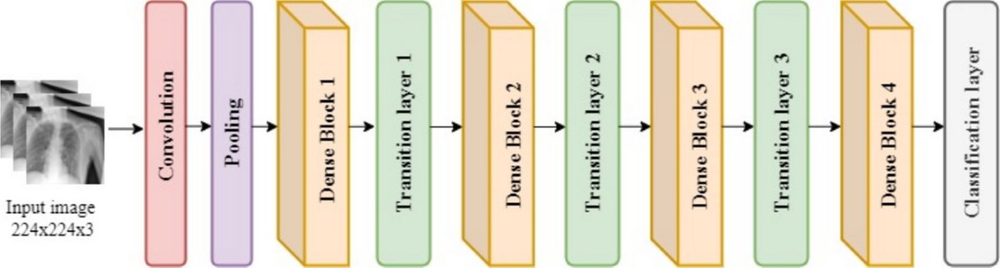

</center>

This architecture uses residual connection within its blocks just like ResNet and EfficientNet, however, whereas those <i>added</i> matrices together to preserve the flow of information, DenseNet <i>concatenates</i> channels together, preserving the original input as it was and adding what was computed within the layer as new channels at every stage, according to a growth factor $k$, equal to 32 in the case of DenseNet121.

A Dense Layer begins with an initial stage of batch normalisation and ReLu in a stage known as pre-activation. This is followed by a 1x1 bottleneck convolution similar to EfficientNet, but unlike the inverted convolution there which expands the channels, the bottleneck here condenses all the channels of the input to a factor of 4$k$ (or 128). After another BatchNorm and ReLU is a 3x3 convolution outputting channels equivalent to $k$. Finally, this output is concatenated to the original input, adding 32 new channels. This process of concatenating 32 channels occurs 58 times in DenseNet121.

Of course, some way is needed to manage the size of the tensor in memory adding channels with no reduction in spatial dimensions in every layer. For this reason, each of the 4 Dense Blocks is separated by a Transition Layer, in which the channels are halved by a 1x1 convolution and the spatial dimensions are halved using 2x2 average pooling, succesfully reducing the size of the Tensor to an eighth of its size.

<center> DENSENET121 (PRE-TRAINED ON CHEST X-RAYS): <b>0.4605</b></center>

---

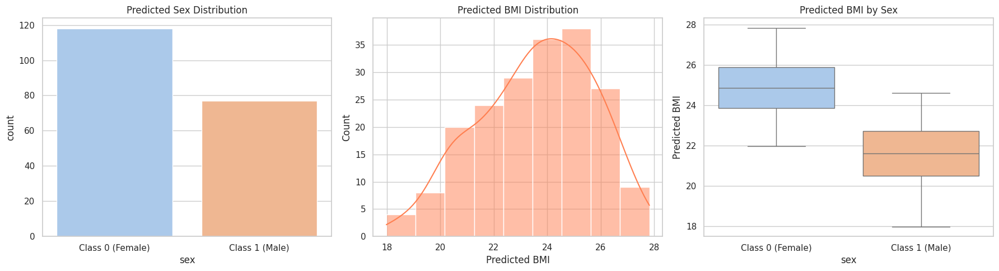

Against all logic the network pre-trained on domain specific data was not particularly good. The question then is what is the phenomenon on display here? Is specific pre-training good but the model architecture is holding back performance? or is the DenseNet good but it just doesn't benefit from pre-training on chest X-rays?

In [ ]:
import torchxrayvision as xrv

xray_train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=1),   # convert first
    transforms.RandomAffine(degrees=5, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: (x * 2048.0) - 1024.0),
])

xray_val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: (x * 2048.0) - 1024.0),
])

class XRayMultiTaskDenseNet(nn.Module):

    def __init__(self, dropout=0.4, freeze_backbone=True):
        super().__init__()

        base          = xrv.models.DenseNet(weights="densenet121-res224-all")
        self.backbone = base.features   # outputs (B, 1024, 7, 7)
        self.pool     = nn.AdaptiveAvgPool2d(1)

        if freeze_backbone:
            self.freeze_backbone()

        self.neck = nn.Sequential(
            nn.Linear(1024, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
        )
        self.sex_head = nn.Sequential(
            nn.Linear(512, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(128, 1),
        )
        self.bmi_head = nn.Sequential(
            nn.Linear(512, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(128, 1),
        )
        self._init_heads()

    def _init_heads(self):
        for m in [self.neck, self.sex_head, self.bmi_head]:
            for layer in m.modules():
                if isinstance(layer, nn.Linear):
                    nn.init.xavier_uniform_(layer.weight)
                    nn.init.zeros_(layer.bias)

    def freeze_backbone(self):
        for p in self.backbone.parameters():
            p.requires_grad = False

    def unfreeze_backbone(self, unfreeze_from_block=6):
        children = list(self.backbone.named_children())
        for i, (name, child) in enumerate(children):
            requires_grad = i >= unfreeze_from_block
            for p in child.parameters():
                p.requires_grad = requires_grad

    def forward(self, x):
        x = self.backbone(x)
        x = F.relu(x) # Removed inplace=True
        x = self.pool(x).flatten(1)           # (B, 1024)
        x = self.neck(x)                      # (B, 512)
        sex_logit = self.sex_head(x).squeeze(1)
        bmi_pred  = self.bmi_head(x).squeeze(1)
        return sex_logit, bmi_pred


def build_optimiser_phase1(model, lr=1e-3, weight_decay=1e-4):
    params = [p for p in model.parameters() if p.requires_grad]
    return torch.optim.AdamW(params, lr=lr, weight_decay=weight_decay)


def build_optimiser_phase2(model, lr_backbone=1e-5, lr_heads=1e-4, weight_decay=1e-4):
    backbone_params = [p for p in model.backbone.parameters() if p.requires_grad]
    head_params     = (
        list(model.neck.parameters()) +
        list(model.sex_head.parameters()) +
        list(model.bmi_head.parameters())
    )
    return torch.optim.AdamW([
        {"params": backbone_params, "lr": lr_backbone},
        {"params": head_params,     "lr": lr_heads},
    ], weight_decay=weight_decay)

In [ ]:

def train_one_epoch(model, loader, optimiser, criterion, device):
  model.train()
  total, s_sum, b_sum = 0.0, 0.0, 0.0

  for images, sex, bmi in loader:
      images, sex, bmi = images.to(device), sex.to(device), bmi.to(device)
      optimiser.zero_grad()
      sex_logit, bmi_pred = model(images)
      loss, l_sex, l_bmi  = criterion(sex_logit, sex, bmi_pred, bmi)
      loss.backward()
      optimiser.step()
      total += loss.item()
      s_sum += l_sex.item()
      b_sum += l_bmi.item()

  n = len(loader)
  return total / n, s_sum / n, b_sum / n


@torch.no_grad()
def evaluate(model, loader, criterion, device, scaler):
    model.eval()
    total_loss = 0.0
    all_sex_probs, all_sex_true = [], []
    all_bmi_pred,  all_bmi_true = [], []

    for images, sex, bmi in loader:
        images, sex, bmi = images.to(device), sex.to(device), bmi.to(device)
        sex_logit, bmi_pred = model(images)
        loss, _, _          = criterion(sex_logit, sex, bmi_pred, bmi)
        total_loss         += loss.item()

        all_sex_probs.extend(torch.sigmoid(sex_logit).cpu().numpy())
        all_sex_true.extend(sex.cpu().numpy())
        all_bmi_pred.extend(bmi_pred.cpu().numpy())
        all_bmi_true.extend(bmi.cpu().numpy())

    sex_preds     = (np.array(all_sex_probs) >= 0.5).astype(int)
    acc           = accuracy_score(all_sex_true, sex_preds)
    auc           = roc_auc_score(all_sex_true, all_sex_probs)

    bmi_pred_orig = scaler.inverse_transform(np.array(all_bmi_pred).reshape(-1, 1)).flatten()
    bmi_true_orig = scaler.inverse_transform(np.array(all_bmi_true).reshape(-1, 1)).flatten()
    mae           = np.mean(np.abs(bmi_pred_orig - bmi_true_orig))
    rmse          = np.sqrt(np.mean((bmi_pred_orig - bmi_true_orig) ** 2))
    r, _          = pearsonr(bmi_true_orig, bmi_pred_orig)

    return total_loss / len(loader), acc, auc, mae, rmse, r

@torch.no_grad()
def predict_test(model, loader, device, scaler):
    model.eval()
    results = []

    for images, filenames in loader:
        images              = images.to(device)
        sex_logit, bmi_pred = model(images)

        sex_probs  = torch.sigmoid(sex_logit).cpu().numpy()
        sex_labels = (sex_probs >= 0.5).astype(int)
        bmi_orig   = scaler.inverse_transform(
            bmi_pred.cpu().numpy().reshape(-1, 1)
        ).flatten()

        for fname, prob, label, bmi in zip(filenames, sex_probs, sex_labels, bmi_orig):
            results.append({
                "filename": fname,
                "sex": int(label),
                "sex_prob": round(float(prob), 4),
                "bmi": round(float(bmi),  2),
            })

    return pd.DataFrame(results)


BATCH_SIZE    = 16
PHASE1_EPOCHS = 15    # frozen backbone
PHASE2_EPOCHS = 40    # unfrozen top half
ALPHA         = 0.5
DROPOUT       = 0.4
PATIENCE      = 6
UNFREEZE_FROM = 6
DEVICE        = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SAVE_PATH     = "best_efficientnet.pt"

print(f"Device: {DEVICE}")

# ── Scaler ──────────────────────────────────────────────────────────
scaler = StandardScaler()
scaler.fit(train_df[["bmi"]].values)

# ── Datasets & loaders ──────────────────────────────────────────────
train_ds = XRayDataset(train_df, transform=xray_train_transform, scaler=scaler)
val_ds   = XRayDataset(val_df,   transform=xray_val_transform,   scaler=scaler)
test_ds  = XRayDataset(test_df,  transform=xray_val_transform,   is_test=True)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# ── Model & loss ─────────────────────────────────────────────────────
model     = XRayMultiTaskDenseNet(dropout=DROPOUT, freeze_backbone=True).to(DEVICE)

n_positive = train_df["sex"].sum() # <-- only for weighted loss function
n_negative = len(train_df) - n_positive
pos_weight = torch.tensor([n_negative / n_positive]).to(DEVICE)

criterion = MultiTaskLoss(alpha=ALPHA)
# ── Phase 1: train heads only ─────────────────────────────────────────
print("\n" + "="*60)
print("PHASE 1 — Backbone frozen, training heads only")
print("="*60)

optimiser = build_optimiser_phase1(model, lr=1e-3)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimiser, T_max=PHASE1_EPOCHS)

best_val_loss = float("inf")
patience_ctr  = 0

for epoch in range(1, PHASE1_EPOCHS + 1):
    tr_loss, tr_sex, tr_bmi           = train_one_epoch(model, train_loader, optimiser, criterion, DEVICE)
    val_loss, acc, auc, mae, rmse, r  = evaluate(model, val_loader, criterion, DEVICE, scaler)
    scheduler.step()

    print(
        f"[P1] Epoch {epoch:03d}/{PHASE1_EPOCHS} | "
        f"Train: {tr_loss:.4f} (sex={tr_sex:.4f} bmi={tr_bmi:.4f}) | "
        f"Val: {val_loss:.4f} | "
        f"Sex Acc={acc:.3f} AUC={auc:.3f} | "
        f"BMI MAE={mae:.2f} RMSE={rmse:.2f} r={r:.3f}"
    )

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_ctr  = 0
        torch.save(model.state_dict(), SAVE_PATH)
        print(f"  -> Checkpoint saved (val_loss={val_loss:.4f})")
    else:
        patience_ctr += 1
        if patience_ctr >= PATIENCE:
            print(f"  Early stopping at epoch {epoch}.")
            break

# ── Phase 2: unfreeze top backbone blocks ─────────────────────────────
print("\n" + "="*60)
print(f"PHASE 2 — Unfreezing backbone from block {UNFREEZE_FROM}, fine-tuning")
print("="*60)

model.load_state_dict(torch.load(SAVE_PATH, map_location=DEVICE))  # start from best P1
model.unfreeze_backbone(unfreeze_from_block=UNFREEZE_FROM)

trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Trainable params in phase 2: {trainable:,}")

optimiser = build_optimiser_phase2(model, lr_backbone=3e-5, lr_heads=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimiser, mode='min', factor=0.5, patience=4)
best_val_loss = float("inf")
patience_ctr  = 0

for epoch in range(1, PHASE2_EPOCHS + 1):
    tr_loss, tr_sex, tr_bmi           = train_one_epoch(model, train_loader, optimiser, criterion, DEVICE)
    val_loss, acc, auc, mae, rmse, r  = evaluate(model, val_loader, criterion, DEVICE, scaler)
    scheduler.step(val_loss)

    print(
        f"[P2] Epoch {epoch:03d}/{PHASE2_EPOCHS} | "
        f"Train: {tr_loss:.4f} (sex={tr_sex:.4f} bmi={tr_bmi:.4f}) | "
        f"Val: {val_loss:.4f} | "
        f"Sex Acc={acc:.3f} AUC={auc:.3f} | "
        f"BMI MAE={mae:.2f} RMSE={rmse:.2f} r={r:.3f}"
    )

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_ctr  = 0
        torch.save(model.state_dict(), SAVE_PATH)
        print(f"  -> Checkpoint saved (val_loss={val_loss:.4f})")
    else:
        patience_ctr += 1
        if patience_ctr >= PATIENCE:
            print(f"  Early stopping at epoch {epoch}.")
            break

# ── Test inference ────────────────────────────────────────────────────
print("\n" + "="*60)
print("TEST INFERENCE")
print("="*60)

model.load_state_dict(torch.load(SAVE_PATH, map_location=DEVICE))
results_df = predict_test(model, test_loader, DEVICE, scaler)
results_df.to_csv("test_predictions_xrv.csv", index=False)

print(f"Predictions saved -> test_predictions.csv  ({len(results_df)} rows)")
print(f"\nSex distribution:  {results_df['sex'].value_counts().to_dict()}")
print(f"BMI range:         {results_df['bmi'].min():.1f} - {results_df['bmi'].max():.1f}")
print(f"\n{results_df.head()}")

Device: cuda

PHASE 1 — Backbone frozen, training heads only
[P1] Epoch 001/15 | Train: 0.6941 (sex=0.6096 bmi=0.7787) | Val: 0.5041 | Sex Acc=0.820 AUC=0.926 | BMI MAE=1.87 RMSE=2.29 r=0.427
  -> Checkpoint saved (val_loss=0.5041)
[P1] Epoch 002/15 | Train: 0.6068 (sex=0.5357 bmi=0.6779) | Val: 0.5723 | Sex Acc=0.773 AUC=0.936 | BMI MAE=2.07 RMSE=2.47 r=0.438
[P1] Epoch 003/15 | Train: 0.5338 (sex=0.4768 bmi=0.5909) | Val: 0.5400 | Sex Acc=0.813 AUC=0.949 | BMI MAE=2.07 RMSE=2.45 r=0.421
[P1] Epoch 004/15 | Train: 0.5067 (sex=0.4484 bmi=0.5650) | Val: 0.4004 | Sex Acc=0.847 AUC=0.948 | BMI MAE=1.73 RMSE=2.12 r=0.405
  -> Checkpoint saved (val_loss=0.4004)
[P1] Epoch 005/15 | Train: 0.4901 (sex=0.4213 bmi=0.5589) | Val: 0.3844 | Sex Acc=0.920 AUC=0.945 | BMI MAE=1.77 RMSE=2.21 r=0.439
  -> Checkpoint saved (val_loss=0.3844)
[P1] Epoch 006/15 | Train: 0.4689 (sex=0.4094 bmi=0.5285) | Val: 0.3659 | Sex Acc=0.880 AUC=0.948 | BMI MAE=1.58 RMSE=2.00 r=0.428
  -> Checkpoint saved (val_loss=0

## DenseNet121 - ImageNet

To investigate the performance of the DenseNet pre-trained on chest X-ray data, the logical next step was to train another DenseNet pre-trained on general image data (ImageNet).

<center>DENSENET121 (PRE-TRAINED ON IMAGENET): <b>0.5363</b></center>

---

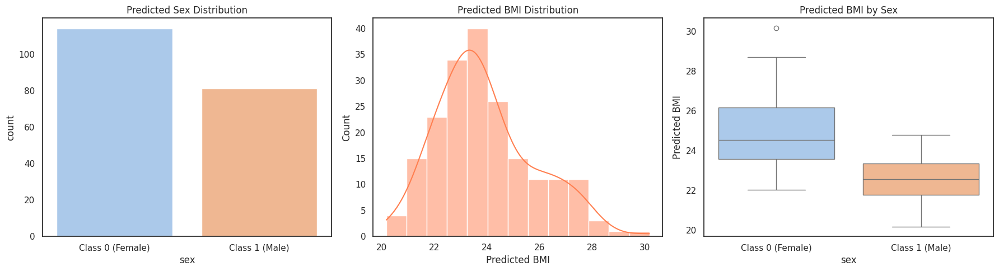

The DenseNet121 trained on ImageNet was immensely better than the one pre-trained on chest x-rays, and in fact it was the best single model of all on the private leaderboard, scoring 0.5376. This was very surprising, as it seems self-evident that pre-training on x-rays, even if they're not of the same body part, would be more helpful than pre-training on images of cars and dogs and shoes. It may be however that in being more specific, the pre-training loses its generalist properties that make it good for transfer-learning.

This performance goes to show why DenseNet was selected for medical imaging by MLMED (Machine Learning and Medicine Lab). The perfect preservation of information within Dense Blocks using concatenation, as well as the great number of convolutional layers it is made possible to use by utilising bottlenecks and steady additions in channels at each step leads to top-tier performance.

In [ ]:

class NormalImageNetDenseNet(nn.Module):

    def __init__(self, dropout=0.4, freeze_backbone=True):
        super().__init__()

        # 1. Load standard ImageNet weights (No surgery)
        base = densenet121(weights=DenseNet121_Weights.IMAGENET1K_V1)

        # 2. Extract the backbone
        self.backbone = base.features   # outputs (B, 1024, 7, 7)
        self.pool     = nn.AdaptiveAvgPool2d(1)

        if freeze_backbone:
            self.freeze_backbone()

        # 3. Custom Heads
        self.neck = nn.Sequential(
            nn.Linear(1024, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
        )
        self.sex_head = nn.Sequential(
            nn.Linear(512, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(128, 1),
        )
        self.bmi_head = nn.Sequential(
            nn.Linear(512, 128),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(128, 1),
        )
        self._init_heads()

    def _init_heads(self):
        for m in [self.neck, self.sex_head, self.bmi_head]:
            for layer in m.modules():
                if isinstance(layer, nn.Linear):
                    nn.init.xavier_uniform_(layer.weight)
                    nn.init.zeros_(layer.bias)

    def freeze_backbone(self):
        for p in self.backbone.parameters():
            p.requires_grad = False

    def unfreeze_backbone(self, unfreeze_from_block=8):
        children = list(self.backbone.named_children())
        for i, (name, child) in enumerate(children):
            requires_grad = i >= unfreeze_from_block
            for p in child.parameters():
                p.requires_grad = requires_grad

    def forward(self, x):
        x         = self.backbone(x)
        x         = F.relu(x)
        x         = self.pool(x).flatten(1)
        x         = self.neck(x)
        sex_logit = self.sex_head(x).squeeze(1)
        bmi_pred  = self.bmi_head(x).squeeze(1)
        return sex_logit, bmi_pred

In [ ]:

# ─────────────────────────────────────────────
# Optimiser Builders Definition
# (Copied from cell farqL66f-E0F to ensure availability)
# ─────────────────────────────────────────────
def build_optimiser_phase1(model, lr=1e-3, weight_decay=1e-4):
    params = [p for p in model.parameters() if p.requires_grad]
    return torch.optim.AdamW(params, lr=lr, weight_decay=weight_decay)


def build_optimiser_phase2(model, lr_backbone=1e-5, lr_heads=1e-4, weight_decay=1e-4):
    backbone_params = [p for p in model.backbone.parameters() if p.requires_grad]
    head_params     = (
        list(model.neck.parameters()) +
        list(model.sex_head.parameters()) +
        list(model.bmi_head.parameters())
    )
    return torch.optim.AdamW([
        {"params": backbone_params, "lr": lr_backbone},
        {"params": head_params,     "lr": lr_heads},
    ], weight_decay=weight_decay)

# ─────────────────────────────────────────────
# Train / Eval / Predict Loops Definition
# (Copied from cell W-EFaneq1ca8 to ensure availability, includes RMSE)
# ─────────────────────────────────────────────
def train_one_epoch(model, loader, optimiser, criterion, device):
  model.train()
  total, s_sum, b_sum = 0.0, 0.0, 0.0

  for images, sex, bmi in loader:
      images, sex, bmi = images.to(device), sex.to(device), bmi.to(device)
      optimiser.zero_grad()
      sex_logit, bmi_pred = model(images)
      loss, l_sex, l_bmi  = criterion(sex_logit, sex, bmi_pred, bmi)
      loss.backward()
      optimiser.step()
      total += loss.item()
      s_sum += l_sex.item()
      b_sum += l_bmi.item()

  n = len(loader)
  return total / n, s_sum / n, b_sum / n


@torch.no_grad()
def evaluate(model, loader, criterion, device, scaler):
    model.eval()
    total_loss = 0.0
    all_sex_probs, all_sex_true = [], []
    all_bmi_pred,  all_bmi_true = [], []

    for images, sex, bmi in loader:
        images, sex, bmi = images.to(device), sex.to(device), bmi.to(device)
        sex_logit, bmi_pred = model(images)
        loss, _, _          = criterion(sex_logit, sex, bmi_pred, bmi)
        total_loss         += loss.item()

        all_sex_probs.extend(torch.sigmoid(sex_logit).cpu().numpy())
        all_sex_true.extend(sex.cpu().numpy())
        all_bmi_pred.extend(bmi_pred.cpu().numpy())
        all_bmi_true.extend(bmi.cpu().numpy())

    sex_preds     = (np.array(all_sex_probs) >= 0.5).astype(int)
    acc           = accuracy_score(all_sex_true, sex_preds)
    auc           = roc_auc_score(all_sex_true, all_sex_probs)

    bmi_pred_orig = scaler.inverse_transform(np.array(all_bmi_pred).reshape(-1, 1)).flatten()
    bmi_true_orig = scaler.inverse_transform(np.array(all_bmi_true).reshape(-1, 1)).flatten()
    mae           = np.mean(np.abs(bmi_pred_orig - bmi_true_orig))
    rmse          = np.sqrt(np.mean((bmi_pred_orig - bmi_true_orig) ** 2))
    r, _          = pearsonr(bmi_true_orig, bmi_pred_orig)

    return total_loss / len(loader), acc, auc, mae, rmse, r

@torch.no_grad()
def predict_test(model, loader, device, scaler):
    model.eval()
    results = []

    for images, filenames in loader:
        images              = images.to(device)
        sex_logit, bmi_pred = model(images)

        sex_probs  = torch.sigmoid(sex_logit).cpu().numpy()
        sex_labels = (sex_probs >= 0.5).astype(int)
        bmi_orig   = scaler.inverse_transform(
            bmi_pred.cpu().numpy().reshape(-1, 1)
        ).flatten()

        for fname, prob, label, bmi in zip(filenames, sex_probs, sex_labels, bmi_orig):
            results.append({
                "filename": fname,
                "sex": int(label),
                "sex_prob": round(float(prob), 4),
                "bmi": round(float(bmi),  2),
            })

    return pd.DataFrame(results)


BATCH_SIZE    = 16
PHASE1_EPOCHS = 15    # frozen backbone
PHASE2_EPOCHS = 40    # unfrozen top half
ALPHA         = 0.5
DROPOUT       = 0.4
PATIENCE      = 6
UNFREEZE_FROM = 6
DEVICE        = torch.device("cuda" if torch.cuda.is_available() else "cpu")
SAVE_PATH     = "best_efficientnet.pt"

print(f"Device: {DEVICE}")

# ── Scaler ──────────────────────────────────────────────────────────
scaler = StandardScaler()
scaler.fit(train_df[["bmi"]].values)

# ── Datasets & loaders ──────────────────────────────────────────────
train_ds = XRayDataset(train_df, transform=train_transform, scaler=scaler)
val_ds   = XRayDataset(val_df,   transform=val_transform,   scaler=scaler)
test_ds  = XRayDataset(test_df,  transform=val_transform,   is_test=True)

train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_ds,  batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# ── Model & loss ─────────────────────────────────────────────────────
model     = NormalImageNetDenseNet(dropout=DROPOUT, freeze_backbone=True).to(DEVICE)

n_positive = train_df["sex"].sum() # <-- only for weighted loss function
n_negative = len(train_df) - n_positive
pos_weight = torch.tensor([n_negative / n_positive]).to(DEVICE)

criterion = MultiTaskLoss(alpha=ALPHA)
# ── Phase 1: train heads only ─────────────────────────────────────────
print("\n" + "="*60)
print("PHASE 1 — Backbone frozen, training heads only")
print("="*60)

optimiser = build_optimiser_phase1(model, lr=1e-3)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimiser, T_max=PHASE1_EPOCHS)

best_val_loss = float("inf")
patience_ctr  = 0

for epoch in range(1, PHASE1_EPOCHS + 1):
    tr_loss, tr_sex, tr_bmi           = train_one_epoch(model, train_loader, optimiser, criterion, DEVICE)
    val_loss, acc, auc, mae, rmse, r  = evaluate(model, val_loader, criterion, DEVICE, scaler)
    scheduler.step()

    print(
        f"[P1] Epoch {epoch:03d}/{PHASE1_EPOCHS} | "
        f"Train: {tr_loss:.4f} (sex={tr_sex:.4f} bmi={tr_bmi:.4f}) | "
        f"Val: {val_loss:.4f} | "
        f"Sex Acc={acc:.3f} AUC={auc:.3f} | "
        f"BMI MAE={mae:.2f} RMSE={rmse:.2f} r={r:.3f}"
    )

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_ctr  = 0
        torch.save(model.state_dict(), SAVE_PATH)
        print(f"  -> Checkpoint saved (val_loss={val_loss:.4f})")
    else:
        patience_ctr += 1
        if patience_ctr >= PATIENCE:
            print(f"  Early stopping at epoch {epoch}.")
            break

# ── Phase 2: unfreeze top backbone blocks ─────────────────────────────
print("\n" + "="*60)
print(f"PHASE 2 — Unfreezing backbone from block {UNFREEZE_FROM}, fine-tuning")
print("="*60)

model.load_state_dict(torch.load(SAVE_PATH, map_location=DEVICE))  # start from best P1
model.unfreeze_backbone(unfreeze_from_block=UNFREEZE_FROM)

trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Trainable params in phase 2: {trainable:,}")

optimiser = build_optimiser_phase2(model, lr_backbone=1e-5, lr_heads=1e-4, weight_decay=1e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimiser, mode='min', factor=0.5, patience=2)
best_val_loss = float("inf")
patience_ctr  = 0

for epoch in range(1, PHASE2_EPOCHS + 1):
    tr_loss, tr_sex, tr_bmi           = train_one_epoch(model, train_loader, optimiser, criterion, DEVICE)
    val_loss, acc, auc, mae, rmse, r  = evaluate(model, val_loader, criterion, DEVICE, scaler)
    scheduler.step(val_loss)

    print(
        f"[P2] Epoch {epoch:03d}/{PHASE2_EPOCHS} | "
        f"Train: {tr_loss:.4f} (sex={tr_sex:.4f} bmi={tr_bmi:.4f}) | "
        f"Val: {val_loss:.4f} | "
        f"Sex Acc={acc:.3f} AUC={auc:.3f} | "
        f"BMI MAE={mae:.2f} RMSE={rmse:.2f} r={r:.3f}"
    )

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_ctr  = 0
        torch.save(model.state_dict(), SAVE_PATH)
        print(f"  -> Checkpoint saved (val_loss={val_loss:.4f})")
    else:
        patience_ctr += 1
        if patience_ctr >= PATIENCE:
            print(f"  Early stopping at epoch {epoch}.")
            break

# ── Test inference ────────────────────────────────────────────────────
print("\n" + "="*60)
print("TEST INFERENCE")
print("="*60)

model.load_state_dict(torch.load(SAVE_PATH, map_location=DEVICE))
results_df = predict_test(model, test_loader, DEVICE, scaler)
results_df.to_csv("test_predictions_xrv.csv", index=False)

print(f"Predictions saved -> test_predictions.csv  ({len(results_df)} rows)")
print(f"\nSex distribution:  {results_df['sex'].value_counts().to_dict()}")
print(f"BMI range:         {results_df['bmi'].min():.1f} - {results_df['bmi'].max():.1f}")
print(f"\n{results_df.head()}")

Device: cuda
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 98.1MB/s]



PHASE 1 — Backbone frozen, training heads only
[P1] Epoch 001/15 | Train: 1.2458 (sex=0.8097 bmi=1.6820) | Val: 0.4648 | Sex Acc=0.800 AUC=0.955 | BMI MAE=1.84 RMSE=2.12 r=0.166
  -> Checkpoint saved (val_loss=0.4648)
[P1] Epoch 002/15 | Train: 0.8402 (sex=0.6775 bmi=1.0029) | Val: 0.4494 | Sex Acc=0.807 AUC=0.907 | BMI MAE=1.76 RMSE=2.01 r=0.482
  -> Checkpoint saved (val_loss=0.4494)
[P1] Epoch 003/15 | Train: 0.7789 (sex=0.6218 bmi=0.9359) | Val: 0.5496 | Sex Acc=0.800 AUC=0.928 | BMI MAE=2.10 RMSE=2.44 r=0.479
[P1] Epoch 004/15 | Train: 0.6706 (sex=0.5528 bmi=0.7885) | Val: 0.3761 | Sex Acc=0.887 AUC=0.946 | BMI MAE=1.63 RMSE=1.92 r=0.546
  -> Checkpoint saved (val_loss=0.3761)
[P1] Epoch 005/15 | Train: 0.6727 (sex=0.5627 bmi=0.7827) | Val: 0.4206 | Sex Acc=0.907 AUC=0.968 | BMI MAE=1.73 RMSE=2.00 r=0.507
[P1] Epoch 006/15 | Train: 0.5787 (sex=0.4681 bmi=0.6892) | Val: 0.3776 | Sex Acc=0.907 AUC=0.975 | BMI MAE=1.59 RMSE=1.85 r=0.587
[P1] Epoch 007/15 | Train: 0.5588 (sex=0.4510 

## Ensembles



Having found the two best architectures in this project, ResNet18 followed by DenseNet, ensembling the models in some way seems like a logical next step to improve the performance of the best estimator.

Ensembling works by taking multiple estimation models and having them "decide together" so that their shortfallings can be made up for between them, having some kind of system such as averaging predictions, weighted voting, pick the most certain prediction (furthest from 0.5) or other.

Two ensembling approaches that stand out are:

*   Take the best performing architecture and train multiple varying models of it by taking k-folds of the dataset as validation data, then put them together as an ensemble
*   Take the two best performing architectures and build an ensemble between the two



### ResNet18 k-folds Classifer

This ensemble creates a k-folds classifier using 7 folds (so that the validation size on each fold is similar to the size that was being used in the rest of the other models, being 15%).

<center><b>K-Folds Diagram</b>

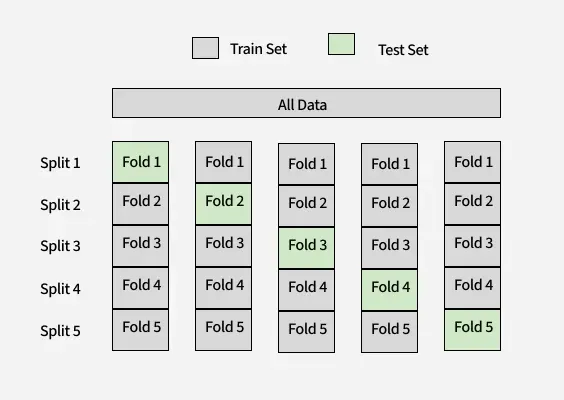

</center>

This method of ensemble training involves separating the total trainable dataset into $k$ partitions, and on each iteration validating the model on one partition and training on the rest. This leaves you with $k$ models that are built the same but all estimate in a slightly different way, since they've all seen different splits of the data, and the idea is that this variance will average out any error in classification.

<center>RESNET 18 7-FOLD ENSEMBLE: <b>0.5550</b></center>

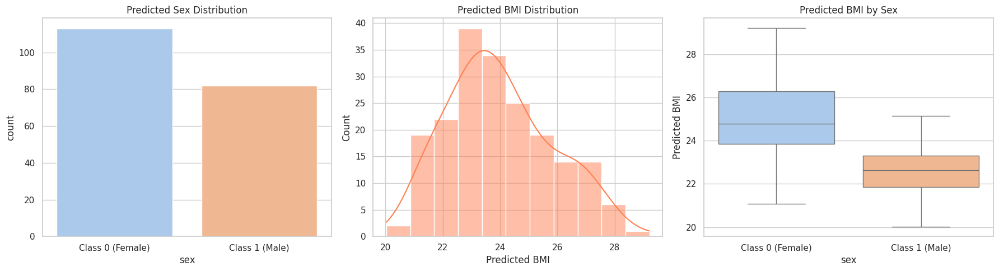

According to the public score, this model did very slightly worse than a single ResNet, however the private score of 0.5381 revealed that it had outperformed a single model. This is quite a typical outcome, as the effect of smoothing predictions over multiple estimators inherently has the effect of improving generalisation.

In [ ]:

# ─────────────────────────────────────────────
# MODEL DEFINITION
# ─────────────────────────────────────────────
class XRayMultiTaskResNet18(nn.Module):
    def __init__(self, dropout=0.4, freeze_backbone=True):
        super().__init__()
        base = resnet18(weights=ResNet18_Weights.IMAGENET1K_V1)
        self.backbone = nn.Sequential(*list(base.children())[:-1])  # (B, 512, 1, 1)

        if freeze_backbone:
            self.freeze_backbone()

        self.neck = nn.Sequential(
            nn.Linear(512, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
        )
        self.sex_head = nn.Sequential(
            nn.Linear(256, 64),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(64, 1),
        )
        self.bmi_head = nn.Sequential(
            nn.Linear(256, 64),
            nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(64, 1),
        )
        self._init_heads()

    def _init_heads(self):
        for m in [self.neck, self.sex_head, self.bmi_head]:
            for layer in m.modules():
                if isinstance(layer, nn.Linear):
                    nn.init.xavier_uniform_(layer.weight)
                    nn.init.zeros_(layer.bias)

    def freeze_backbone(self):
        for p in self.backbone.parameters():
            p.requires_grad = False

    def unfreeze_backbone(self, unfreeze_from_layer=6):
        for p in self.backbone.parameters():
            p.requires_grad = False
        for i, child in enumerate(self.backbone):
            if i >= unfreeze_from_layer:
                for p in child.parameters():
                    p.requires_grad = True

    def forward(self, x):
        x         = self.backbone(x).flatten(1)        # (B, 512)
        x         = self.neck(x)                       # (B, 256)
        sex_logit = self.sex_head(x).squeeze(1)        # (B,)
        bmi_pred  = self.bmi_head(x).squeeze(1)        # (B,)
        return sex_logit, bmi_pred


# ─────────────────────────────────────────────
# OPTIMISERS & HELPERS
# ─────────────────────────────────────────────
def build_optimiser_phase1(model, lr=1e-3, weight_decay=1e-4):
    params = [p for p in model.parameters() if p.requires_grad]
    return torch.optim.AdamW(params, lr=lr, weight_decay=weight_decay)

def build_optimiser_phase2(model, lr_backbone=1e-5, lr_heads=1e-4, weight_decay=1e-4):
    backbone_params = [p for p in model.backbone.parameters() if p.requires_grad]
    head_params     = (
        list(model.neck.parameters()) +
        list(model.sex_head.parameters()) +
        list(model.bmi_head.parameters())
    )
    return torch.optim.AdamW([
        {"params": backbone_params, "lr": lr_backbone},
        {"params": head_params,     "lr": lr_heads},
    ], weight_decay=weight_decay)

def train_one_epoch(model, loader, optimiser, criterion, device):
    model.train()
    total, s_sum, b_sum = 0.0, 0.0, 0.0

    for images, sex, bmi in loader:
        images, sex, bmi = images.to(device), sex.to(device), bmi.to(device)
        optimiser.zero_grad()
        sex_logit, bmi_pred = model(images)
        loss, l_sex, l_bmi  = criterion(sex_logit, sex, bmi_pred, bmi)
        loss.backward()
        optimiser.step()
        total += loss.item()
        s_sum += l_sex.item()
        b_sum += l_bmi.item()

    n = len(loader)
    return total / n, s_sum / n, b_sum / n

@torch.no_grad()
def evaluate(model, loader, criterion, device, scaler):
    model.eval()
    total_loss = 0.0
    all_sex_probs, all_sex_true = [], []
    all_bmi_pred,  all_bmi_true = [], []

    for images, sex, bmi in loader:
        images, sex, bmi = images.to(device), sex.to(device), bmi.to(device)
        sex_logit, bmi_pred = model(images)
        loss, _, _          = criterion(sex_logit, sex, bmi_pred, bmi)
        total_loss         += loss.item()

        all_sex_probs.extend(torch.sigmoid(sex_logit).cpu().numpy())
        all_sex_true.extend(sex.cpu().numpy())
        all_bmi_pred.extend(bmi_pred.cpu().numpy())
        all_bmi_true.extend(bmi.cpu().numpy())

    sex_preds     = (np.array(all_sex_probs) >= 0.5).astype(int)
    acc           = accuracy_score(all_sex_true, sex_preds)
    auc           = roc_auc_score(all_sex_true, all_sex_probs)

    bmi_pred_orig = scaler.inverse_transform(np.array(all_bmi_pred).reshape(-1, 1)).flatten()
    bmi_true_orig = scaler.inverse_transform(np.array(all_bmi_true).reshape(-1, 1)).flatten()
    mae           = np.mean(np.abs(bmi_pred_orig - bmi_true_orig))
    rmse          = np.sqrt(np.mean((bmi_pred_orig - bmi_true_orig) ** 2))
    r, _          = pearsonr(bmi_true_orig, bmi_pred_orig)

    return total_loss / len(loader), acc, auc, mae, rmse, r

@torch.no_grad()
def predict_test_ensemble(models_list, scalers_list, loader, device):
    """Runs inference across all K models and averages the predictions."""
    results = []

    for images, filenames in loader:
        images = images.to(device)

        batch_sex_probs = []
        batch_bmi_preds = []

        # Pass image through all models in the ensemble
        for model, scaler in zip(models_list, scalers_list):
            sex_logit, bmi_pred_scaled = model(images)

            # Classification probability
            sex_prob = torch.sigmoid(sex_logit).cpu().numpy()
            batch_sex_probs.append(sex_prob)

            # BMI Regression (Inverse Transform per model)
            bmi_orig = scaler.inverse_transform(bmi_pred_scaled.cpu().numpy().reshape(-1, 1)).flatten()
            batch_bmi_preds.append(bmi_orig)

        # Average the probabilities and BMIs across all models
        avg_sex_probs = np.mean(batch_sex_probs, axis=0)
        avg_bmi_preds = np.mean(batch_bmi_preds, axis=0)

        # Hard classify based on average probability
        avg_sex_labels = (avg_sex_probs >= 0.5).astype(int)

        for fname, prob, label, bmi in zip(filenames, avg_sex_probs, avg_sex_labels, avg_bmi_preds):
            results.append({
                "filename": fname,
                "sex": int(label),
                "sex_prob": round(float(prob), 4),
                "bmi": round(float(bmi),  2),
            })

    return pd.DataFrame(results)


# ─────────────────────────────────────────────
# CONFIGURATION & DATA PREP
# ─────────────────────────────────────────────
BATCH_SIZE    = 16
PHASE1_EPOCHS = 20
PHASE2_EPOCHS = 30
ALPHA         = 0.5
DROPOUT       = 0.4
PATIENCE      = 5
UNFREEZE_FROM = 4
N_FOLDS       = 7
DEVICE        = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(f"Device: {DEVICE}")

# 1. Combine Train and Val into a single Development Pool
dev_df = pd.concat([train_df, val_df]).reset_index(drop=True)

# 2. Create the 7 Folds (Grouped by Patient to prevent leak)
sgkf = StratifiedGroupKFold(n_splits=N_FOLDS)
dev_df['fold'] = -1
for fold_idx, (train_idx, val_idx) in enumerate(sgkf.split(dev_df, y=dev_df['sex'], groups=dev_df['anon_id'])):
    dev_df.loc[val_idx, 'fold'] = fold_idx

# Data structures to hold saved paths and scalers for ensembling later
saved_model_paths = []
saved_scalers = []

# ─────────────────────────────────────────────
# THE K-FOLD TRAINING LOOP
# ─────────────────────────────────────────────
for fold in range(N_FOLDS):
    print("\n" + "═"*60)
    print(f"🚀 STARTING FOLD {fold + 1}/{N_FOLDS}")
    print("═"*60)

    SAVE_PATH = f"best_resnet18_fold_{fold}.pt"
    saved_model_paths.append(SAVE_PATH)

    # Split data for this fold
    fold_train_df = dev_df[dev_df['fold'] != fold].reset_index(drop=True)
    fold_val_df   = dev_df[dev_df['fold'] == fold].reset_index(drop=True)

    # Fit scaler strictly on this fold's training data
    scaler = StandardScaler()
    scaler.fit(fold_train_df[["bmi"]].values)
    saved_scalers.append(scaler)

    # Init datasets
    train_ds = XRayDataset(fold_train_df, transform=train_transform, scaler=scaler)
    val_ds   = XRayDataset(fold_val_df,   transform=val_transform,   scaler=scaler)

    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True,  num_workers=2, pin_memory=True)
    val_loader   = DataLoader(val_ds,   batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

    # Re-initialize the Model for each fold
    model = XRayMultiTaskResNet18(dropout=DROPOUT, freeze_backbone=True).to(DEVICE)
    criterion = MultiTaskLoss(alpha=ALPHA)

    # ── Phase 1: Train heads only ──
    print(f"\n[Fold {fold+1}] PHASE 1 — Backbone frozen, training heads only")
    optimiser = build_optimiser_phase1(model, lr=1e-3)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimiser, mode='min', factor=0.5, patience=2)

    best_val_loss = float("inf")
    patience_ctr  = 0

    for epoch in range(1, PHASE1_EPOCHS + 1):
        tr_loss, tr_sex, tr_bmi   = train_one_epoch(model, train_loader, optimiser, criterion, DEVICE)
        val_loss, acc, auc, mae, rmse, r  = evaluate(model, val_loader, criterion, DEVICE, scaler)
        scheduler.step(val_loss)

        print(f" [P1 E{epoch:02d}] Train: {tr_loss:.4f} | Val Loss: {val_loss:.4f} | Sex AUC: {auc:.3f} | BMI RMSE: {rmse:.2f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_ctr  = 0
            torch.save(model.state_dict(), SAVE_PATH)
        else:
            patience_ctr += 1
            if patience_ctr >= PATIENCE:
                print(f"  -> Early stopping Phase 1 at epoch {epoch}.")
                break

    # ── Phase 2: Unfreeze and fine-tune ──
    print(f"\n[Fold {fold+1}] PHASE 2 — Unfreezing backbone from block {UNFREEZE_FROM}")
    model.load_state_dict(torch.load(SAVE_PATH, map_location=DEVICE))  # start from best P1
    model.unfreeze_backbone(unfreeze_from_layer=UNFREEZE_FROM)

    optimiser = build_optimiser_phase2(model, lr_backbone=3e-5, lr_heads=1e-4)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimiser, mode='min', factor=0.5, patience=2)

    best_val_loss = float("inf")
    patience_ctr  = 0

    for epoch in range(1, PHASE2_EPOCHS + 1):
        tr_loss, tr_sex, tr_bmi   = train_one_epoch(model, train_loader, optimiser, criterion, DEVICE)
        val_loss, acc, auc, mae, rmse, r  = evaluate(model, val_loader, criterion, DEVICE, scaler)
        scheduler.step(val_loss)

        print(f" [P2 E{epoch:02d}] Train: {tr_loss:.4f} | Val Loss: {val_loss:.4f} | Sex AUC: {auc:.3f} | BMI RMSE: {rmse:.2f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_ctr  = 0
            torch.save(model.state_dict(), SAVE_PATH)
        else:
            patience_ctr += 1
            if patience_ctr >= PATIENCE:
                print(f"  -> Early stopping Phase 2 at epoch {epoch}.")
                break

# ─────────────────────────────────────────────
# FINAL ENSEMBLE INFERENCE
# ─────────────────────────────────────────────
print("\n" + "═"*60)
print("TEST INFERENCE (7-FOLD ENSEMBLE)")
print("═"*60)

# 1. Load all 7 trained models into memory
ensemble_models = []
for fold_path in saved_model_paths:
    m = XRayMultiTaskResNet18(dropout=DROPOUT, freeze_backbone=False).to(DEVICE)
    m.load_state_dict(torch.load(fold_path, map_location=DEVICE))
    m.eval()
    ensemble_models.append(m)

# 2. Setup Test Loader (uses val_transform and is_test=True)
test_ds    = XRayDataset(test_df, transform=val_transform, is_test=True)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# 3. Generate Predictions using the Ensemble Function
results_df = predict_test_ensemble(ensemble_models, saved_scalers, test_loader, DEVICE)
results_df.to_csv("test_predictions_ensemble.csv", index=False)

print(f"Ensemble Predictions saved -> test_predictions_ensemble.csv ({len(results_df)} rows)")
print(f"\nSex distribution:  {results_df['sex'].value_counts().to_dict()}")
print(f"BMI range:         {results_df['bmi'].min():.1f} - {results_df['bmi'].max():.1f}")
print(f"\n{results_df.head()}")

Device: cuda

════════════════════════════════════════════════════════════
🚀 STARTING FOLD 1/7
════════════════════════════════════════════════════════════

[Fold 1] PHASE 1 — Backbone frozen, training heads only
 [P1 E01] Train: 1.2493 | Val Loss: 0.6671 | Sex AUC: 0.736 | BMI RMSE: 2.42
 [P1 E02] Train: 0.8206 | Val Loss: 0.5947 | Sex AUC: 0.731 | BMI RMSE: 2.24
 [P1 E03] Train: 0.7766 | Val Loss: 0.5593 | Sex AUC: 0.732 | BMI RMSE: 2.08
 [P1 E04] Train: 0.7117 | Val Loss: 0.5869 | Sex AUC: 0.772 | BMI RMSE: 2.22
 [P1 E05] Train: 0.6882 | Val Loss: 0.5388 | Sex AUC: 0.760 | BMI RMSE: 2.14
 [P1 E06] Train: 0.6477 | Val Loss: 0.5143 | Sex AUC: 0.776 | BMI RMSE: 2.04
 [P1 E07] Train: 0.6564 | Val Loss: 0.5263 | Sex AUC: 0.775 | BMI RMSE: 2.11
 [P1 E08] Train: 0.6019 | Val Loss: 0.5445 | Sex AUC: 0.781 | BMI RMSE: 2.14
 [P1 E09] Train: 0.5950 | Val Loss: 0.5528 | Sex AUC: 0.751 | BMI RMSE: 2.15
 [P1 E10] Train: 0.5687 | Val Loss: 0.5012 | Sex AUC: 0.757 | BMI RMSE: 1.99
 [P1 E11] Train: 

In [ ]:
print("\n" + "═"*60)
print("TEST INFERENCE (TOP-3 ENSEMBLE: Folds 1, 4, 7)")
print("═"*60)

# Python is 0-indexed, so Fold 1 = 0, Fold 4 = 3, Fold 7 = 6
target_indices = [0, 3, 6]

top_models = []
top_scalers = []

for idx in target_indices:
    # 1. Load the Model
    m = XRayMultiTaskResNet18(dropout=DROPOUT, freeze_backbone=False).to(DEVICE)
    m.load_state_dict(torch.load(f"best_resnet18_fold_{idx}.pt", map_location=DEVICE))
    m.eval()
    top_models.append(m)

    # 2. Get the corresponding Scaler
    top_scalers.append(saved_scalers[idx])

print(f"Loaded {len(top_models)} models for the ensemble.")

# Setup Test Loader
test_ds = XRayDataset(test_df, transform=val_transform, is_test=True)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)

# Generate Predictions
results_df = predict_test_ensemble(top_models, top_scalers, test_loader, DEVICE)
results_df.to_csv("test_predictions_top3_ensemble.csv", index=False)

print("Saved -> test_predictions_top3_ensemble.csv")


════════════════════════════════════════════════════════════
TEST INFERENCE (TOP-3 ENSEMBLE: Folds 1, 4, 7)
════════════════════════════════════════════════════════════
Loaded 3 models for the ensemble.
Saved -> test_predictions_top3_ensemble.csv


### ResNet18 + DenseNet121 Classifier

To understand whether there might be some improvement by combining these two models, I first undertook to investigate whether there was any meaningful difference between their predictions. After all, ensembling two near identical models would not make any difference in performance.

<center><b>ResNet & DenseNet Validation Set Predictions</b>

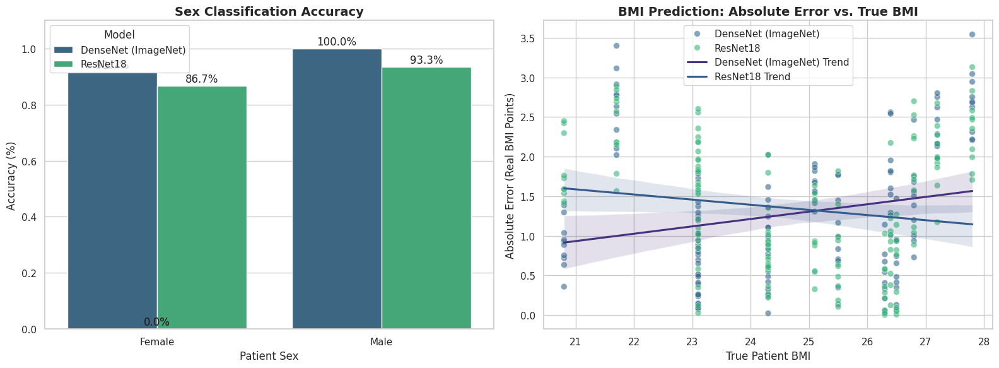

</center>

<center><b>ResNet & DenseNet Validation Set Confusion Matrices</b>

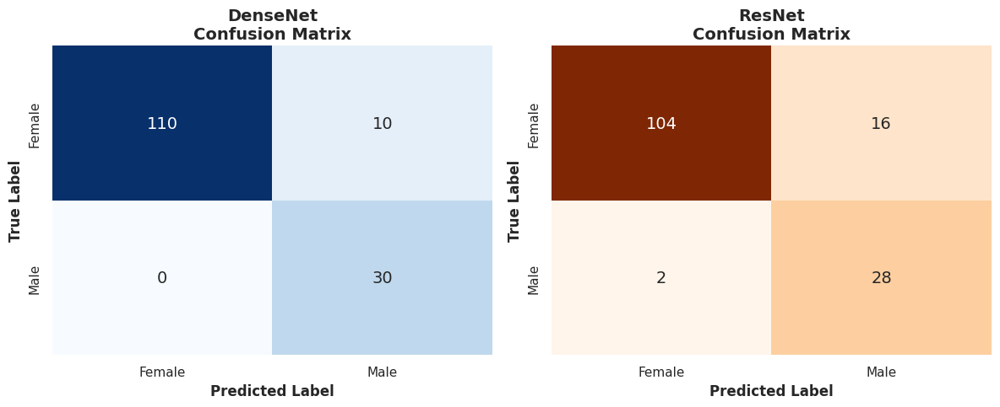
</center>

The sex classification between the two is quite similar, as can be seen in the confusion matrices, so there would probably be minimal improvement in that regard, however, the graph of True BMI vs Absolute Error shows a positive trend for DenseNet and a negative trend for ResNet. This means that by averaging the two a middle ground can be achieved that has minimal error.

<center>RESNET & DENSENET ENSEMBLE: <b>0.5404 - BEST PRIVATE SCORE</b>

---

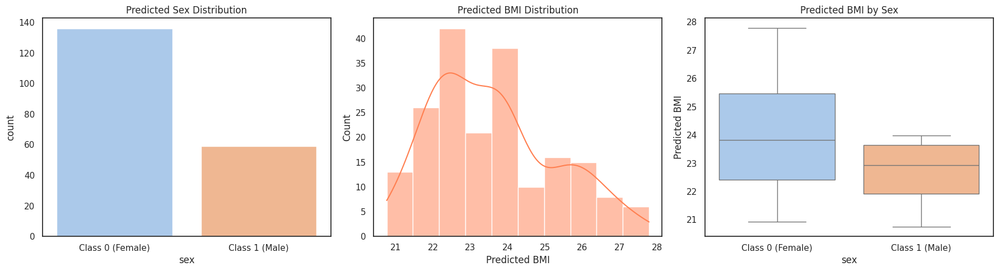

</center>

As expected, this had a better score on the private leaderboard than either DenseNet or ResNet did separately, and as before the public score was deceptively low at 0.5224. Being the best model to come out of this project, following section will investigate it further, both its properties as an ensemble and those of its parts.


In [77]:
class DenseNetMultiTaskEnsemble(nn.Module):
    def __init__(self, model_a, model_b):

        super().__init__()
        self.model_a = model_a
        self.model_b = model_b
        self.model_a.eval()
        self.model_b.eval()

    def forward(self, x):
        # 1. Get raw outputs from both models
        logit_a, bmi_a = self.model_a(x)
        logit_b, bmi_b = self.model_b(x)

        # CRITICAL: We must convert logits to probabilities (0 to 1)
        prob_a = torch.sigmoid(logit_a)
        prob_b = torch.sigmoid(logit_b)
        ensemble_sex_prob = (prob_a + prob_b) / 2.0

        # 3. BMI Regression (Direct Averaging)
        # Regression predictions are just real numbers, so we average them directly.
        ensemble_bmi_pred = (bmi_a + bmi_b) / 2.0

        # Note: We return a PROBABILITY for sex, not a logit.
        return ensemble_sex_prob, ensemble_bmi_pred

ensemble_model = DenseNetMultiTaskEnsemble(model_a=model, model_b=model_rn)

In [79]:
class DenseNetMultiTaskEnsemble(nn.Module):
    def __init__(self, model_a, model_b):
        super().__init__()
        self.model_a = model_a
        self.model_b = model_b
        self.model_a.eval()
        self.model_b.eval()

    def forward(self, x):
        logit_a, bmi_a = self.model_a(x)
        logit_b, bmi_b = self.model_b(x)

        # 1. Average the RAW LOGITS directly
        ensemble_sex_logit = (logit_a + logit_b) / 2.0

        # 2. Average the BMI Regression
        ensemble_bmi_pred = (bmi_a + bmi_b) / 2.0

        # Return exact same format as your base models (Logit, Pred)
        return ensemble_sex_logit, ensemble_bmi_pred

ensemble_model = DenseNetMultiTaskEnsemble(model_a=model, model_b=model_rn)

In [ ]:

@torch.no_grad()
def predict_test_ensemble_average(model_a, model_b, loader, device, scaler): #averaging predictions for sex and bmi
    model_a.eval()
    model_b.eval()
    results = []

    for images, filenames in loader:
        images = images.to(device)

        #Get predictions from both models
        logit_a, bmi_pred_a = model_a(images)
        logit_b, bmi_pred_b = model_b(images)

        #Ensemble Sex: Average the probabilities
        prob_a = torch.sigmoid(logit_a)
        prob_b = torch.sigmoid(logit_b)
        sex_probs = ((prob_a + prob_b) / 2.0).cpu().numpy()

        #Ensemble BMI: Average the raw regression values
        bmi_pred_ensemble = (bmi_pred_a + bmi_pred_b) / 2.0

        # Standard formatting
        sex_labels = (sex_probs >= 0.5).astype(int)
        bmi_orig   = scaler.inverse_transform(
            bmi_pred_ensemble.cpu().numpy().reshape(-1, 1)
        ).flatten()

        for fname, prob, label, bmi in zip(filenames, sex_probs, sex_labels, bmi_orig):
            results.append({
                "filename": fname,
                "sex": int(label),
                "sex_prob": round(float(prob), 4),
                "bmi": round(float(bmi), 2),
            })

    return pd.DataFrame(results)


@torch.no_grad()
def predict_test_ensemble_max_confidence(model_a, model_b, loader, device, scaler): #selecting the most confident answer for Sex
    model_a.eval()
    model_b.eval()
    results = []

    for images, filenames in loader:
        images = images.to(device)

        # 1. Get raw logits from both models
        logit_a, bmi_pred_a = model_a(images)
        logit_b, bmi_pred_b = model_b(images)

        a_is_more_confident = torch.abs(logit_a) > torch.abs(logit_b)

        best_logits = torch.where(a_is_more_confident, logit_a, logit_b)
        sex_probs = torch.sigmoid(best_logits).cpu().numpy()

        bmi_pred_ensemble = (bmi_pred_a + bmi_pred_b) / 2.0

        # 4. Standard formatting
        sex_labels = (sex_probs >= 0.5).astype(int)
        bmi_orig   = scaler.inverse_transform(
            bmi_pred_ensemble.cpu().numpy().reshape(-1, 1)
        ).flatten()

        for fname, prob, label, bmi in zip(filenames, sex_probs, sex_labels, bmi_orig):
            results.append({
                "filename": fname,
                "sex": int(label),
                "sex_prob": round(float(prob), 4),
                "bmi": round(float(bmi), 2),
            })

    return pd.DataFrame(results)


test_ds    = XRayDataset(test_df, transform=val_transform, is_test=True)
test_loader = DataLoader(test_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True)


results_df = predict_test_ensemble_max_confidence(model, model_rn, test_loader, DEVICE, scaler)
results_df.to_csv("test_predictions_rndn_average.csv", index=False)

print(f"Ensemble Predictions saved -> test_predictions_ensemble.csv ({len(results_df)} rows)")
print(f"\nSex distribution:  {results_df['sex'].value_counts().to_dict()}")
print(f"BMI range:         {results_df['bmi'].min():.1f} - {results_df['bmi'].max():.1f}")
print(f"\n{results_df.head()}")

Ensemble Predictions saved -> test_predictions_ensemble.csv (195 rows)

Sex distribution:  {0: 136, 1: 59}
BMI range:         20.8 - 27.8

        filename  sex  sex_prob    bmi
0  2803_4538.jpg    1    0.9962  22.47
1  4202_7304.jpg    0    0.0274  24.19
2  3638_6996.jpg    0    0.0001  24.81
3  3338_4713.jpg    1    0.9937  23.60
4  4251_8336.jpg    0    0.0153  22.70


#Final Model Evaluation and Explainability

## Comprehensive Validation Set Report

Both individual models show good performance, and as was seen in the kaggle private scores, the validation set performance for the ensemble is greater than either DenseNet or ResNet on its own, but there is a far more important benefit than that to be seen here.

Looking at the sex prediction confidence distribution graphs for DenseNet and ResNet(this graph shows the probability output for each validation example), it can be seen that most of the predictions have been stated so with a high confidence, which is a good thing. However, it is visible that there are predictions with very high confidence of male, but are actually female, with the same true the other way round for ResNet in particular, going as high as 1.0 (or 0.0).

This is quite a problem, especially when the probabilities are used instead of classifications. Its one thing to have a female be predicted male, but to have someone who is female be given a 99% probability of being male is not a good sign of confidence for a person perhaps in a medical or research setting, who may actually be making use of a system like this.

However, the ensemble model doesn't have any false positives for female going higher than 0.7, with the hump for male false positives on ResNet being shifted over as well. The mechanics of the ensemble's effect are more clear following this graph; the cut-and-dry examples are little affected, but the difficult cases are tugged in both directions, leading to them being pulled closer towards the right classification by one model when the other model would get it wrong.


🏥 CLINICAL EVALUATION REPORT: DENSENET

[ HEAD 1: SEX CLASSIFICATION ]
  • Overall Accuracy : 95.33%
  • ROC-AUC Score    : 0.9950
  • F1-Score         : 0.8923
  • Female Recall    : 95.00% (True Negatives)
  • Male Recall      : 96.67% (True Positives)

[ HEAD 2: BMI REGRESSION ]
  • Mean Abs Error (MAE) : 1.15 points
  • Root Mean Sq (RMSE)  : 1.38 points
  • R-Squared (R²)       : 0.5387
  • Pearson Corr (r)     : 0.7482
------------------------------------------------------------



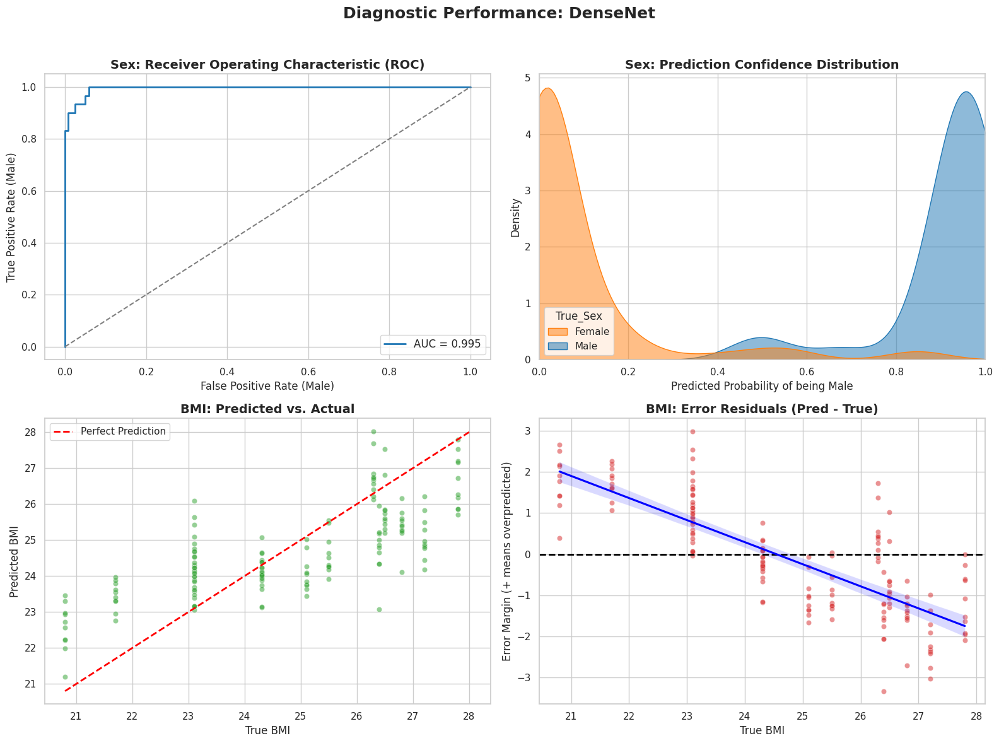

In [ ]:



@torch.no_grad()
def evaluate_and_report(model, val_loader, scaler, device, model_name="My Model"):
    """
    Takes a model object directly, runs inference over the validation loader,
    un-scales the BMI, and outputs a full metrics report and 2x2 graphics grid.
    """
    model.eval()

    all_sex_true = []
    all_sex_prob = []
    all_bmi_true = []
    all_bmi_pred = []

    # ==========================================
    # 1. RUN INFERENCE
    # ==========================================
    for images, sex, bmi in val_loader:
        images = images.to(device)

        # Get raw predictions
        sex_logit, bmi_pred = model(images)

        # Convert logit to probability
        sex_probs = torch.sigmoid(sex_logit)

        all_sex_true.extend(sex.cpu().numpy())
        all_sex_prob.extend(sex_probs.cpu().numpy())
        all_bmi_true.extend(bmi.cpu().numpy())
        all_bmi_pred.extend(bmi_pred.cpu().numpy())

    # Convert lists to arrays
    y_sex_true = np.array(all_sex_true)
    y_sex_prob = np.array(all_sex_prob)
    y_sex_pred = (y_sex_prob >= 0.5).astype(int)

    # Un-scale the BMI back to real-world values
    y_bmi_true = scaler.inverse_transform(np.array(all_bmi_true).reshape(-1, 1)).flatten()
    y_bmi_pred = scaler.inverse_transform(np.array(all_bmi_pred).reshape(-1, 1)).flatten()

    # ==========================================
    # 2. CALCULATE METRICS
    # ==========================================
    acc = accuracy_score(y_sex_true, y_sex_pred)
    auc = roc_auc_score(y_sex_true, y_sex_prob)
    f1  = f1_score(y_sex_true, y_sex_pred)
    recall_female = recall_score(y_sex_true, y_sex_pred, pos_label=0)
    recall_male   = recall_score(y_sex_true, y_sex_pred, pos_label=1)

    mae  = mean_absolute_error(y_bmi_true, y_bmi_pred)
    rmse = np.sqrt(mean_squared_error(y_bmi_true, y_bmi_pred))
    r2   = r2_score(y_bmi_true, y_bmi_pred)
    r, _ = pearsonr(y_bmi_true, y_bmi_pred)

    # ==========================================
    # 3. PRINT TEXT REPORT
    # ==========================================
    print(f"\n{'='*60}")
    print(f"🏥 CLINICAL EVALUATION REPORT: {model_name.upper()}")
    print(f"{'='*60}")

    print("\n[ HEAD 1: SEX CLASSIFICATION ]")
    print(f"  • Overall Accuracy : {acc:.2%}")
    print(f"  • ROC-AUC Score    : {auc:.4f}")
    print(f"  • F1-Score         : {f1:.4f}")
    print(f"  • Female Recall    : {recall_female:.2%} (True Negatives)")
    print(f"  • Male Recall      : {recall_male:.2%} (True Positives)")

    print("\n[ HEAD 2: BMI REGRESSION ]")
    print(f"  • Mean Abs Error (MAE) : {mae:.2f} points")
    print(f"  • Root Mean Sq (RMSE)  : {rmse:.2f} points")
    print(f"  • R-Squared (R²)       : {r2:.4f}")
    print(f"  • Pearson Corr (r)     : {r:.4f}")
    print(f"{'-'*60}\n")

    # ==========================================
    # 4. GENERATE GRAPHICS
    # ==========================================
    sns.set_theme(style="whitegrid")
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle(f"Diagnostic Performance: {model_name}", fontsize=18, fontweight='bold', y=0.98)

    # --- Plot 1: ROC Curve (Sex) ---
    fpr, tpr, _ = roc_curve(y_sex_true, y_sex_prob)
    axes[0, 0].plot(fpr, tpr, color='#1f77b4', lw=2, label=f'AUC = {auc:.3f}')
    axes[0, 0].plot([0, 1], [0, 1], color='gray', linestyle='--')
    axes[0, 0].set_title('Sex: Receiver Operating Characteristic (ROC)', fontsize=14, fontweight='bold')
    axes[0, 0].set_xlabel('False Positive Rate (Male)')
    axes[0, 0].set_ylabel('True Positive Rate (Male)')
    axes[0, 0].legend(loc='lower right', fontsize=12)

    # --- Plot 2: Probability Density (Sex) ---
    plot_df = pd.DataFrame({'Sex_Prob': y_sex_prob, 'True_Sex': np.where(y_sex_true == 0, 'Female', 'Male')})
    sns.kdeplot(data=plot_df, x='Sex_Prob', hue='True_Sex', fill=True, common_norm=False,
                palette={'Female': '#ff7f0e', 'Male': '#1f77b4'}, ax=axes[0, 1], alpha=0.5)
    axes[0, 1].set_title('Sex: Prediction Confidence Distribution', fontsize=14, fontweight='bold')
    axes[0, 1].set_xlabel('Predicted Probability of being Male')
    axes[0, 1].set_xlim(0, 1)

    # --- Plot 3: True vs Predicted (BMI) ---
    sns.scatterplot(x=y_bmi_true, y=y_bmi_pred, alpha=0.5, color='#2ca02c', ax=axes[1, 0])
    min_val, max_val = min(y_bmi_true.min(), y_bmi_pred.min()), max(y_bmi_true.max(), y_bmi_pred.max())
    axes[1, 0].plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', lw=2, label='Perfect Prediction')
    axes[1, 0].set_title('BMI: Predicted vs. Actual', fontsize=14, fontweight='bold')
    axes[1, 0].set_xlabel('True BMI')
    axes[1, 0].set_ylabel('Predicted BMI')
    axes[1, 0].legend()

    # --- Plot 4: Residual Plot (BMI) ---
    residuals = y_bmi_pred - y_bmi_true
    sns.scatterplot(x=y_bmi_true, y=residuals, alpha=0.5, color='#d62728', ax=axes[1, 1])
    axes[1, 1].axhline(0, color='black', linestyle='--', lw=2)
    sns.regplot(x=y_bmi_true, y=residuals, scatter=False, color='blue', ax=axes[1, 1])
    axes[1, 1].set_title('BMI: Error Residuals (Pred - True)', fontsize=14, fontweight='bold')
    axes[1, 1].set_xlabel('True BMI')
    axes[1, 1].set_ylabel('Error Margin (+ means overpredicted)')

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# --- Example Usage ---
evaluate_and_report(model=model, val_loader=val_loader, scaler=scaler, device=DEVICE, model_name="DenseNet")


🏥 CLINICAL EVALUATION REPORT: RESNET18

[ HEAD 1: SEX CLASSIFICATION ]
  • Overall Accuracy : 92.67%
  • ROC-AUC Score    : 0.9831
  • F1-Score         : 0.8358
  • Female Recall    : 92.50% (True Negatives)
  • Male Recall      : 93.33% (True Positives)

[ HEAD 2: BMI REGRESSION ]
  • Mean Abs Error (MAE) : 1.52 points
  • Root Mean Sq (RMSE)  : 1.76 points
  • R-Squared (R²)       : 0.2464
  • Pearson Corr (r)     : 0.5882
------------------------------------------------------------



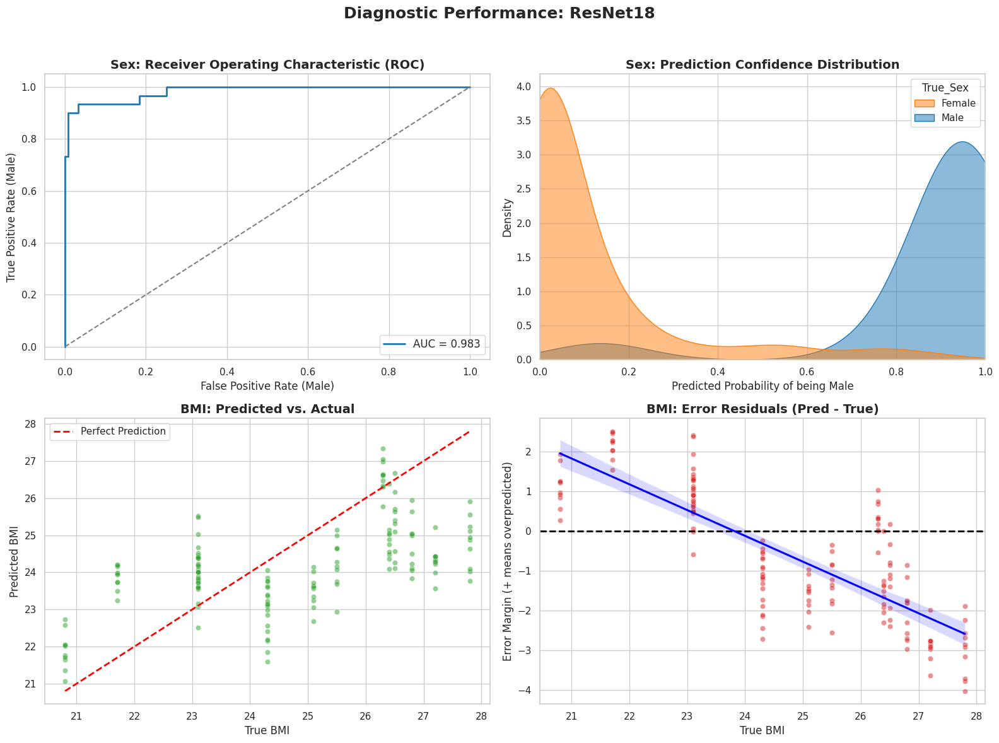

In [ ]:
evaluate_and_report(model=model_rn, val_loader=val_loader, scaler=scaler, device=DEVICE, model_name="ResNet18")


🏥 CLINICAL EVALUATION REPORT: RESNET & DENSENET ENSEMBLE

[ HEAD 1: SEX CLASSIFICATION ]
  • Overall Accuracy : 96.00%
  • ROC-AUC Score    : 0.9964
  • F1-Score         : 0.9032
  • Female Recall    : 96.67% (True Negatives)
  • Male Recall      : 93.33% (True Positives)

[ HEAD 2: BMI REGRESSION ]
  • Mean Abs Error (MAE) : 1.31 points
  • Root Mean Sq (RMSE)  : 1.49 points
  • R-Squared (R²)       : 0.4580
  • Pearson Corr (r)     : 0.7200
------------------------------------------------------------



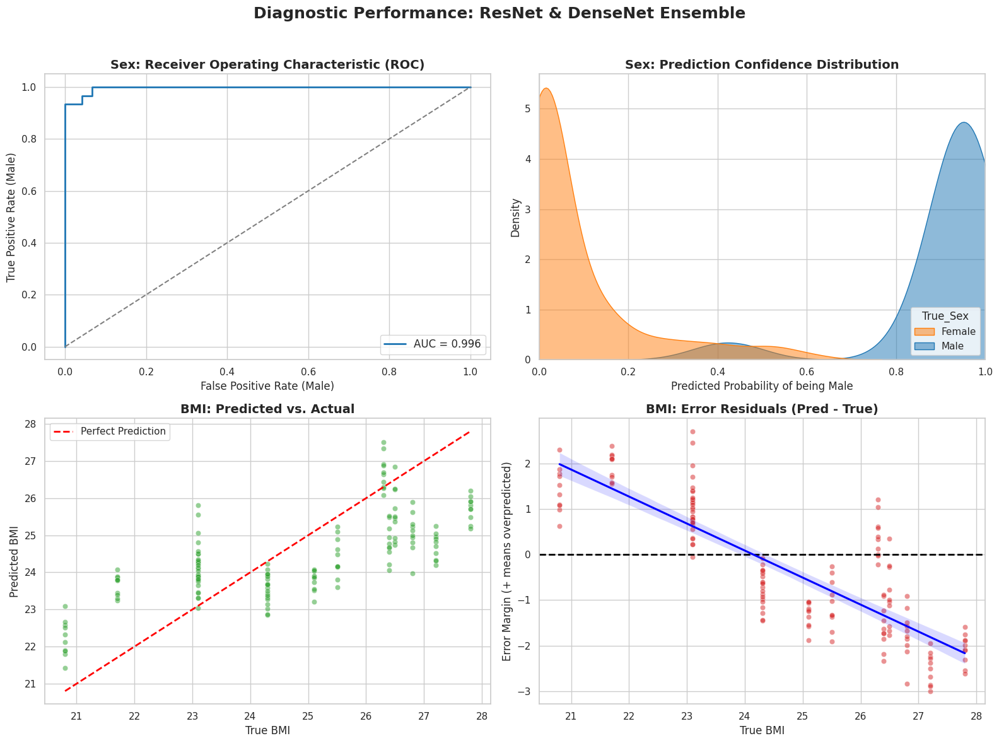

In [ ]:
evaluate_and_report(model=ensemble_model, val_loader=val_loader, scaler=scaler, device=DEVICE, model_name="ResNet & DenseNet Ensemble")

## Grad-CAM

Grad-CAM is an XAI (Explainable AI) technique that allows you to see where the model was "looking" when it makes its predictions, giving some idea of what's going on under the hood in what is usually considered a sub-symbolic machine learning method (not defined by clear rules).

This particular Grad-CAM setup being used uses no normalisation or activation, just raw CAM values. So the "hot" parts can be attributed as affecting estimation in the positive direction (towards Male/increasing BMI) and "cold" parts as in the negative direction (towards Female/lowering BMI).

Of course being an ensemble of two models it is not possible to perform Grad-CAM on it, so the Grad-CAM will be done separately on its two constituents.

Both the 3 highest and 3 lowest loss images have been provided for the heatmaps, in order to provide greater insight as to what the model is looking at both when it's right and when it's wrong.

The 3 lowest loss male images have also been selected to analyse, as for both models the lowest overrall are all female.

In [73]:
# ─────────────────────────────────────────────
# GRAD-CAM
# ─────────────────────────────────────────────

class GradCAM:
    """
    Hooks into a target conv layer, runs a forward pass,
    then backprops a scalar target to get gradient-weighted
    activation maps.
    """
    def __init__(self, chosen_model, target_layer):
        self.chosen_model        = chosen_model
        self.activations  = None
        self.gradients    = None

        # forward hook — store activations
        self._fwd = target_layer.register_forward_hook(
            lambda m, inp, out: setattr(self, "activations", out.detach())
        )
        # backward hook — store gradients
        self._bwd = target_layer.register_full_backward_hook(
            lambda m, grad_in, grad_out: setattr(self, "gradients", grad_out[0].detach())
        )

    def generate(self, input_tensor, target="sex"):
        """
        target: "sex" or "bmi"
        Returns a (H, W) numpy heatmap in [0, 1].
        """
        self.chosen_model.eval()
        input_tensor = input_tensor.unsqueeze(0)   # (1, C, H, W)
        input_tensor.requires_grad_()

        sex_logit, bmi_pred = self.chosen_model(input_tensor)

        self.chosen_model.zero_grad()
        if target == "sex":
            scalar = sex_logit.squeeze()
        else:
            scalar = bmi_pred.squeeze()
        scalar.backward()

        # global average pool gradients over spatial dims  → (C,)
        weights = self.gradients.squeeze(0).mean(dim=(1, 2))

        # weighted combination of activation maps → (H, W)
        cam = (weights[:, None, None] * self.activations.squeeze(0)).sum(dim=0)
        #cam = F.relu(cam)   # keep only positive contributions

        # normalise to [0, 1]
        #cam -= cam.min()
        #if cam.max() > 0:
            #cam /= cam.max()

        return cam.cpu().numpy()

    def remove_hooks(self):
        self._fwd.remove()
        self._bwd.remove()


# ─────────────────────────────────────────────
# FIND 3 HIGHEST LOSS VALIDATION IMAGES
# ─────────────────────────────────────────────

def get_highest_loss_samples_sex(chosen_model, val_df, scaler, transform, device, n=3):
    """
    Runs inference over the full val set, computes per-sample combined loss,
    returns the n highest loss samples as a list of dicts.
    """
    chosen_model.eval()
    bce = torch.nn.BCEWithLogitsLoss(reduction="none")
    mse = torch.nn.MSELoss(reduction="none")
    records = []

    for idx in range(len(val_df)):
        row      = val_df.iloc[idx]
        img_path = row["image"]
        sex_true = torch.tensor([row["sex"]], dtype=torch.float32).to(device)
        bmi_raw  = np.array([[row["bmi"]]], dtype=np.float32)
        bmi_true = torch.tensor(scaler.transform(bmi_raw)[0], dtype=torch.float32).to(device)

        image = Image.open(img_path).convert("RGB")
        tensor = transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            sex_logit, bmi_pred = chosen_model(tensor)

        loss_sex = bce(sex_logit.squeeze(), sex_true.squeeze()).item()
        loss_bmi = mse(bmi_pred.squeeze(), bmi_true.squeeze()).item()
        loss     = loss_sex

        records.append({
            "idx":       idx,
            "img_path":  img_path,
            "filename":  row["filename"],
            "sex_true":  int(row["sex"]),
            "bmi_true":  row["bmi"],
            "sex_pred":  float(torch.sigmoid(sex_logit).item()),
            "bmi_pred":  float(scaler.inverse_transform(bmi_pred.cpu().numpy().reshape(-1,1))[0][0]),
            "loss":      loss,
            "tensor":    transform(image),   # store for Grad-CAM
            "pil":       image,
        })

    records.sort(key=lambda x: x["loss"], reverse=True)
    return records[:n]


def get_highest_loss_samples_bmi(chosen_model, val_df, scaler, transform, device, n=3):
    """
    Runs inference over the full val set, computes per-sample combined loss,
    returns the n highest loss samples as a list of dicts.
    """
    chosen_model.eval()
    bce = torch.nn.BCEWithLogitsLoss(reduction="none")
    mse = torch.nn.MSELoss(reduction="none")
    records = []

    for idx in range(len(val_df)):
        row      = val_df.iloc[idx]
        img_path = row["image"]
        sex_true = torch.tensor([row["sex"]], dtype=torch.float32).to(device)
        bmi_raw  = np.array([[row["bmi"]]], dtype=np.float32)
        bmi_true = torch.tensor(scaler.transform(bmi_raw)[0], dtype=torch.float32).to(device)

        image = Image.open(img_path).convert("RGB")
        tensor = transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            sex_logit, bmi_pred = chosen_model(tensor)

        loss_sex = bce(sex_logit.squeeze(), sex_true.squeeze()).item()
        loss_bmi = mse(bmi_pred.squeeze(), bmi_true.squeeze()).item()
        loss     = loss_bmi

        records.append({
            "idx":       idx,
            "img_path":  img_path,
            "filename":  row["filename"],
            "sex_true":  int(row["sex"]),
            "bmi_true":  row["bmi"],
            "sex_pred":  float(torch.sigmoid(sex_logit).item()),
            "bmi_pred":  float(scaler.inverse_transform(bmi_pred.cpu().numpy().reshape(-1,1))[0][0]),
            "loss":      loss,
            "tensor":    transform(image),   # store for Grad-CAM
            "pil":       image,
        })

    records.sort(key=lambda x: x["loss"], reverse=True)
    return records[:n]

# ─────────────────────────────────────────────
# FIND 3 LOWEST LOSS VALIDATION IMAGES
# ─────────────────────────────────────────────

def get_lowest_loss_samples_sex(chosen_model, val_df, scaler, transform, device, n=3):
    """
    Runs inference over the full val set, computes per-sample combined loss,
    returns the n highest loss samples as a list of dicts.
    """
    chosen_model.eval()
    bce = torch.nn.BCEWithLogitsLoss(reduction="none")
    mse = torch.nn.MSELoss(reduction="none")
    records = []

    for idx in range(len(val_df)):
        row      = val_df.iloc[idx]
        img_path = row["image"]
        sex_true = torch.tensor([row["sex"]], dtype=torch.float32).to(device)
        bmi_raw  = np.array([[row["bmi"]]], dtype=np.float32)
        bmi_true = torch.tensor(scaler.transform(bmi_raw)[0], dtype=torch.float32).to(device)

        image = Image.open(img_path).convert("RGB")
        tensor = transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            sex_logit, bmi_pred = chosen_model(tensor)

        loss_sex = bce(sex_logit.squeeze(), sex_true.squeeze()).item()
        loss_bmi = mse(bmi_pred.squeeze(), bmi_true.squeeze()).item()
        loss     = loss_sex

        records.append({
            "idx":       idx,
            "img_path":  img_path,
            "filename":  row["filename"],
            "sex_true":  int(row["sex"]),
            "bmi_true":  row["bmi"],
            "sex_pred":  float(torch.sigmoid(sex_logit).item()),
            "bmi_pred":  float(scaler.inverse_transform(bmi_pred.cpu().numpy().reshape(-1,1))[0][0]),
            "loss":      loss,
            "tensor":    transform(image),   # store for Grad-CAM
            "pil":       image,
        })

    records.sort(key=lambda x: x["loss"], reverse=True)
    return records[-n:]

def get_lowest_loss_samples_male(chosen_model, val_df, scaler, transform, device, n=3):
    """
    Runs inference over the full val set, computes per-sample combined loss,
    returns the n highest loss samples as a list of dicts.
    """
    chosen_model.eval()
    bce = torch.nn.BCEWithLogitsLoss(reduction="none")
    mse = torch.nn.MSELoss(reduction="none")
    records = []

    for idx in range(len(val_df)):
        row      = val_df.iloc[idx]
        img_path = row["image"]
        sex_true = torch.tensor([row["sex"]], dtype=torch.float32).to(device)
        bmi_raw  = np.array([[row["bmi"]]], dtype=np.float32)
        bmi_true = torch.tensor(scaler.transform(bmi_raw)[0], dtype=torch.float32).to(device)

        image = Image.open(img_path).convert("RGB")
        tensor = transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            sex_logit, bmi_pred = chosen_model(tensor)

        loss_sex = bce(sex_logit.squeeze(), sex_true.squeeze()).item()
        loss_bmi = mse(bmi_pred.squeeze(), bmi_true.squeeze()).item()
        loss     = loss_sex

        if int(row["sex"]) == 1:
          records.append({
              "idx":       idx,
              "img_path":  img_path,
              "filename":  row["filename"],
              "sex_true":  int(row["sex"]),
              "bmi_true":  row["bmi"],
              "sex_pred":  float(torch.sigmoid(sex_logit).item()),
              "bmi_pred":  float(scaler.inverse_transform(bmi_pred.cpu().numpy().reshape(-1,1))[0][0]),
              "loss":      loss,
              "tensor":    transform(image),   # store for Grad-CAM
              "pil":       image,
          })

    records.sort(key=lambda x: x["loss"], reverse=True)
    return records[-n:]


def get_lowest_loss_samples_bmi(chosen_model, val_df, scaler, transform, device, n=3):
    """
    Runs inference over the full val set, computes per-sample combined loss,
    returns the n highest loss samples as a list of dicts.
    """
    chosen_model.eval()
    bce = torch.nn.BCEWithLogitsLoss(reduction="none")
    mse = torch.nn.MSELoss(reduction="none")
    records = []

    for idx in range(len(val_df)):
        row      = val_df.iloc[idx]
        img_path = row["image"]
        sex_true = torch.tensor([row["sex"]], dtype=torch.float32).to(device)
        bmi_raw  = np.array([[row["bmi"]]], dtype=np.float32)
        bmi_true = torch.tensor(scaler.transform(bmi_raw)[0], dtype=torch.float32).to(device)

        image = Image.open(img_path).convert("RGB")
        tensor = transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            sex_logit, bmi_pred = chosen_model(tensor)

        loss_sex = bce(sex_logit.squeeze(), sex_true.squeeze()).item()
        loss_bmi = mse(bmi_pred.squeeze(), bmi_true.squeeze()).item()
        loss     = loss_bmi

        records.append({
            "idx":       idx,
            "img_path":  img_path,
            "filename":  row["filename"],
            "sex_true":  int(row["sex"]),
            "bmi_true":  row["bmi"],
            "sex_pred":  float(torch.sigmoid(sex_logit).item()),
            "bmi_pred":  float(scaler.inverse_transform(bmi_pred.cpu().numpy().reshape(-1,1))[0][0]),
            "loss":      loss,
            "tensor":    transform(image),   # store for Grad-CAM
            "pil":       image,
        })

    records.sort(key=lambda x: x["loss"], reverse=True)
    return records[-n:]



# ─────────────────────────────────────────────
# PLOT HEATMAPS
# ─────────────────────────────────────────────

def plot_gradcam(chosen_model, samples, target_layer, device, target="sex", label="Model"):
    gradcam = GradCAM(chosen_model, target_layer)
    n       = len(samples)
    fig, axes = plt.subplots(n, 2, figsize=(8, 4 * n))
    if n == 1:
        axes = [axes]

    for i, sample in enumerate(samples):
        tensor = sample["tensor"].to(device)
        cam    = gradcam.generate(tensor, target=target)

        img_np = np.array(sample["pil"].resize((224, 224)))
        if img_np.ndim == 2:
            img_rgb = np.stack([img_np / 255.0] * 3, axis=-1)
        else:
            img_rgb = img_np / 255.0

        cam_resized = np.array(
            Image.fromarray(cam).resize((224, 224), Image.BILINEAR)
        )

        # heatmap overlay
        vmax    = np.abs(cam_resized).max()
        cam_norm = (cam_resized + vmax) / (2 * vmax)   # shift to [0,1] for colormap
        heatmap = cm.RdBu_r(cam_norm)[..., :3]
        overlay = 0.6 * heatmap + 0.4 * img_rgb

        sex_label  = "Male" if sample["sex_true"] == 1 else "Female"
        pred_label = "Male" if sample["sex_pred"] >= 0.5 else "Female"

        axes[i][0].imshow(img_rgb, cmap="gray")
        axes[i][0].set_title(
            f"{sample['filename']}\n"
            f"True: {sex_label}, BMI={sample['bmi_true']:.1f}\n"
            f"Pred: {pred_label} ({sample['sex_pred']:.2f}), BMI={sample['bmi_pred']:.1f}\n"
            f"Loss: {sample['loss']:.4f}",
            fontsize=8
        )
        axes[i][0].axis("off")

        axes[i][1].imshow(overlay)
        axes[i][1].set_title(f"Grad-CAM ({target} head)", fontsize=8)
        axes[i][1].axis("off")

    plt.suptitle(f"Top {n} Highest Loss Validation Samples — {label} ({target})", fontsize=11)
    plt.tight_layout()
    plt.savefig(f"gradcam_{target}_top{n}.png", dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved -> gradcam_{target}_top{n}.png")

    gradcam.remove_hooks()

###ResNet18

Before any analysis, this visualisation has allowed us to determine before anything that both of these models are capable of identifying a spine, which was hitherto unknown.

But for the sex classification task, the high loss images are unable to lock onto the spine, or are distracted from the spine by some other feature of the image leading them astray, whereas in the low loss images, the model is totally locked into the spine with no distraction.

For BMI regression, the high loss image heatmaps show red, showing that most of the error here comes from overestimation, not underestimation. The high loss images are locked onto the spine, whereas the low loss images are looking diffusely around the spine. This follows logic, as the adipose tissue around the spine is what would be more of an effective predictor of BMI.

#### Highest Loss

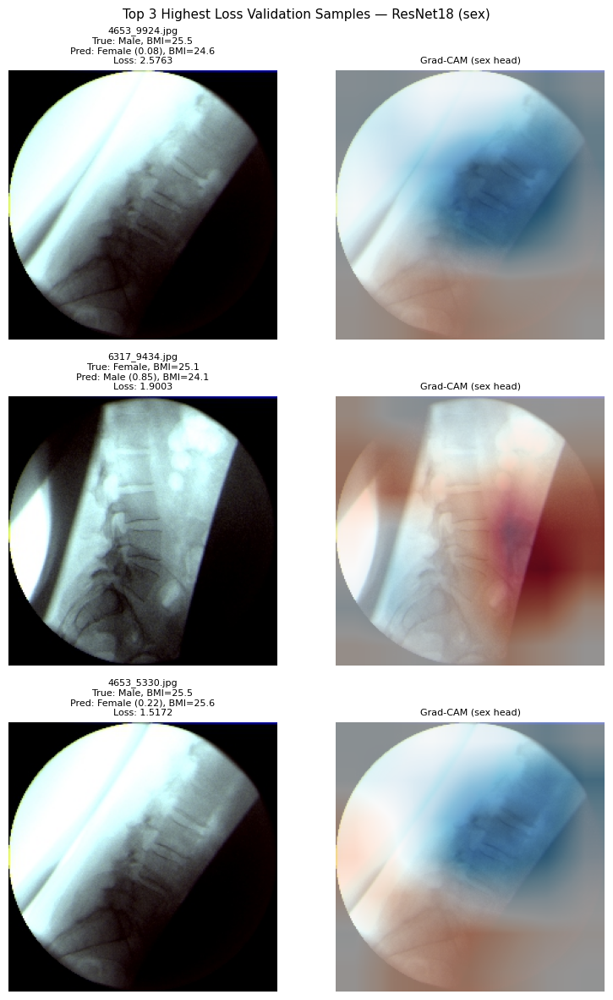

Saved -> gradcam_sex_top3.png


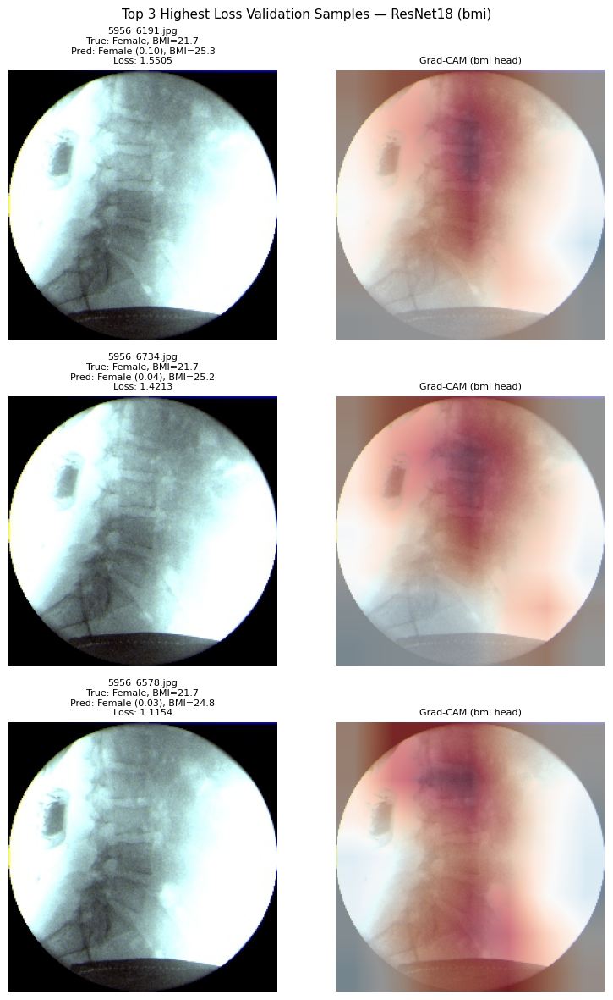

Saved -> gradcam_bmi_top3.png


In [68]:

target_layer = model_rn.backbone[-2]   # <-- adjust per model

sex_samples = get_highest_loss_samples_sex(model_rn, val_df, scaler, val_transform, DEVICE, n=3)
bmi_samples = get_highest_loss_samples_bmi(model_rn, val_df, scaler, val_transform, DEVICE, n=3)

# Generate for sex head
plot_gradcam(model_rn, sex_samples, target_layer, DEVICE, target="sex", label="ResNet18")

# Generate for bmi head
plot_gradcam(model_rn, bmi_samples, target_layer, DEVICE, target="bmi", label="ResNet18")

#### Lowest Loss

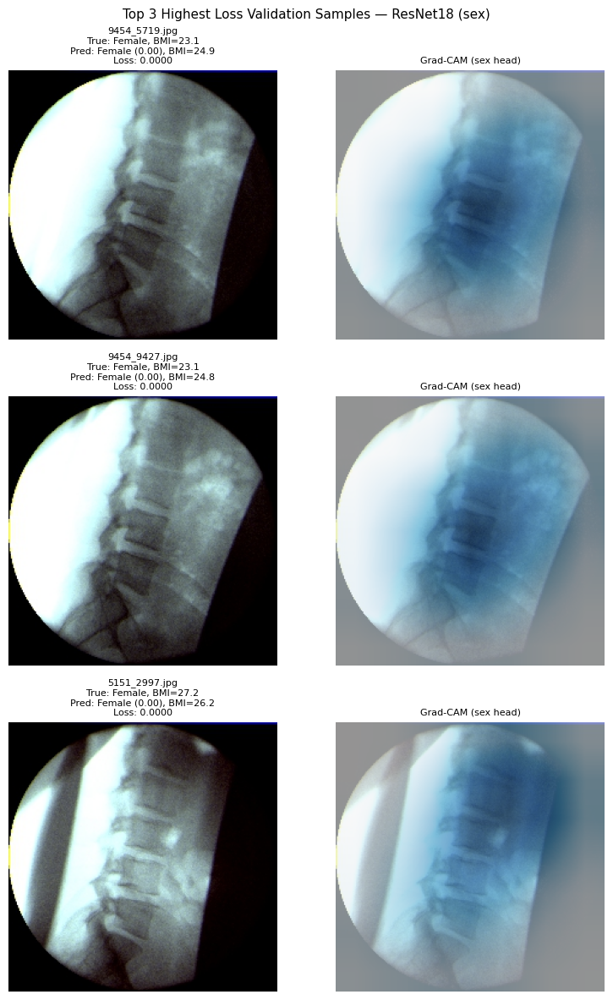

Saved -> gradcam_sex_top3.png


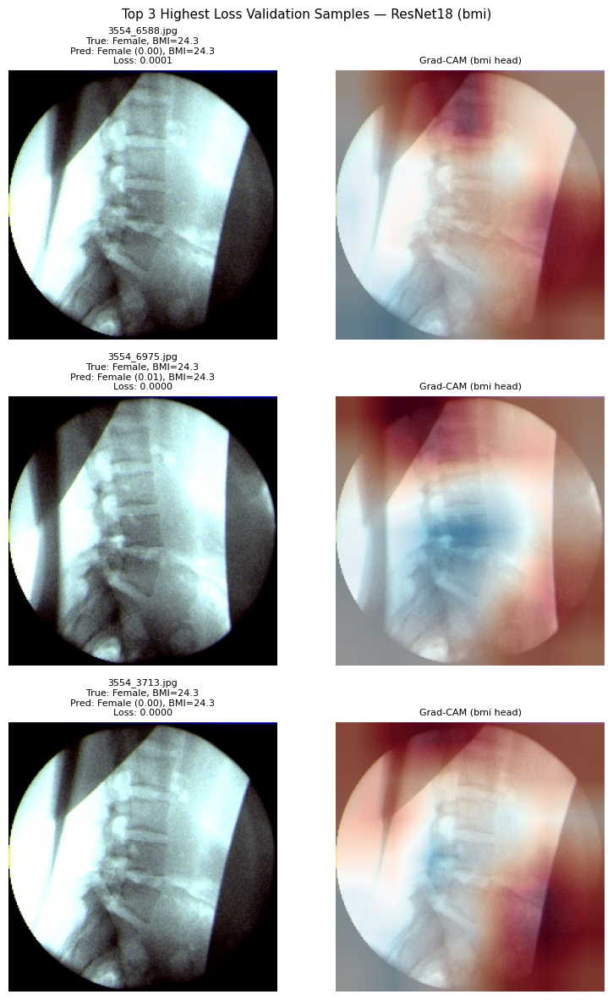

Saved -> gradcam_bmi_top3.png


In [70]:
target_layer = model_rn.backbone[-2]   # <-- adjust per model

sex_samples = get_lowest_loss_samples_sex(model_rn, val_df, scaler, val_transform, DEVICE, n=3)
bmi_samples = get_lowest_loss_samples_bmi(model_rn, val_df, scaler, val_transform, DEVICE, n=3)

# Generate for sex head
plot_gradcam(model_rn, sex_samples, target_layer, DEVICE, target="sex", label="ResNet18")

# Generate for bmi head
plot_gradcam(model_rn, bmi_samples, target_layer, DEVICE, target="bmi", label="ResNet18")

####Lowest Male Loss

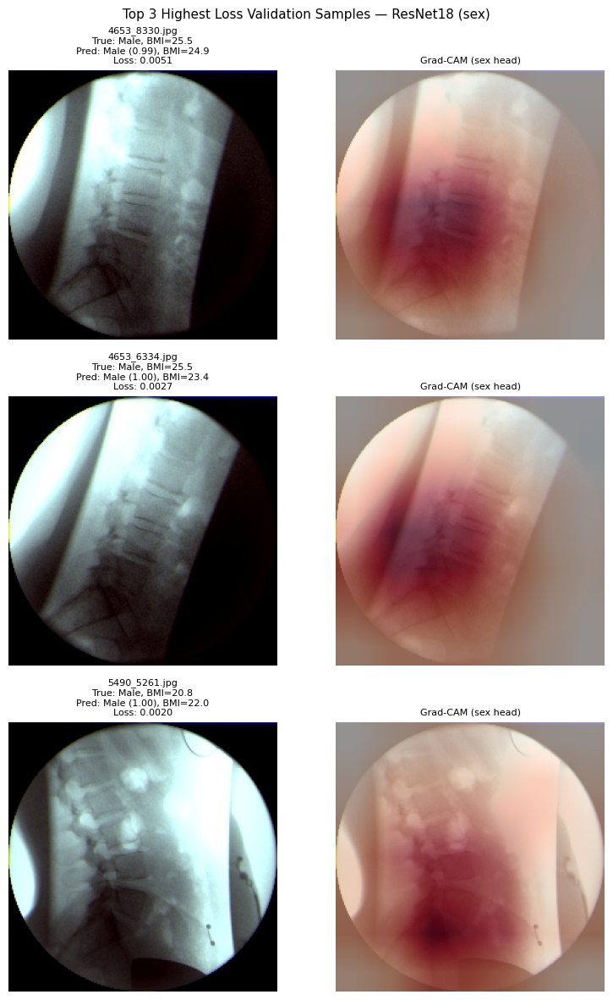

Saved -> gradcam_sex_top3.png


In [74]:
target_layer = model_rn.backbone[-2]   # <-- adjust per model

male_samples = get_lowest_loss_samples_male(model_rn, val_df, scaler, val_transform, DEVICE, n=3)

# Generate for sex head
plot_gradcam(model_rn, male_samples, target_layer, DEVICE, target="sex", label="ResNet18")

###DenseNet121

For sex classification, similarly to before the high loss images are unable to locate the spine and have a noisy signal. the maximum loss here is slightly lower for DenseNet. The lowest 3 loss images are as again centered on the spine, however, the lowest 3 loss images for the male class specifically are not centered on the spine at all, rather they look very diffusely at the image instead of concentrating on any one place.

This is unlike the ResNet where both male and female low loss images are focused on the spine. This difference in where the models are looking for a classification is strong support for ensembling. Having ResNet focus on the spine and DenseNet scan across the image when classifying the male class would be sure to improve performance.

For BMI regression, there is no clear difference in the heatmap between high loss and low loss samples. Both appear to have very noisy, mixed signals. It clearly works, however not as well as the ResNet, which had a slightly better performance on this target in terms of lowest minimum error.

####Highest Loss

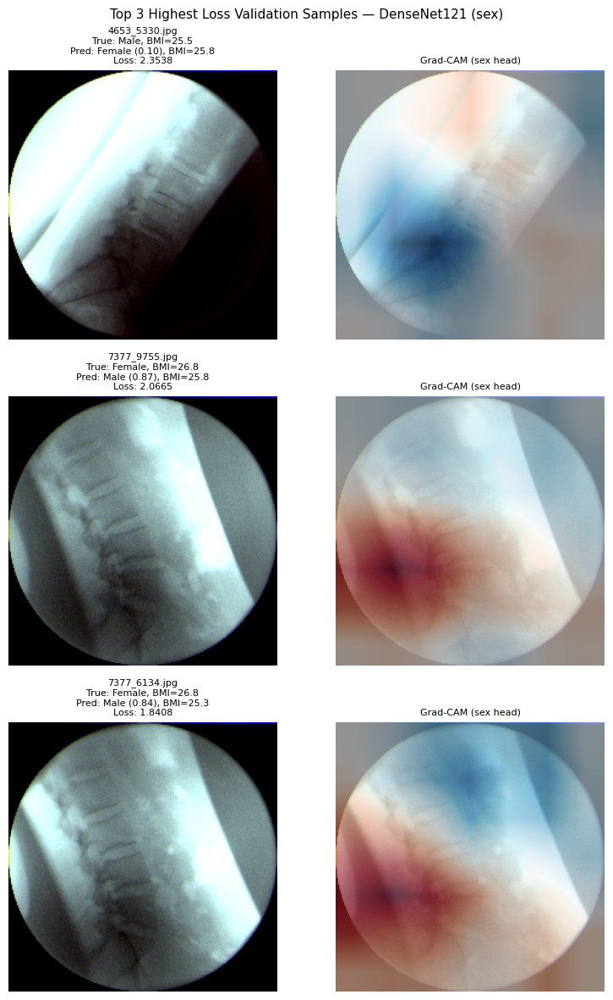

Saved -> gradcam_sex_top3.png


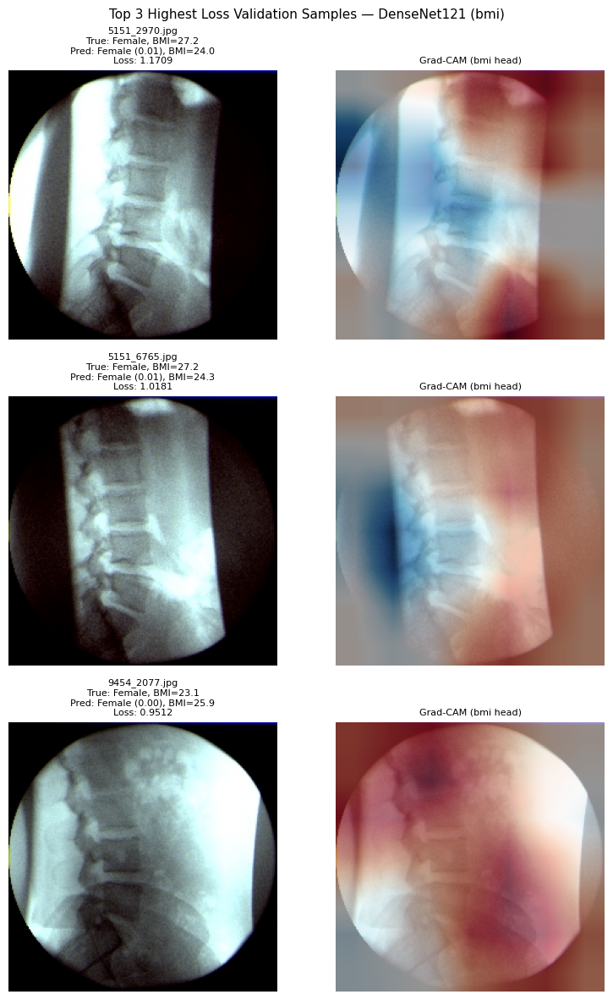

Saved -> gradcam_bmi_top3.png


In [71]:
target_layer = model.backbone.denseblock4   # <-- adjust per model

sex_samples = get_highest_loss_samples_sex(model, val_df, scaler, val_transform, DEVICE, n=3)
bmi_samples = get_highest_loss_samples_bmi(model, val_df, scaler, val_transform, DEVICE, n=3)

# Generate for sex head
plot_gradcam(model, sex_samples, target_layer, DEVICE, target="sex", label="DenseNet121")

# Generate for bmi head
plot_gradcam(model, bmi_samples, target_layer, DEVICE, target="bmi", label = "DenseNet121")

####Lowest Loss

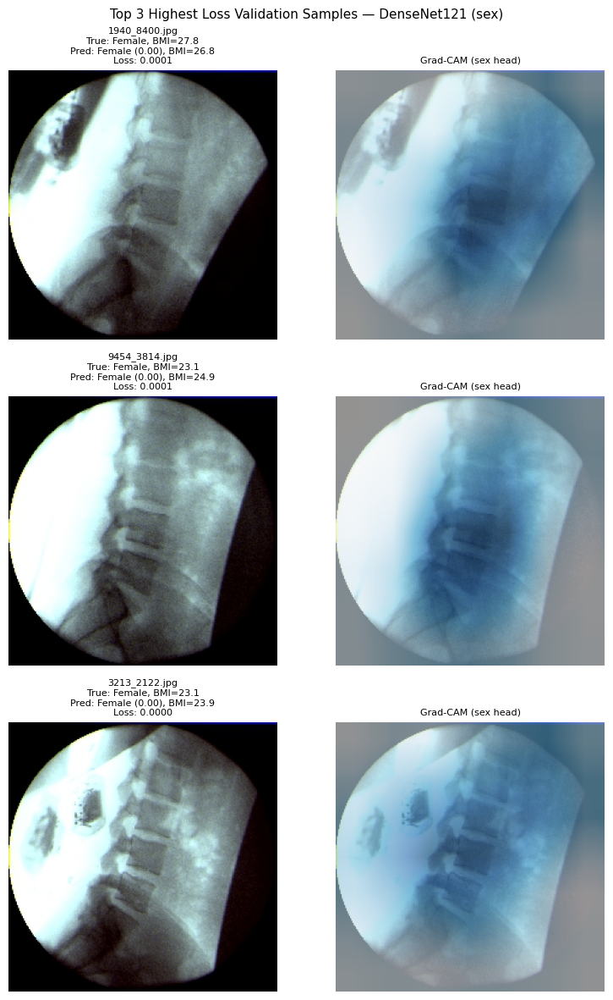

Saved -> gradcam_sex_top3.png


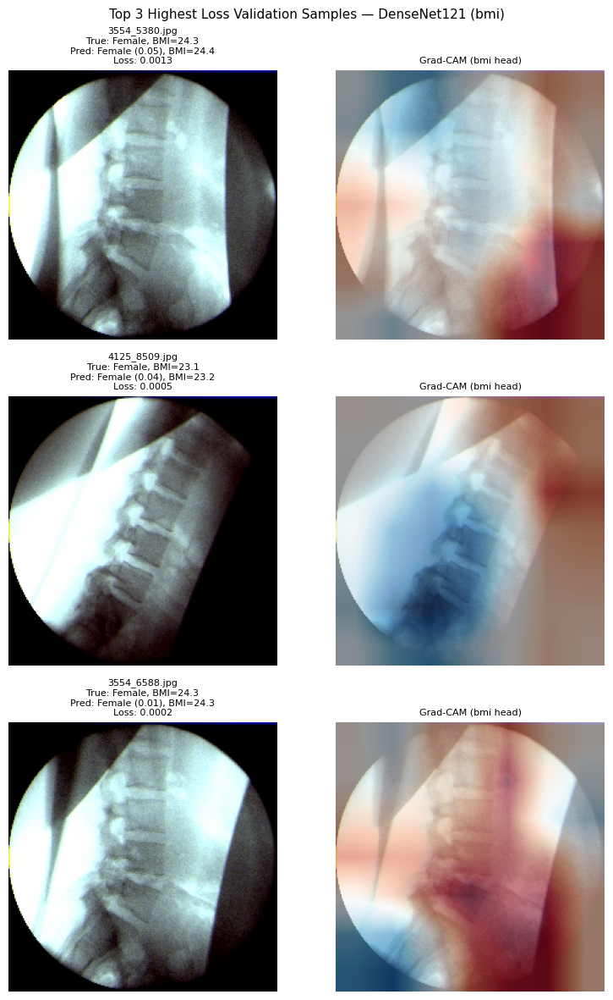

Saved -> gradcam_bmi_top3.png


In [72]:
target_layer = model.backbone.denseblock4   # <-- adjust per model

sex_samples = get_lowest_loss_samples_sex(model, val_df, scaler, val_transform, DEVICE, n=3)
bmi_samples = get_lowest_loss_samples_bmi(model, val_df, scaler, val_transform, DEVICE, n=3)

# Generate for sex head
plot_gradcam(model, sex_samples, target_layer, DEVICE, target="sex", label="DenseNet121")

# Generate for bmi head
plot_gradcam(model, bmi_samples, target_layer, DEVICE, target="bmi", label = "DenseNet121")

####Lowest Male Loss

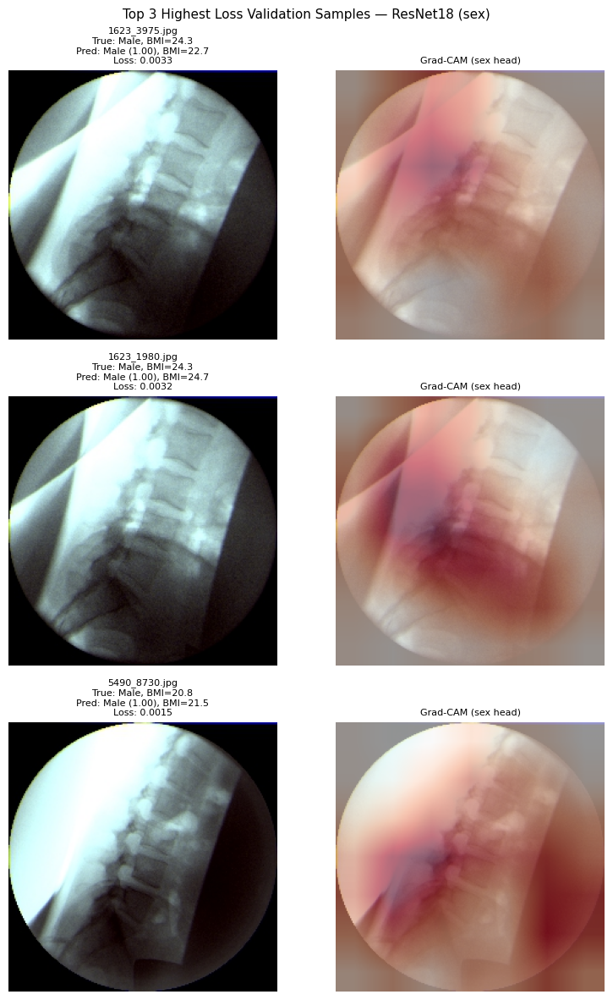

Saved -> gradcam_sex_top3.png


In [76]:
target_layer = model.backbone.denseblock4   # <-- adjust per model

male_samples = get_lowest_loss_samples_male(model, val_df, scaler, val_transform, DEVICE, n=3)

# Generate for sex head
plot_gradcam(model, male_samples, target_layer, DEVICE, target="sex", label="ResNet18")

## Evaluation Across Sex Groups (Fairness)

Both the male and female classes have very good performance on the validation set, with only 2 false positives for each class. However, the percentage error for female is 1.67% whereas for male it is 6.67%. Any error is not ideal and is what a data scientist strives to minimise, however, some error is inevitable, and of course the minority class is bound to take the majority of it, given regular circumstances such as the current scenario where both classes are of equal consequence.

In order to maximise fairness, steps should have been taken at the start to make sure that during training each class is represented equally, ideally by adding more of the minority class. If this equal representation were to be achieved by removing some of the majority class however, then whether this would maximise fairness would be up for debate; should the performance of the model on the majority and overrall suffer just to make it work better on the minority in proportion?

Running inference on validation set...


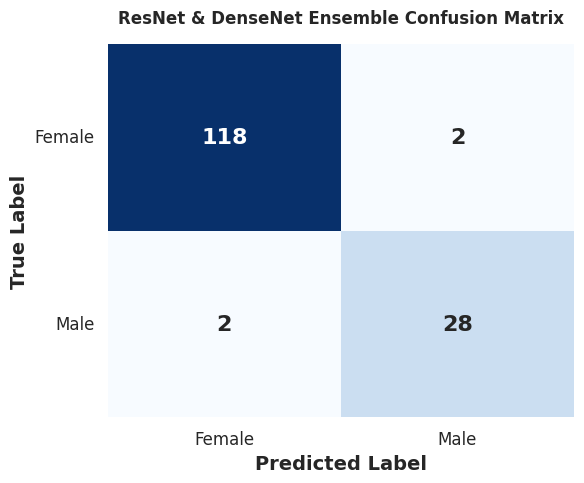

In [81]:
@torch.no_grad()
def plot_validation_confusion_matrix(model, val_loader, device, class_names=['Female', 'Male']):
    """
    Takes a model and validation loader, runs inference, and plots a
    seaborn confusion matrix for the binary classification head.
    """
    model.eval()

    all_true = []
    all_pred = []

    print("Running inference on validation set...")
    for images, sex_true, bmi_true in val_loader:
        images = images.to(device)

        # Get raw predictions (ignoring the BMI output for the confusion matrix)
        sex_logit, _ = model(images)

        # Convert logits to probabilities, then to binary predictions (0 or 1)
        sex_probs = torch.sigmoid(sex_logit)
        sex_preds = (sex_probs >= 0.5).int()

        all_true.extend(sex_true.cpu().numpy())
        all_pred.extend(sex_preds.cpu().numpy())

    # Convert to numpy arrays
    y_true = np.array(all_true)
    y_pred = np.array(all_pred)

    # Compute the confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Plot using Seaborn
    sns.set_theme(style="white")
    plt.figure(figsize=(6, 5))

    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                annot_kws={"size": 16, "weight": "bold"},
                xticklabels=class_names, yticklabels=class_names)

    plt.title(f'ResNet & DenseNet Ensemble Confusion Matrix', fontsize=12, fontweight='bold', pad=15)
    plt.ylabel('True Label', fontsize=14, fontweight='bold')
    plt.xlabel('Predicted Label', fontsize=14, fontweight='bold')

    # Optional: adjust tick label sizes for readability
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12, rotation=0)

    plt.tight_layout()
    plt.show()

# --- Example Usage ---
plot_validation_confusion_matrix(model=ensemble_model, val_loader=val_loader, device=DEVICE)

# Conclusion and Reflection

This project has investigated several types of CNN architecture to understand their performance in the inference of patient details from spinal X-ray images. It has found that these images can be interpretted using basic, scratch-trained CNNs with good performance. However, improved performance can be attained by using modern architectures and pre-trained weights, from models trained on general image datasets.

Contrary to logic, pre-training on X-ray datasets is not as beneficial as more general pre-training for this task.

For the task outlined in this project, ensembling of DenseNet121 and ResNet18, both pre-trained on ImageNet and then fine tuned on the given dataset, led to the greatest performance.

Future work could involve more advanced ensembling, such as:

*   Ensembling two k-folds ensembles of DenseNet and ResNet.
*   Favouring DenseNet within the ensemble for sex prediction and ResNet for BMI prediction (based on highest/lowest loss).
* Balance the ensemble weighting differently based on large differences in sex classification, for example if ResNet predicts close to 0 and DenseNet much closer to 1, side with DenseNet as male false positives are recognised as an error in ResNet (based on Comprehensive Validation Report).

Based on my findings, I would say that the architecture/structure of this estimator is reliable for deployment in the real world. However the model as it exists in this notebook is not; for it to be safe for deployment it would have to be tested extensively, such as across different X-ray machines, across different age groups, as well as being trained on a far larger corpus.


# Prediction Profiling

Loaded 195 predictions.
------------------------------
--- SEX PREDICTIONS ---
Class 0 (Female): 0
Class 1 (Male):   1

--- BMI PREDICTIONS ---
Mean BMI: 23.60
Min BMI:  20.76
Max BMI:  27.79
Std Dev:  1.65


/tmp/ipykernel_6719/1194230854.py:29: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=pred_df, x='sex', ax=axes[0], palette='pastel')
/tmp/ipykernel_6719/1194230854.py:31: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(['Class 0 (Female)', 'Class 1 (Male)'])
/tmp/ipykernel_6719/1194230854.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=pred_df, x='sex', y='bmi', ax=axes[2], palette='pastel')
/tmp/ipykernel_6719/1194230854.py:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[2].set_x

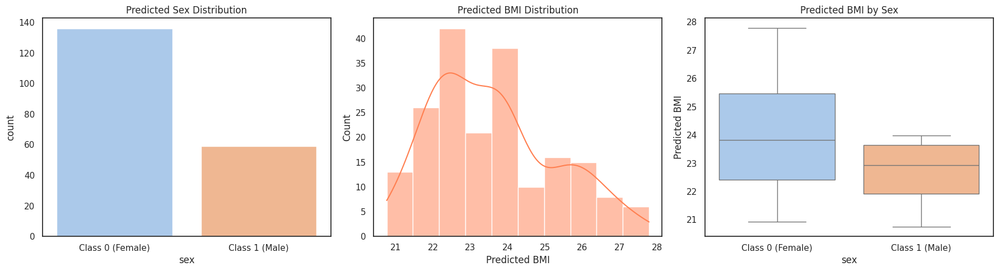

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def analyze_predictions(pred_csv):
    pred_df = pd.read_csv(pred_csv)

    print(f"Loaded {len(pred_df)} predictions.")
    print("-" * 30)

    # Print Summary Statistics
    sex_counts = pred_df['sex'].value_counts()
    print("--- SEX PREDICTIONS ---")
    print(f"Class 0 (Female): {sex_counts.get(0, 0)}")
    print(f"Class 1 (Male):   {sex_counts.get(1, 0)}")

    print("\n--- BMI PREDICTIONS ---")
    print(f"Mean BMI: {pred_df['bmi'].mean():.2f}")
    print(f"Min BMI:  {pred_df['bmi'].min():.2f}")
    print(f"Max BMI:  {pred_df['bmi'].max():.2f}")
    print(f"Std Dev:  {pred_df['bmi'].std():.2f}")

    # Generate Visualizations
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # Plot A: Count of Sex Predictions
    pred_df['sex'] = (pred_df['sex'] > 0.5).astype(int)
    sns.countplot(data=pred_df, x='sex', ax=axes[0], palette='pastel')
    axes[0].set_title('Predicted Sex Distribution')
    axes[0].set_xticklabels(['Class 0 (Female)', 'Class 1 (Male)'])

    # Plot B: Distribution of BMI Predictions
    sns.histplot(data=pred_df, x='bmi', kde=True, ax=axes[1], color='coral')
    axes[1].set_title('Predicted BMI Distribution')
    axes[1].set_xlabel('Predicted BMI')

    # Plot C: BMI Distribution separated by Sex
    sns.boxplot(data=pred_df, x='sex', y='bmi', ax=axes[2], palette='pastel')
    axes[2].set_title('Predicted BMI by Sex')
    axes[2].set_xticklabels(['Class 0 (Female)', 'Class 1 (Male)'])
    axes[2].set_ylabel('Predicted BMI')

    plt.tight_layout()
    plt.show()

analyze_predictions('2505_5_rndnavg.csv')

Loaded 195 predictions.
------------------------------
--- SEX PREDICTIONS ---
Class 0 (Female): 114
Class 1 (Male):   81

--- BMI PREDICTIONS ---
Mean BMI: 23.92
Min BMI:  20.17
Max BMI:  30.18
Std Dev:  1.85


/tmp/ipykernel_6719/224695627.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=pred_df, x='sex', ax=axes[0], palette='pastel')
/tmp/ipykernel_6719/224695627.py:30: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(['Class 0 (Female)', 'Class 1 (Male)'])
/tmp/ipykernel_6719/224695627.py:38: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=pred_df, x='sex', y='bmi', ax=axes[2], palette='pastel')
/tmp/ipykernel_6719/224695627.py:40: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[2].set_xtick

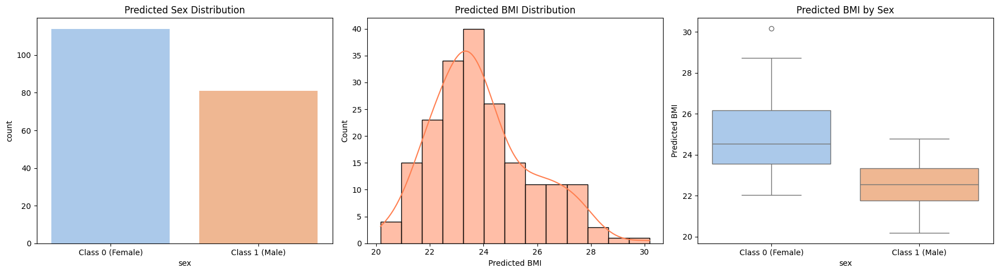

In [ ]:

def analyze_predictions_df(data):
    pred_df=data

    print(f"Loaded {len(pred_df)} predictions.")
    print("-" * 30)

    # Print Summary Statistics
    sex_counts = pred_df['sex'].value_counts()
    print("--- SEX PREDICTIONS ---")
    print(f"Class 0 (Female): {sex_counts.get(0, 0)}")
    print(f"Class 1 (Male):   {sex_counts.get(1, 0)}")

    print("\n--- BMI PREDICTIONS ---")
    print(f"Mean BMI: {pred_df['bmi'].mean():.2f}")
    print(f"Min BMI:  {pred_df['bmi'].min():.2f}")
    print(f"Max BMI:  {pred_df['bmi'].max():.2f}")
    print(f"Std Dev:  {pred_df['bmi'].std():.2f}")

    # Generate Visualizations
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # Plot A: Count of Sex Predictions
    pred_df['sex'] = (pred_df['sex'] > 0.5).astype(int)
    sns.countplot(data=pred_df, x='sex', ax=axes[0], palette='pastel')
    axes[0].set_title('Predicted Sex Distribution')
    axes[0].set_xticklabels(['Class 0 (Female)', 'Class 1 (Male)'])

    # Plot B: Distribution of BMI Predictions
    sns.histplot(data=pred_df, x='bmi', kde=True, ax=axes[1], color='coral')
    axes[1].set_title('Predicted BMI Distribution')
    axes[1].set_xlabel('Predicted BMI')

    # Plot C: BMI Distribution separated by Sex
    sns.boxplot(data=pred_df, x='sex', y='bmi', ax=axes[2], palette='pastel')
    axes[2].set_title('Predicted BMI by Sex')
    axes[2].set_xticklabels(['Class 0 (Female)', 'Class 1 (Male)'])
    axes[2].set_ylabel('Predicted BMI')

    plt.tight_layout()
    plt.show()

analyze_predictions_df(results_df)

Evaluating DenseNet (ImageNet) and ResNet18...


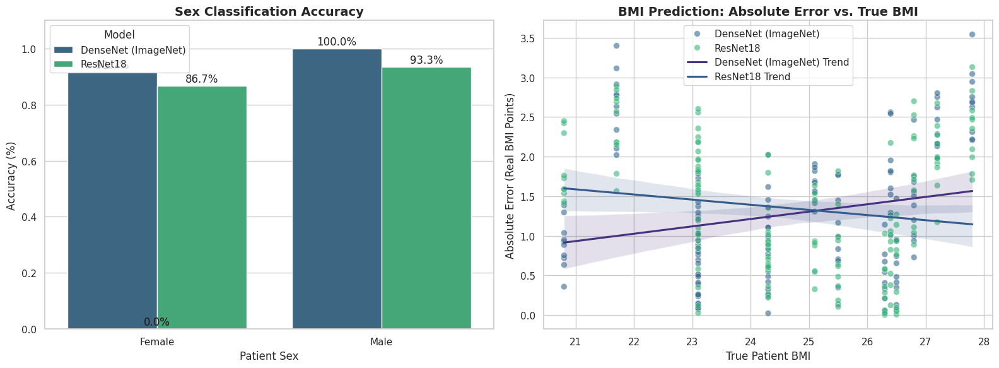

In [ ]:
def compare_models(model_a, model_b, model_a_name, model_b_name, val_loader, device, scaler):
    model_a.eval()
    model_b.eval()

    results = {
        'True_Sex': [], 'True_BMI': [],
        'Model_A_Sex_Prob': [], 'Model_A_BMI_Pred': [],
        'Model_B_Sex_Prob': [], 'Model_B_BMI_Pred': []
    }

    print(f"Evaluating {model_a_name} and {model_b_name}...")

    with torch.no_grad():
        for images, sex, bmi in val_loader:
            images = images.to(device)

            # Model A Predictions
            logit_a, bmi_a = model_a(images)
            results['Model_A_Sex_Prob'].extend(torch.sigmoid(logit_a).cpu().numpy())
            results['Model_A_BMI_Pred'].extend(bmi_a.cpu().numpy())

            # Model B Predictions
            logit_b, bmi_b = model_b(images)
            results['Model_B_Sex_Prob'].extend(torch.sigmoid(logit_b).cpu().numpy())
            results['Model_B_BMI_Pred'].extend(bmi_b.cpu().numpy())

            # Ground Truth
            results['True_Sex'].extend(sex.cpu().numpy())
            results['True_BMI'].extend(bmi.cpu().numpy())

    # 1. Build the DataFrame and Un-scale the BMI
    df = pd.DataFrame(results)

    # Inverse transform BMI to get real-world values
    df['True_BMI'] = scaler.inverse_transform(df[['True_BMI']]).flatten()
    df['Model_A_BMI_Pred'] = scaler.inverse_transform(df[['Model_A_BMI_Pred']]).flatten()
    df['Model_B_BMI_Pred'] = scaler.inverse_transform(df[['Model_B_BMI_Pred']]).flatten()

    # 2. Calculate Metrics
    # Threshold probabilities at 0.5 for classification
    df['Model_A_Sex_Pred'] = (df['Model_A_Sex_Prob'] >= 0.5).astype(int)
    df['Model_B_Sex_Pred'] = (df['Model_B_Sex_Prob'] >= 0.5).astype(int)

    df['Model_A_Correct'] = (df['Model_A_Sex_Pred'] == df['True_Sex']).astype(int)
    df['Model_B_Correct'] = (df['Model_B_Sex_Pred'] == df['True_Sex']).astype(int)

    df['Model_A_BMI_Error'] = np.abs(df['Model_A_BMI_Pred'] - df['True_BMI'])
    df['Model_B_BMI_Error'] = np.abs(df['Model_B_BMI_Pred'] - df['True_BMI'])

    # --- PLOTTING ---
    sns.set_theme(style="whitegrid")
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Plot 1: Sex Classification Accuracy by Group
    # Group by True Sex and calculate the mean of the "Correct" column (which equals accuracy)
    accuracy_df = df.groupby('True_Sex')[['Model_A_Correct', 'Model_B_Correct']].mean().reset_index()
    accuracy_df['True_Sex'] = accuracy_df['True_Sex'].map({0.0: 'Female', 1.0: 'Male'})

    # Melt dataframe for seaborn barplot
    acc_melted = accuracy_df.melt(id_vars='True_Sex', var_name='Model', value_name='Accuracy')
    acc_melted['Model'] = acc_melted['Model'].map({'Model_A_Correct': model_a_name, 'Model_B_Correct': model_b_name})

    sns.barplot(data=acc_melted, x='True_Sex', y='Accuracy', hue='Model', ax=axes[0], palette='viridis')
    axes[0].set_title('Sex Classification Accuracy', fontsize=14, fontweight='bold')
    axes[0].set_ylabel('Accuracy (%)')
    axes[0].set_xlabel('Patient Sex')
    axes[0].set_ylim(0, 1.1)

    # Add percentage labels on top of bars
    for p in axes[0].patches:
        axes[0].annotate(f"{p.get_height():.1%}", (p.get_x() + p.get_width() / 2., p.get_height()),
                         ha='center', va='center', xytext=(0, 8), textcoords='offset points')

    # Plot 2: BMI Absolute Error Profile
    # Melt dataframe for seaborn scatterplot
    bmi_error_melted = pd.DataFrame({
        'True_BMI': pd.concat([df['True_BMI'], df['True_BMI']]),
        'Absolute Error': pd.concat([df['Model_A_BMI_Error'], df['Model_B_BMI_Error']]),
        'Model': [model_a_name]*len(df) + [model_b_name]*len(df)
    })

    sns.scatterplot(data=bmi_error_melted, x='True_BMI', y='Absolute Error', hue='Model',
                    alpha=0.6, s=50, ax=axes[1], palette='viridis')

    # Add a trendline for both models to show how error scales with extreme BMIs
    sns.regplot(data=df, x='True_BMI', y='Model_A_BMI_Error', scatter=False, ax=axes[1],
                color=sns.color_palette("viridis")[0], label=f'{model_a_name} Trend')
    sns.regplot(data=df, x='True_BMI', y='Model_B_BMI_Error', scatter=False, ax=axes[1],
                color=sns.color_palette("viridis")[1], label=f'{model_b_name} Trend')

    axes[1].set_title('BMI Prediction: Absolute Error vs. True BMI', fontsize=14, fontweight='bold')
    axes[1].set_ylabel('Absolute Error (Real BMI Points)')
    axes[1].set_xlabel('True Patient BMI')
    axes[1].legend()

    plt.tight_layout()
    plt.show()

    return df

df_results = compare_models(
    model_a=model,
    model_b=model_rn,
    model_a_name="DenseNet (ImageNet)",
    model_b_name="ResNet18",
    val_loader=val_loader,
    device=DEVICE,
    scaler=scaler
)

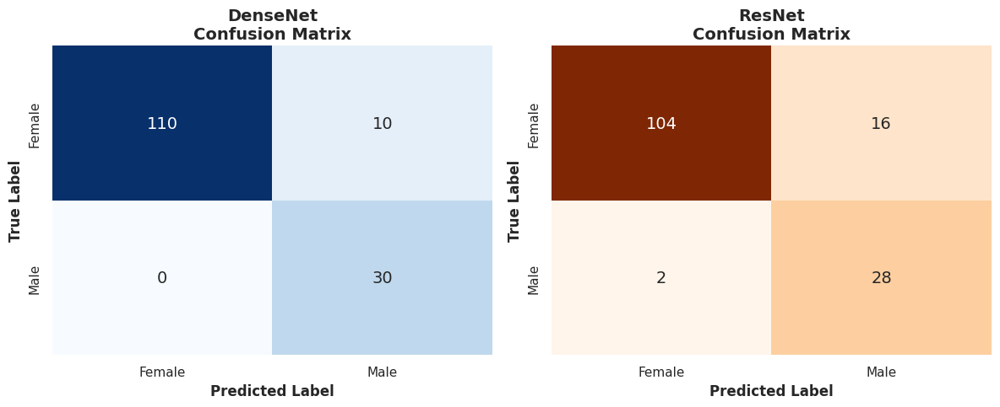

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def plot_head_to_head_confusion_matrices(df, model_a_name, model_b_name):
    """
    Takes the DataFrame generated by the compare_models function and plots
    side-by-side confusion matrices.
    """
    # 1. Extract the true labels and predictions
    y_true = df['True_Sex']
    y_pred_a = df['Model_A_Sex_Pred']
    y_pred_b = df['Model_B_Sex_Pred']

    # 2. Calculate the raw confusion matrices
    cm_a = confusion_matrix(y_true, y_pred_a)
    cm_b = confusion_matrix(y_true, y_pred_b)

    # 3. Set up the plotting canvas (1 row, 2 columns)
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    sns.set_theme(style="white") # Clean background for the report

    class_names = ['Female', 'Male']

    # --- Plot Model A (Left) ---
    sns.heatmap(cm_a, annot=True, fmt='d', cmap='Blues', cbar=False, annot_kws={"size": 14},
                xticklabels=class_names, yticklabels=class_names, ax=axes[0])
    axes[0].set_title(f'{model_a_name}\nConfusion Matrix', fontsize=14, fontweight='bold')
    axes[0].set_ylabel('True Label', fontsize=12, fontweight='bold')
    axes[0].set_xlabel('Predicted Label', fontsize=12, fontweight='bold')

    # --- Plot Model B (Right) ---
    sns.heatmap(cm_b, annot=True, fmt='d', cmap='Oranges', cbar=False, annot_kws={"size": 14},
                xticklabels=class_names, yticklabels=class_names, ax=axes[1])
    axes[1].set_title(f'{model_b_name}\nConfusion Matrix', fontsize=14, fontweight='bold')
    axes[1].set_ylabel('True Label', fontsize=12, fontweight='bold')
    axes[1].set_xlabel('Predicted Label', fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()


plot_head_to_head_confusion_matrices(df_results, "DenseNet", "ResNet")